<a href="https://colab.research.google.com/github/NunoBernardino/CIFO-Project/blob/osmainy/CIFO_main.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Step 1: Explore Data

In [ ]:
!pip install rich

In [84]:
import pandas as pd
import numpy as np
import random
import matplotlib.pyplot as plt
import time
import seaborn as sns
import matplotlib.pyplot as plt
from rich import print
from rich.console import Console
from rich.table import Table



In [85]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [86]:
# Load the dataset
artists_df = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/CIFO/artists(in).csv")

# Drop the 'Unnamed: 0' column if it exists
artists_df = artists_df.drop(columns=["Unnamed: 0"], errors="ignore")

# Set 'name' as the index
artists_df.set_index("name", inplace=True)

# Display the first few rows
artists_df

,genre,popularity
name,,
Midnight Echo,Rock,75
Solar Flare,Electronic,78
Velvet Pulse,Jazz,35
Neon Reverie,Electronic,100
The Silver Owls,Classical,85
Echo Chamber,Electronic,98
Aurora Skies,Pop,75
Static Mirage,Rock,94
Crimson Harmony,Classical,20


In [87]:
# Load the conflicts dataset
conflicts_df = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/CIFO/conflicts(in).csv")

# Set the artist names as the index for conflicts_df
conflicts_df.set_index(conflicts_df.columns[0], inplace=True)

# Display the first few rows of the conflicts matrix
conflicts_df.iloc[:5, :5]  # Displaying the top 5 rows and columns of the matrix

,Midnight Echo,Solar Flare,Velvet Pulse,Neon Reverie,The Silver Owls
Unnamed: 0,,,,,
Midnight Echo,0.0,0.0,0.0,0.2,0.5
Solar Flare,0.0,0.0,0.0,1.0,0.0
Velvet Pulse,0.0,0.0,0.0,1.0,0.5
Neon Reverie,0.2,1.0,1.0,0.0,0.2
The Silver Owls,0.5,0.0,0.5,0.2,0.0


# Step 2 - Cleaning and Preparing Data

We need to make sure that the data is in the correct format and that we have useful mappings to work with.

Artist to Index Mapping:
We map each artist’s name to an index (and vice versa) so we can easily access their data when constructing the lineup.

In [88]:
# Create a mapping from artist names to indices (for easier access in the GA)
name_to_index = {name: idx for idx, name in enumerate(artists_df.index)}

# Create the reverse mapping from index to artist names
index_to_name = {idx: name for name, idx in name_to_index.items()}

# Display mappings (Example: First 5 artists)
list(name_to_index.items())[:5]

[('Midnight Echo', 0),
 ('Solar Flare', 1),
 ('Velvet Pulse', 2),
 ('Neon Reverie', 3),
 ('The Silver Owls', 4)]

In [89]:
# Example: Check conflict between two artists
conflict_value = conflicts_df.loc['Midnight Echo', 'The Silver Owls']
print(f"Conflict between Midnight Echo and The Silver Owls: {conflict_value}")

Conflict between Midnight Echo and The Silver Owls: 0.5


artists_df: Artist data, with name as the index.

conflicts_df: Conflict matrix, with artist names as both rows and columns.

Mappings: name_to_index and index_to_name for easy reference in your GA.

# Step 3 - Fitness Function

The fitness function evaluates how good each individual (lineup) is based on three key objectives:

Prime Slot Popularity: We aim to assign the most popular artists to the prime slots (the last time slot of each stage).

Genre Diversity: We want to maximize genre diversity in each time slot across stages, ensuring different genres are present.

Conflict Penalty: We aim to minimize conflicts between artists that have overlapping fan bases when scheduled at the same time.

In [90]:
def compute_fitness(lineup, artists_df, conflicts_df, prime_slot_weight=0.4, genre_weight=0.35, conflict_weight=0.25):
    # Number of stages and time slots
    num_stages = 5
    num_slots = 7

    # Prime Slot Popularity (last time slot of each stage)
    prime_slot_popularity = 0
    for stage in range(num_stages):
        artist_idx = lineup[stage][-1]  # Last slot in each stage
        prime_slot_popularity += artists_df.iloc[artist_idx]["popularity"]
    max_prime_popularity = 100 * num_stages  # If all artists have max popularity
    prime_slot_popularity = prime_slot_popularity / max_prime_popularity  # Normalize

    # Genre Diversity (across all time slots)
    genre_diversity = 0
    for slot in range(num_slots):
        genres_in_slot = set()
        for stage in range(num_stages):
            artist_idx = lineup[stage][slot]
            genre = artists_df.iloc[artist_idx]["genre"]
            genres_in_slot.add(genre)
        genre_diversity += len(genres_in_slot)
    max_genre_diversity = num_slots * num_stages  # Max diversity is when all genres are unique
    genre_diversity = genre_diversity / max_genre_diversity  # Normalize

    # Conflict Penalty (artists scheduled at the same time)
    conflict_penalty = 0
    for slot in range(num_slots):
        for stage1 in range(num_stages):
            artist1_idx = lineup[stage1][slot]
            for stage2 in range(stage1 + 1, num_stages):
                artist2_idx = lineup[stage2][slot]
                conflict_penalty += conflicts_df.iloc[artist1_idx, artist2_idx]
    max_conflict_penalty = num_slots * num_stages * (num_stages - 1) / 2  # Max possible conflict penalty
    conflict_penalty = conflict_penalty / max_conflict_penalty  # Normalize

    # Weighted sum of the three objectives based on passed weights
    fitness = prime_slot_weight * prime_slot_popularity + genre_weight * genre_diversity - conflict_weight * conflict_penalty
    return fitness


In the GA, each individual represents a festival lineup, where:

We have 5 stages and 7 time slots per stage.

Each time slot on a stage is filled by an artist.

This lineup can be represented as a 2D list (or matrix), where:

The rows represent the stages.

The columns represent the time slots.

Each entry in the matrix holds the index of an artist assigned to that time slot on that stage.

In [91]:
def generate_unique_lineup(artists_df):
    # Create a list of available artist indices
    available_artists = list(range(len(artists_df)))

    # Shuffle the available artists to randomize their order
    random.shuffle(available_artists)

    # Create an empty list to hold the lineup (5 stages, 7 slots each)
    lineup = []

    # Assign artists to each stage and time slot, ensuring no artist is used more than once
    artist_idx = 0  # Index to track artists
    for stage in range(5):  # 5 stages
        stage_lineup = []
        for slot in range(7):  # 7 time slots per stage
            # Assign the next available artist to the slot and move to the next artist
            stage_lineup.append(available_artists[artist_idx])
            artist_idx += 1  # Move to the next artist
        lineup.append(stage_lineup)  # Add the stage lineup to the overall festival lineup

    # Check for duplicates in the entire lineup
    all_artists = [artist for stage in lineup for artist in stage]
    if len(all_artists) != len(set(all_artists)):  # Check if there are duplicates
        print("Duplicate artists found! This lineup is invalid.")
        return None  # Return None if the lineup is invalid (duplicates found)

    return lineup  # Return the valid lineup

# Initialize population with random lineups
def initialize_population(pop_size, artists_df):
    population = []
    while len(population) < pop_size:
        lineup = generate_unique_lineup(artists_df)
        if lineup is not None:  # Only append valid lineups
            population.append(lineup)
    return population

# Generate a random lineup
random_lineup = generate_unique_lineup(artists_df)

# Compute the fitness of the random lineup using the fitness function
fitness = compute_fitness(random_lineup, artists_df, conflicts_df)

# Print the result
print(f"Fitness of the random lineup: {fitness}")

Fitness of the random lineup: 0.4465214285714286


# Step 4 - Genetic Algorithm

## Step 4.1 - Mutation Operators

Swap Mutation: Randomly swap two artists in the same stage.

Shift Mutation: Shift all artists in a stage by one time slot.

Reassign Mutation: Randomly reassign an artist to a different time slot.

In [92]:
# Swap Mutation: Swap two artists in the lineup
def swap_mutation(lineup, artists_df):
    stage = random.randint(0, 4)  # Random stage
    slot1, slot2 = random.sample(range(7), 2)  # Random time slots
    lineup[stage][slot1], lineup[stage][slot2] = lineup[stage][slot2], lineup[stage][slot1]
    return lineup

# Shift Mutation: Shift artists in a stage by one slot
def shift_mutation(lineup, artists_df):
    stage = random.randint(0, 4)  # Random stage
    shifted_stage = lineup[stage][1:] + [lineup[stage][0]]  # Shift the stage
    lineup[stage] = shifted_stage
    return lineup

# Reassign Mutation: Randomly reassign an artist to another time slot
def reassign_mutation(lineup, artists_df):
    stage = random.randint(0, 4)  # Random stage
    slot = random.randint(0, 6)  # Random time slot
    artist_idx = random.randint(0, len(artists_df) - 1)  # Random artist index
    lineup[stage][slot] = artist_idx  # Reassign artist
    return lineup

# Combined mutation function to choose from multiple mutation types
def mutate(lineup, artists_df, mutation_rate=0.2):
    if random.random() < mutation_rate:
        mutation_type = random.choice([swap_mutation, shift_mutation, reassign_mutation])
        lineup = mutation_type(lineup, artists_df)

        # Check if the mutated lineup is valid (no duplicates)
        all_artists = [artist for stage in lineup for artist in stage]
        if len(all_artists) != len(set(all_artists)):  # Check for duplicates
            print("Duplicate artists found after mutation! This mutation is invalid.")
            return lineup  # Return the original lineup if mutation is invalid

    return lineup

def valid_mutate(lineup, artists_df, mutation_rate=0.2):
    if random.random() < mutation_rate:
        mutation_func = random.choice([swap_mutation, shift_mutation, reassign_mutation])
        mutated_lineup = mutation_func(lineup, artists_df)

        # Check for duplicates across the lineup
        all_artists = [artist for stage in mutated_lineup for artist in stage]
        if len(all_artists) != len(set(all_artists)):  # Check if there are duplicates
            return None, mutation_func.__name__  # Return mutation name even if invalid

        return mutated_lineup, mutation_func.__name__

    return lineup, "none"


## Step 4.2 - Crossover Operators

Single-point Crossover: Split at a random point and swap the remaining part.

Uniform Crossover: Randomly select an artist from one parent or the other for each time slot.

In [93]:
# Single-point crossover
def single_point_crossover(parent1, parent2):
    crossover_point = random.randint(1, 6)
    offspring = []
    for stage in range(5):
        offspring.append(parent1[stage][:crossover_point] + parent2[stage][crossover_point:])
    return offspring

# Uniform crossover
def uniform_crossover(parent1, parent2):
    offspring = []
    for stage in range(5):
        stage_lineup = []
        for slot in range(7):
            if random.random() < 0.5:
                stage_lineup.append(parent1[stage][slot])
            else:
                stage_lineup.append(parent2[stage][slot])
        offspring.append(stage_lineup)
    return offspring

def valid_crossover(parent1, parent2):
    # Perform crossover to generate offspring
    offspring = uniform_crossover(parent1, parent2)  # You can also use single-point crossover

    # Check for duplicates across the entire offspring lineup (all stages and time slots)
    all_artists = [artist for stage in offspring for artist in stage]
    if len(all_artists) != len(set(all_artists)):  # Check if there are duplicates
        return None  # Return None if crossover is invalid (without printing anything)

    return offspring  # Return the valid offspring

## Step 4.3 - Selection Mechanisms

Tournament Selection selects parents by running a "tournament" between a few randomly chosen individuals from the population. The best individual from the tournament (i.e., the one with the highest fitness) is selected to be a parent.

Roulette Wheel Selection (also known as fitness-proportional selection) selects parents based on their fitness scores. Individuals with higher fitness have a higher probability of being selected.

In [94]:
# Tournament Selection
def tournament_selection(population, artists_df, conflicts_df, tournament_size=3):
    tournament = random.sample(population, tournament_size)
    tournament_fitness = [compute_fitness(lineup, artists_df, conflicts_df) for lineup in tournament]
    best_idx = tournament_fitness.index(max(tournament_fitness))
    return tournament[best_idx]

# Roulette Wheel Selection
def roulette_wheel_selection(population, fitness_scores):
    total_fitness = sum(fitness_scores)
    selection_probs = [fitness / total_fitness for fitness in fitness_scores]
    selected_idx = np.random.choice(len(population), p=selection_probs)
    return population[selected_idx]

Elitism ensures that the best solutions are always part of the next generation, preventing the possibility of losing high-quality solutions due to the randomness of mutation and crossover.

In [95]:
# Elitism function: Carry over top individuals
def elitism(population, fitness_scores, num_elites=2):
    elite_indices = np.argsort(fitness_scores)[-num_elites:]
    elites = [population[i] for i in elite_indices]
    return elites

Running GA with - Generations: 50, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.1, Elitism: True, Selection Method: tournament, Mutation: swap_mutation, Crossover: uniform_crossover


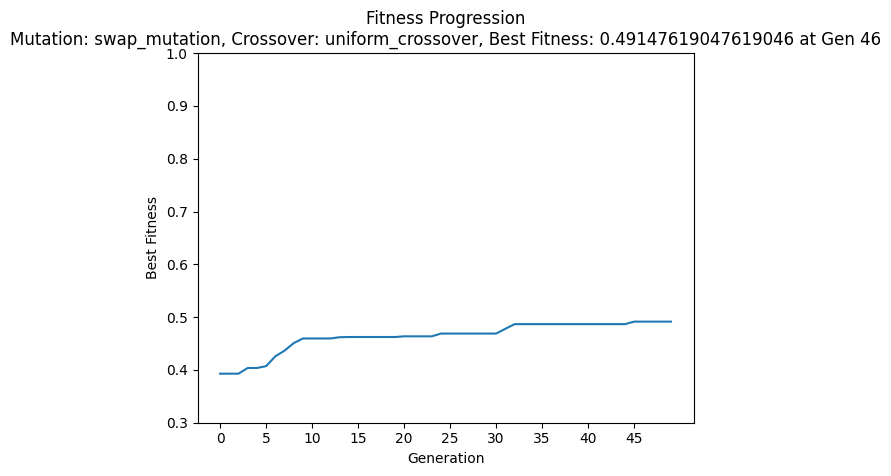

Best Fitness for this configuration: 0.49147619047619046 at Generation 46
Running GA with - Generations: 50, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.1, Elitism: True, Selection Method: tournament, Mutation: swap_mutation, Crossover: single_point_crossover


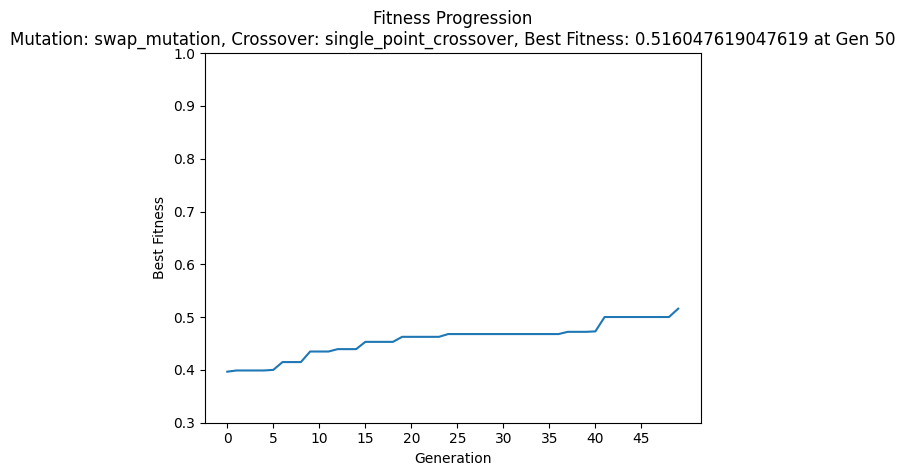

Best Fitness for this configuration: 0.516047619047619 at Generation 50
Running GA with - Generations: 50, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.1, Elitism: True, Selection Method: tournament, Mutation: shift_mutation, Crossover: uniform_crossover


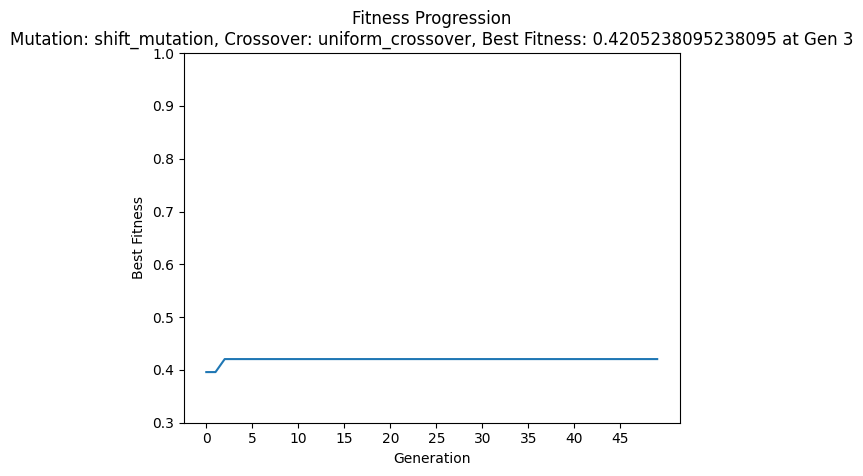

Best Fitness for this configuration: 0.4205238095238095 at Generation 3
Running GA with - Generations: 50, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.1, Elitism: True, Selection Method: tournament, Mutation: shift_mutation, Crossover: single_point_crossover


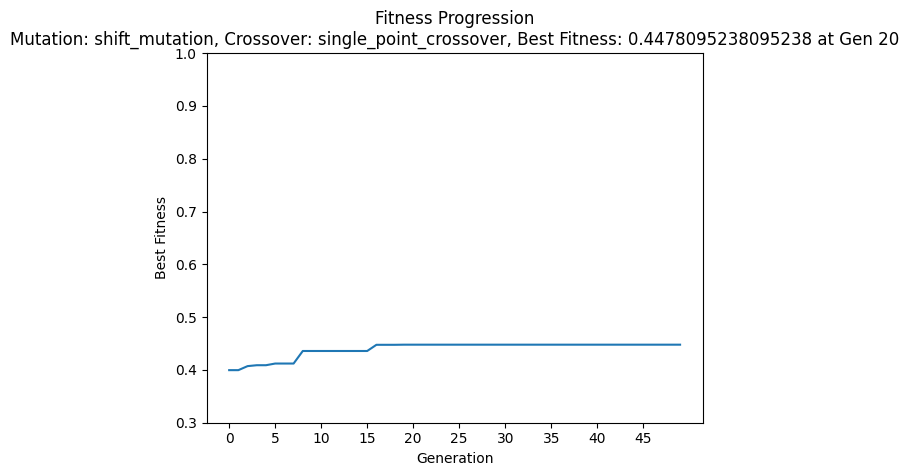

Best Fitness for this configuration: 0.4478095238095238 at Generation 20
Running GA with - Generations: 50, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.1, Elitism: True, Selection Method: tournament, Mutation: reassign_mutation, Crossover: uniform_crossover


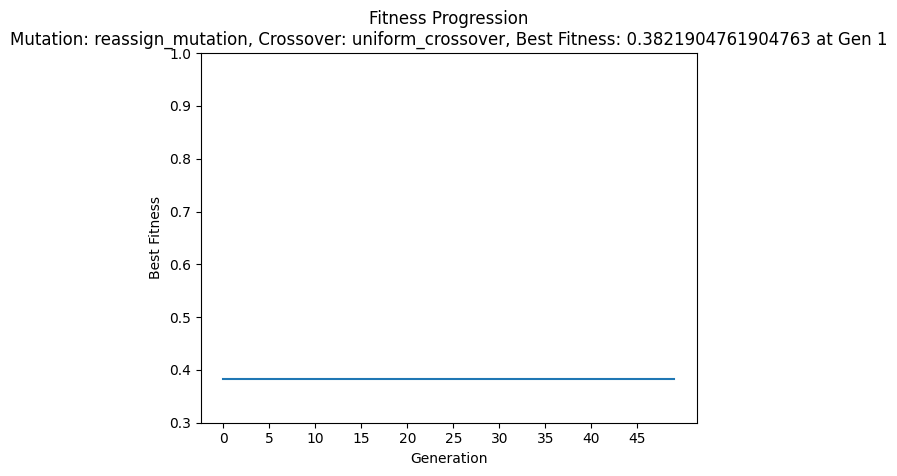

Best Fitness for this configuration: 0.3821904761904763 at Generation 1
Running GA with - Generations: 50, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.1, Elitism: True, Selection Method: tournament, Mutation: reassign_mutation, Crossover: single_point_crossover


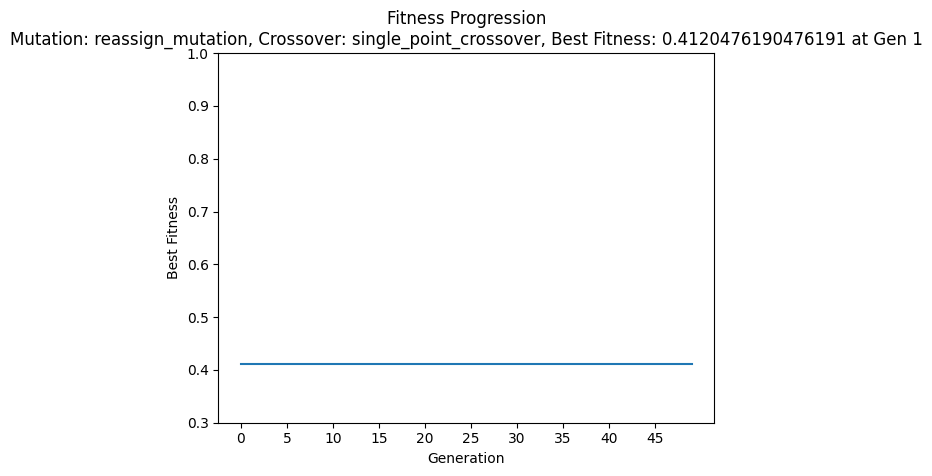

Best Fitness for this configuration: 0.4120476190476191 at Generation 1
Running GA with - Generations: 125, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.1, Elitism: True, Selection Method: tournament, Mutation: swap_mutation, Crossover: uniform_crossover


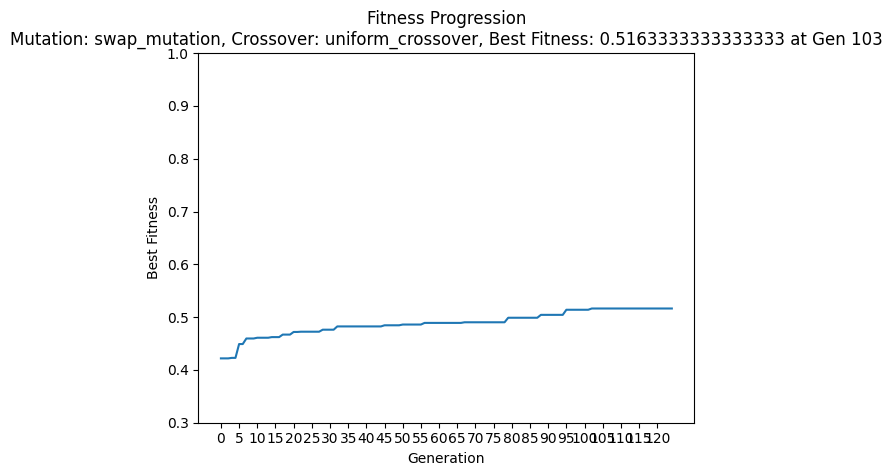

Best Fitness for this configuration: 0.5163333333333333 at Generation 103
Running GA with - Generations: 125, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.1, Elitism: True, Selection Method: tournament, Mutation: swap_mutation, Crossover: single_point_crossover


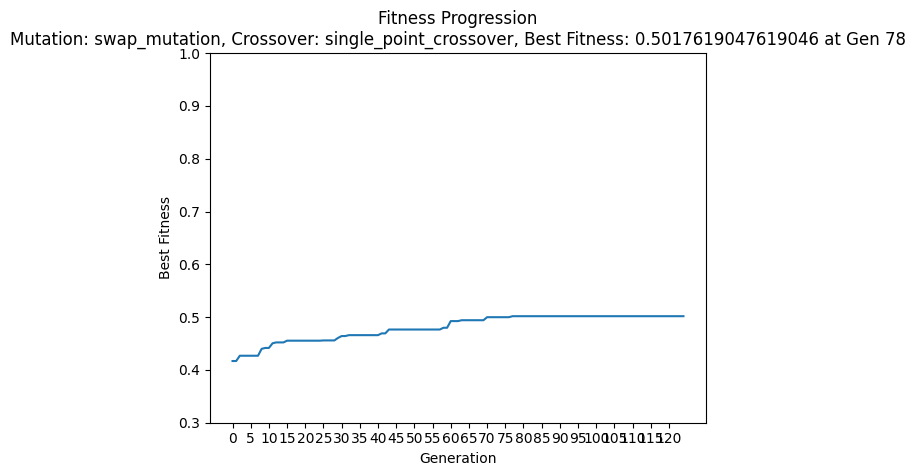

Best Fitness for this configuration: 0.5017619047619046 at Generation 78
Running GA with - Generations: 125, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.1, Elitism: True, Selection Method: tournament, Mutation: shift_mutation, Crossover: uniform_crossover


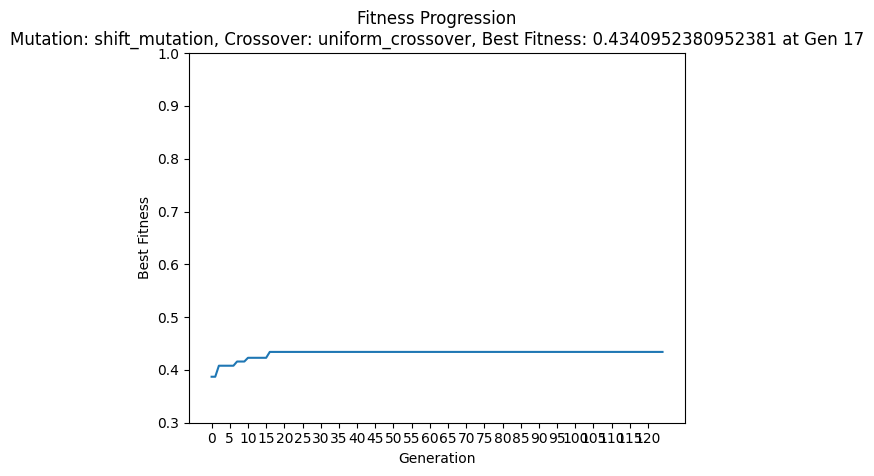

Best Fitness for this configuration: 0.4340952380952381 at Generation 17
Running GA with - Generations: 125, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.1, Elitism: True, Selection Method: tournament, Mutation: shift_mutation, Crossover: single_point_crossover


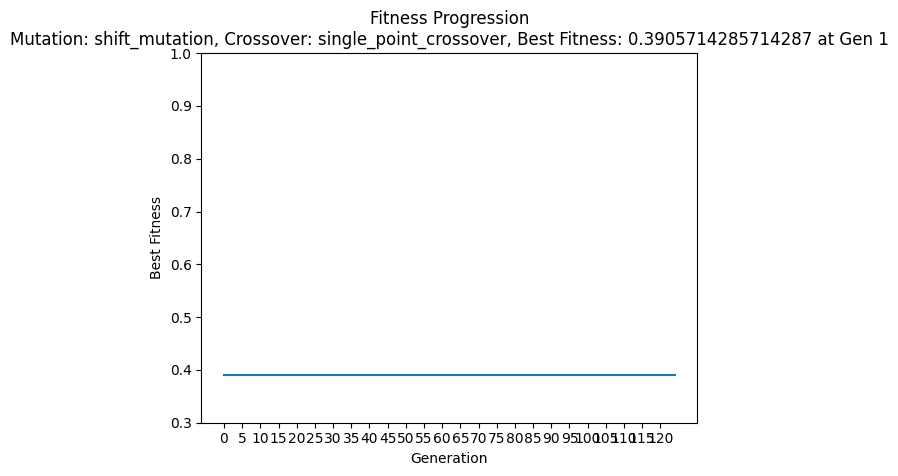

Best Fitness for this configuration: 0.3905714285714287 at Generation 1
Running GA with - Generations: 125, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.1, Elitism: True, Selection Method: tournament, Mutation: reassign_mutation, Crossover: uniform_crossover


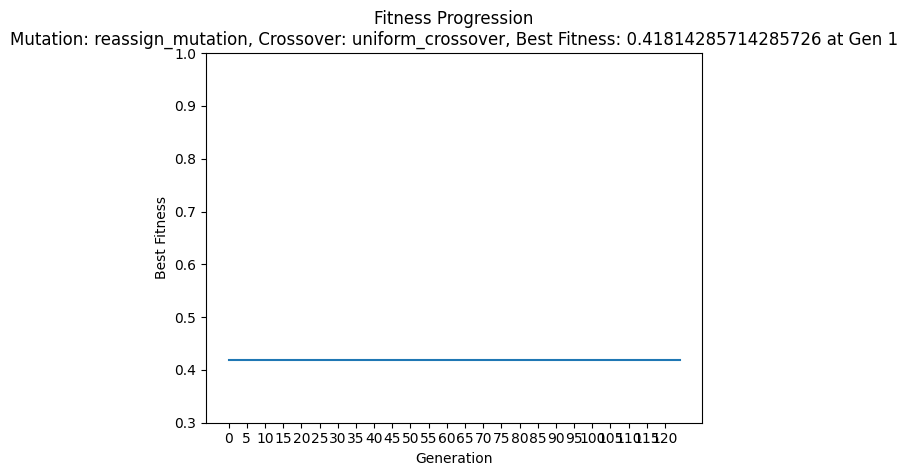

Best Fitness for this configuration: 0.41814285714285726 at Generation 1
Running GA with - Generations: 125, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.1, Elitism: True, Selection Method: tournament, Mutation: reassign_mutation, Crossover: single_point_crossover


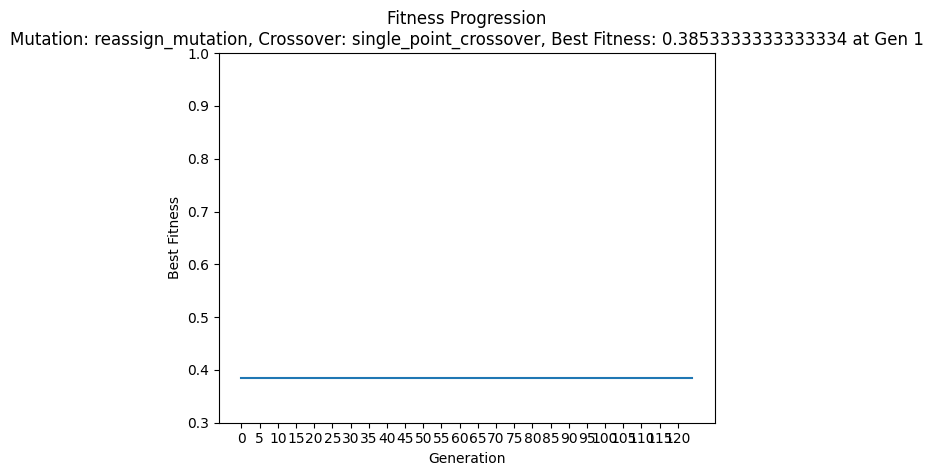

Best Fitness for this configuration: 0.3853333333333334 at Generation 1
Running GA with - Generations: 200, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.1, Elitism: True, Selection Method: tournament, Mutation: swap_mutation, Crossover: uniform_crossover


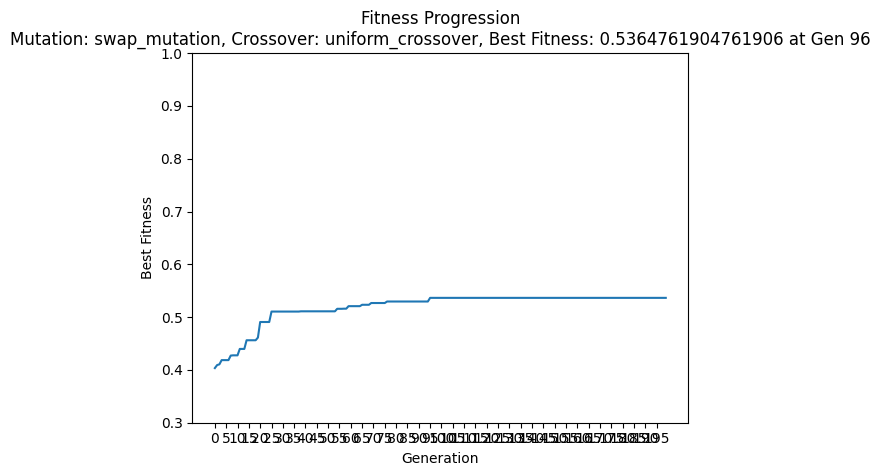

Best Fitness for this configuration: 0.5364761904761906 at Generation 96
Running GA with - Generations: 200, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.1, Elitism: True, Selection Method: tournament, Mutation: swap_mutation, Crossover: single_point_crossover


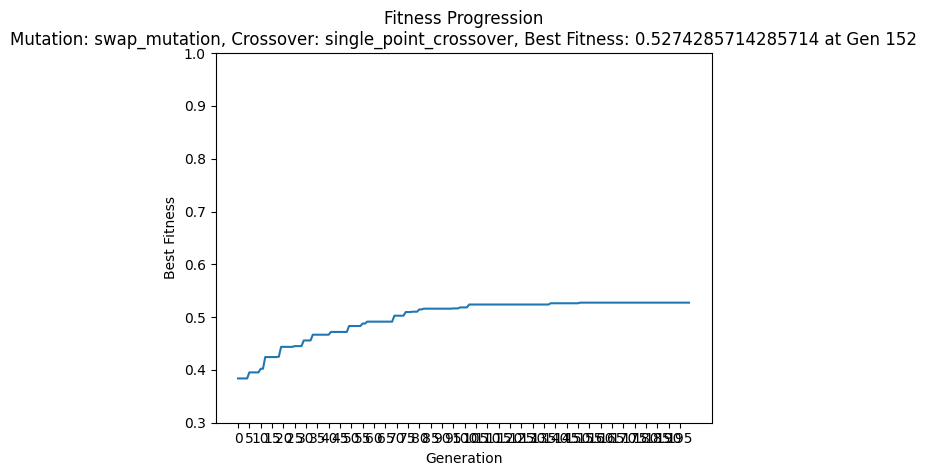

Best Fitness for this configuration: 0.5274285714285714 at Generation 152
Running GA with - Generations: 200, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.1, Elitism: True, Selection Method: tournament, Mutation: shift_mutation, Crossover: uniform_crossover


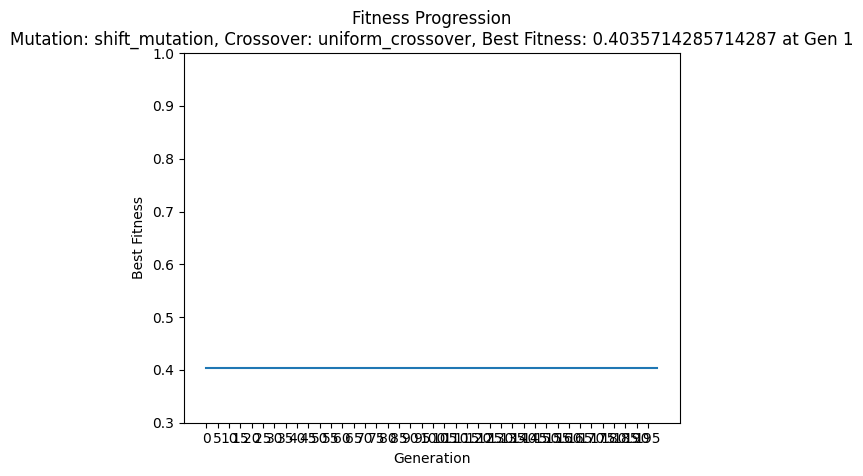

Best Fitness for this configuration: 0.4035714285714287 at Generation 1
Running GA with - Generations: 200, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.1, Elitism: True, Selection Method: tournament, Mutation: shift_mutation, Crossover: single_point_crossover


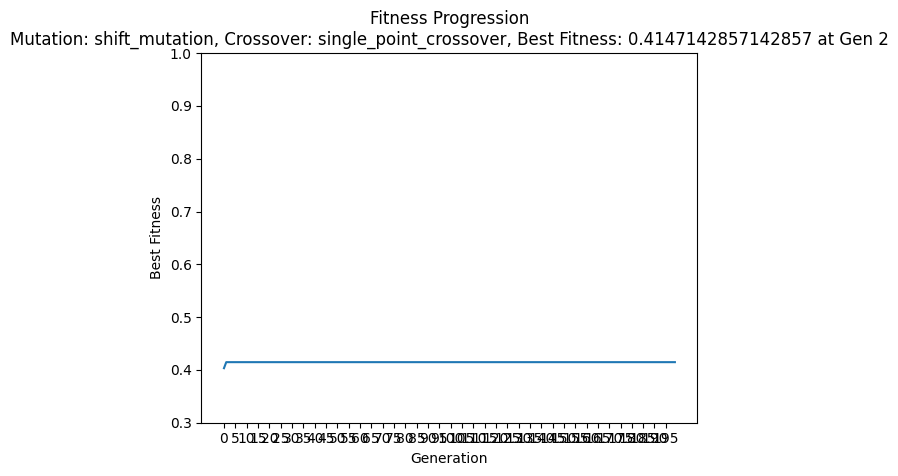

Best Fitness for this configuration: 0.4147142857142857 at Generation 2
Running GA with - Generations: 200, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.1, Elitism: True, Selection Method: tournament, Mutation: reassign_mutation, Crossover: uniform_crossover


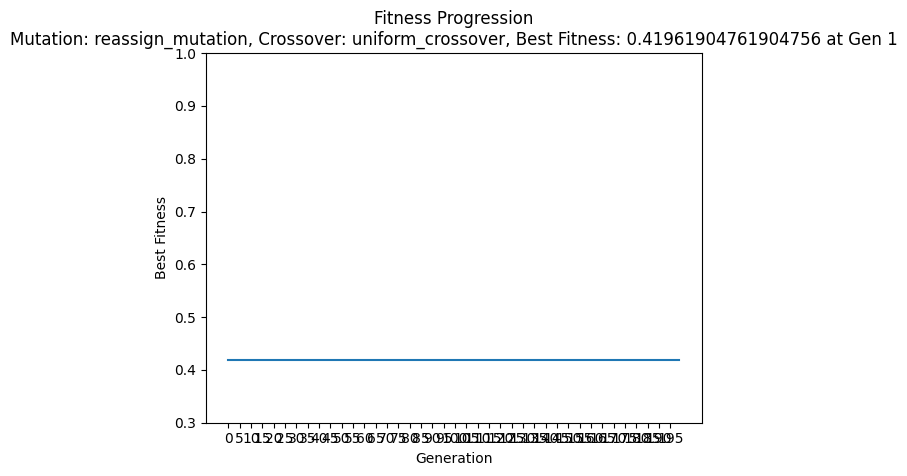

Best Fitness for this configuration: 0.41961904761904756 at Generation 1
Running GA with - Generations: 200, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.1, Elitism: True, Selection Method: tournament, Mutation: reassign_mutation, Crossover: single_point_crossover


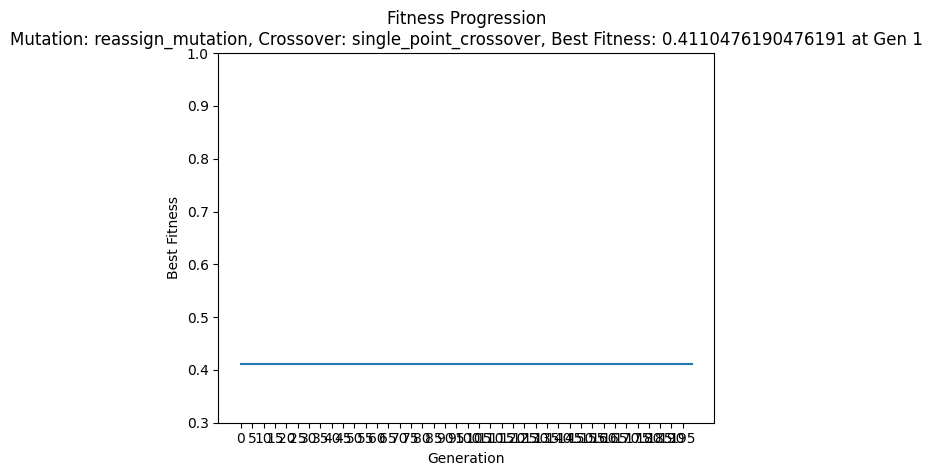

Best Fitness for this configuration: 0.4110476190476191 at Generation 1
Running GA with - Generations: 50, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.1, Elitism: True, Selection Method: roulette, Mutation: swap_mutation, Crossover: uniform_crossover


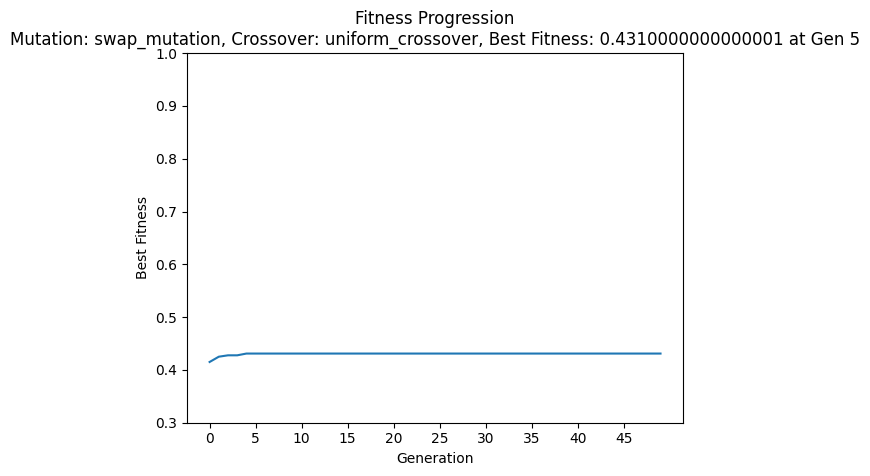

Best Fitness for this configuration: 0.4310000000000001 at Generation 5
Running GA with - Generations: 50, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.1, Elitism: True, Selection Method: roulette, Mutation: swap_mutation, Crossover: single_point_crossover


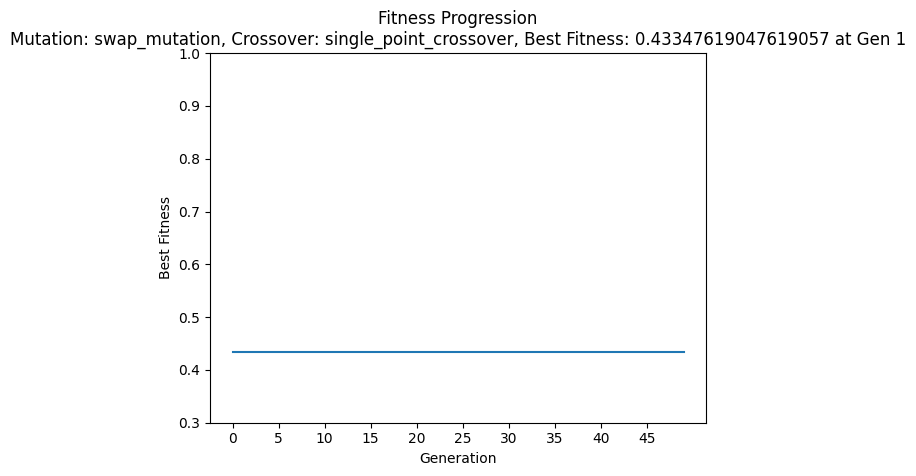

Best Fitness for this configuration: 0.43347619047619057 at Generation 1
Running GA with - Generations: 50, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.1, Elitism: True, Selection Method: roulette, Mutation: shift_mutation, Crossover: uniform_crossover


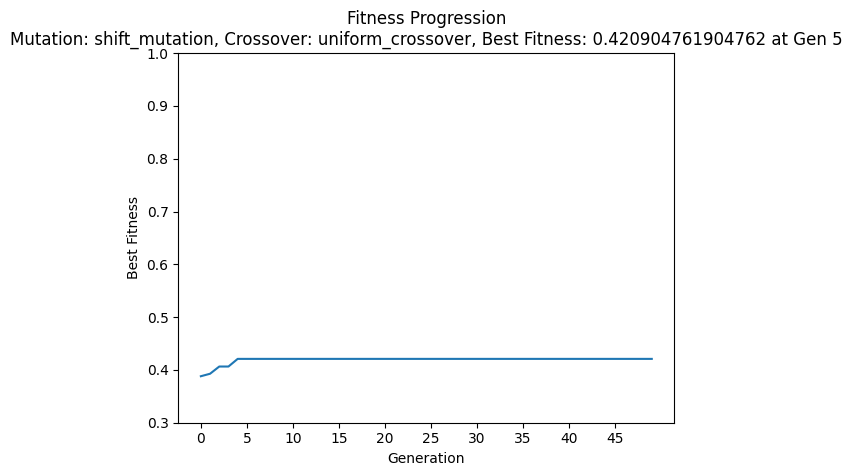

Best Fitness for this configuration: 0.420904761904762 at Generation 5
Running GA with - Generations: 50, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.1, Elitism: True, Selection Method: roulette, Mutation: shift_mutation, Crossover: single_point_crossover


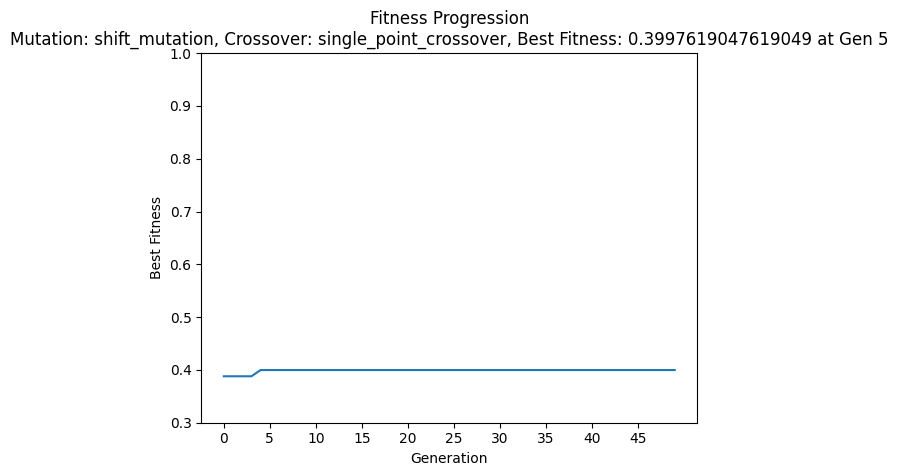

Best Fitness for this configuration: 0.3997619047619049 at Generation 5
Running GA with - Generations: 50, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.1, Elitism: True, Selection Method: roulette, Mutation: reassign_mutation, Crossover: uniform_crossover


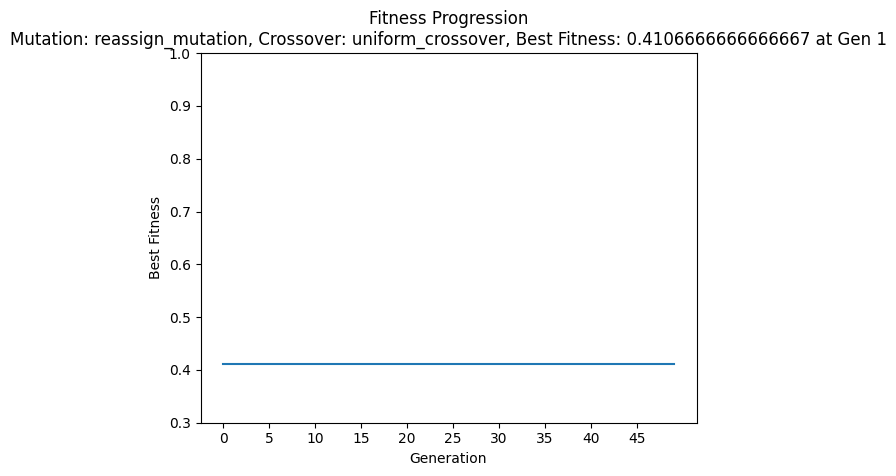

Best Fitness for this configuration: 0.4106666666666667 at Generation 1
Running GA with - Generations: 50, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.1, Elitism: True, Selection Method: roulette, Mutation: reassign_mutation, Crossover: single_point_crossover


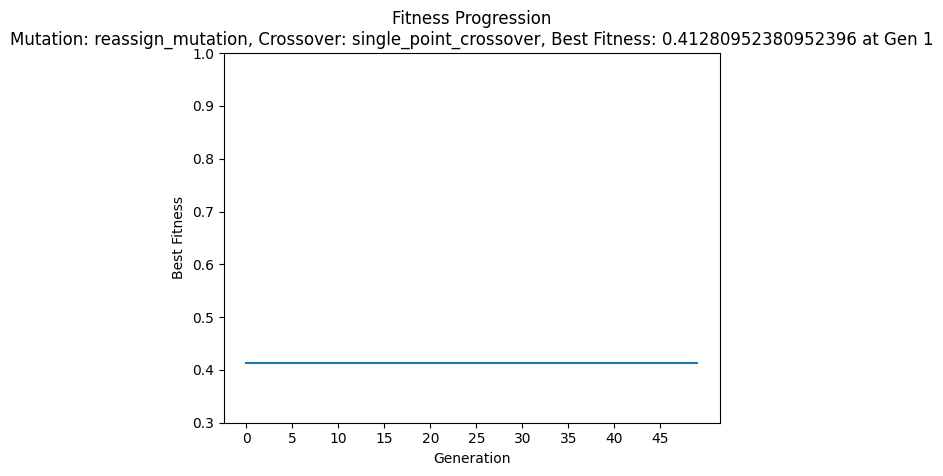

Best Fitness for this configuration: 0.41280952380952396 at Generation 1
Running GA with - Generations: 125, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.1, Elitism: True, Selection Method: roulette, Mutation: swap_mutation, Crossover: uniform_crossover


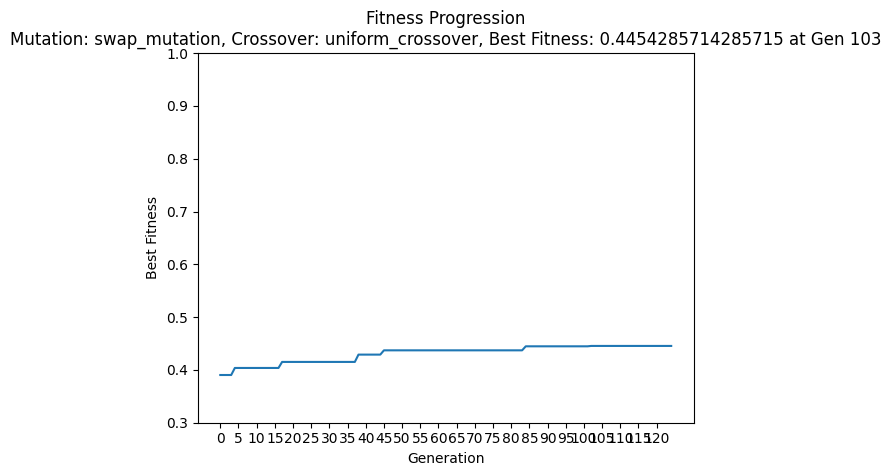

Best Fitness for this configuration: 0.4454285714285715 at Generation 103
Running GA with - Generations: 125, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.1, Elitism: True, Selection Method: roulette, Mutation: swap_mutation, Crossover: single_point_crossover


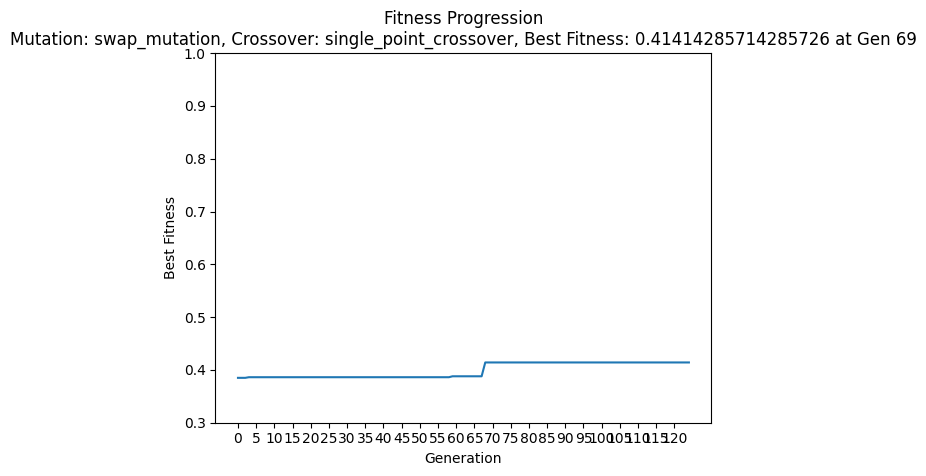

Best Fitness for this configuration: 0.41414285714285726 at Generation 69
Running GA with - Generations: 125, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.1, Elitism: True, Selection Method: roulette, Mutation: shift_mutation, Crossover: uniform_crossover


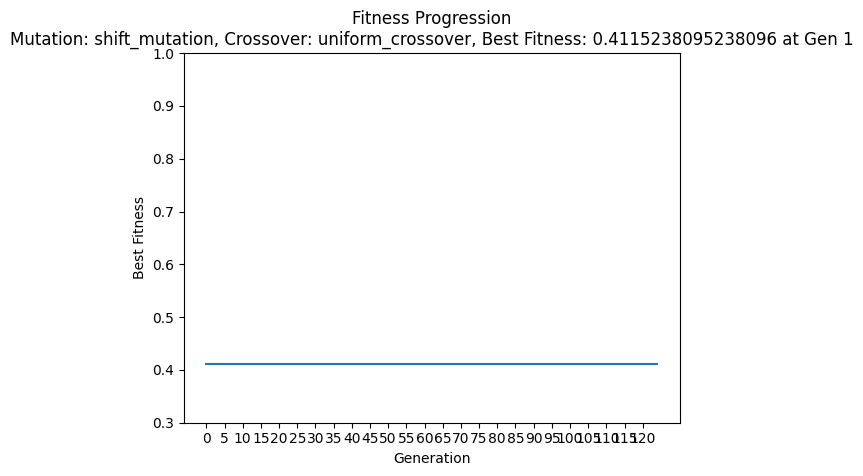

Best Fitness for this configuration: 0.4115238095238096 at Generation 1
Running GA with - Generations: 125, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.1, Elitism: True, Selection Method: roulette, Mutation: shift_mutation, Crossover: single_point_crossover


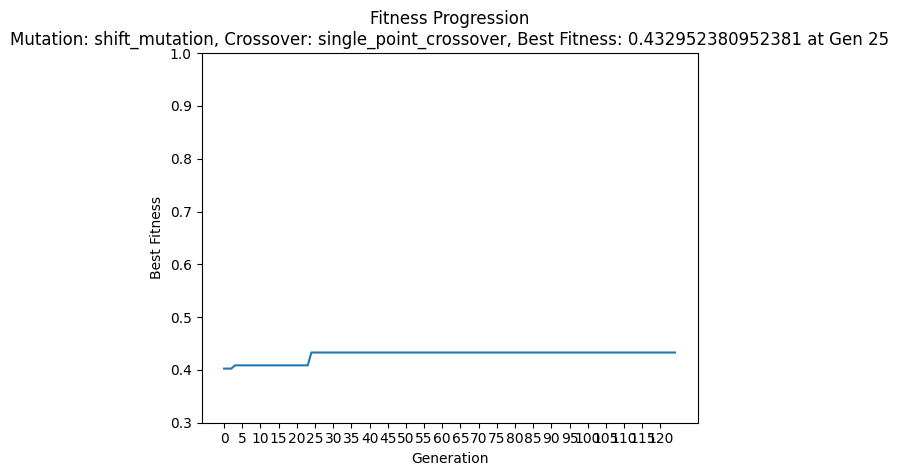

Best Fitness for this configuration: 0.432952380952381 at Generation 25
Running GA with - Generations: 125, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.1, Elitism: True, Selection Method: roulette, Mutation: reassign_mutation, Crossover: uniform_crossover


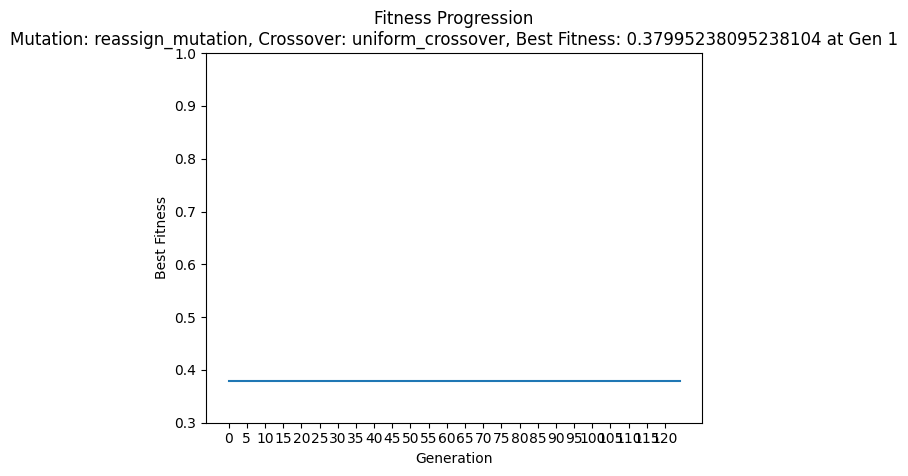

Best Fitness for this configuration: 0.37995238095238104 at Generation 1
Running GA with - Generations: 125, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.1, Elitism: True, Selection Method: roulette, Mutation: reassign_mutation, Crossover: single_point_crossover


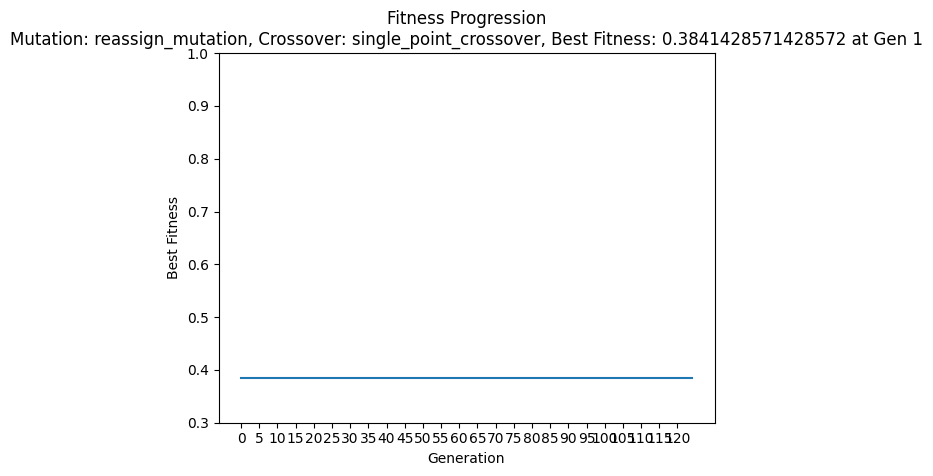

Best Fitness for this configuration: 0.3841428571428572 at Generation 1
Running GA with - Generations: 200, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.1, Elitism: True, Selection Method: roulette, Mutation: swap_mutation, Crossover: uniform_crossover


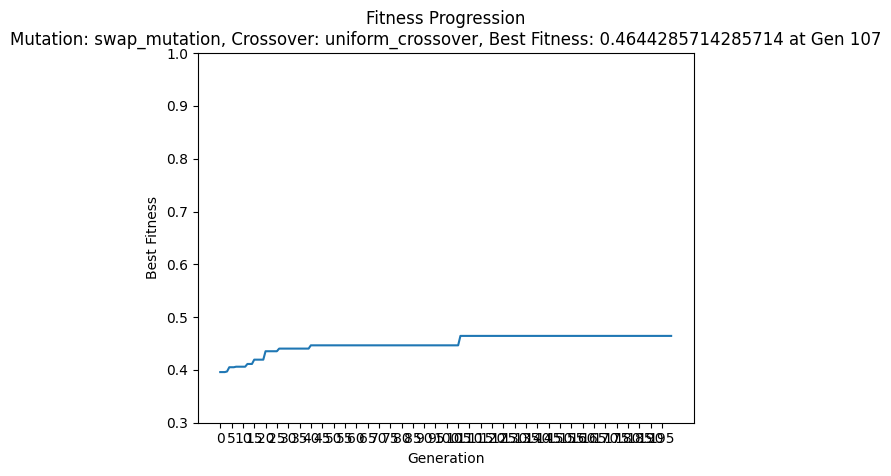

Best Fitness for this configuration: 0.4644285714285714 at Generation 107
Running GA with - Generations: 200, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.1, Elitism: True, Selection Method: roulette, Mutation: swap_mutation, Crossover: single_point_crossover


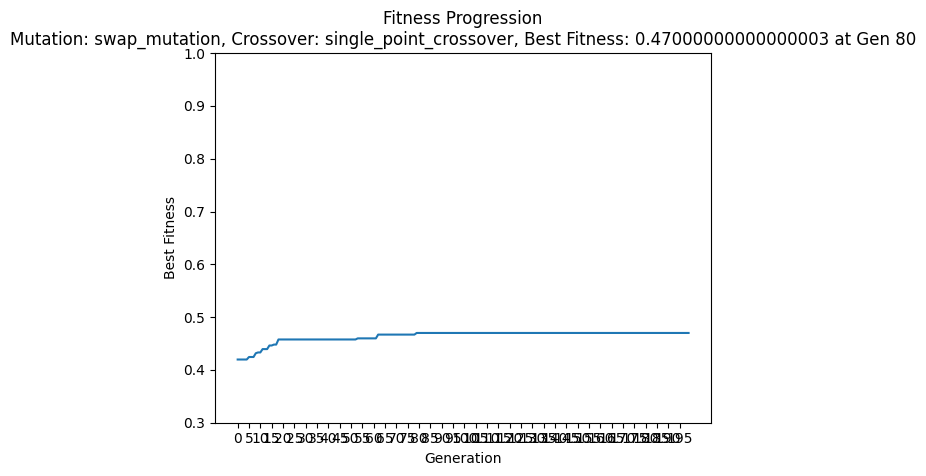

Best Fitness for this configuration: 0.47000000000000003 at Generation 80
Running GA with - Generations: 200, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.1, Elitism: True, Selection Method: roulette, Mutation: shift_mutation, Crossover: uniform_crossover


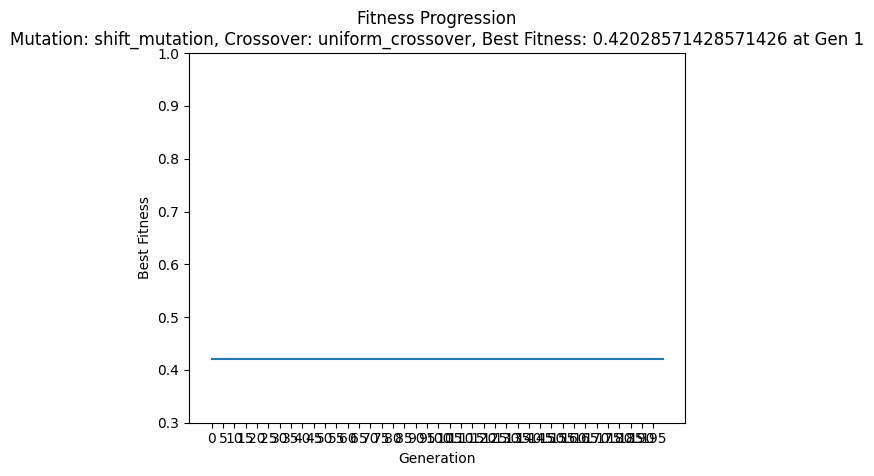

Best Fitness for this configuration: 0.42028571428571426 at Generation 1
Running GA with - Generations: 200, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.1, Elitism: True, Selection Method: roulette, Mutation: shift_mutation, Crossover: single_point_crossover


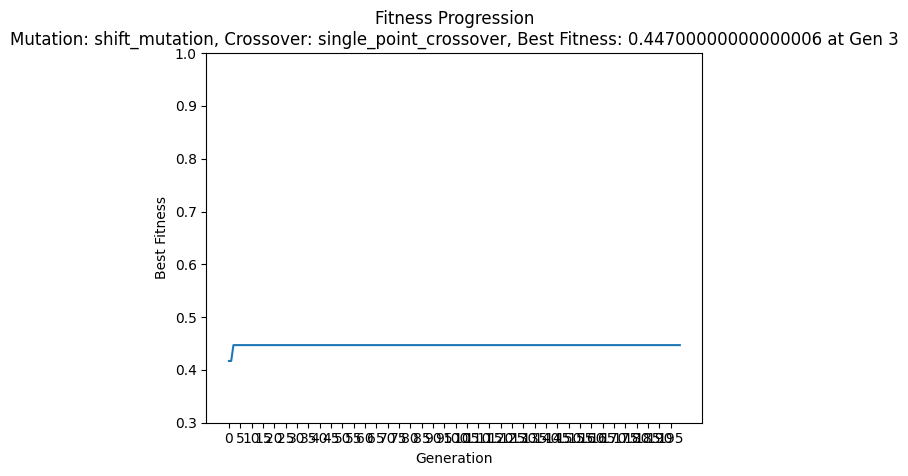

Best Fitness for this configuration: 0.44700000000000006 at Generation 3
Running GA with - Generations: 200, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.1, Elitism: True, Selection Method: roulette, Mutation: reassign_mutation, Crossover: uniform_crossover


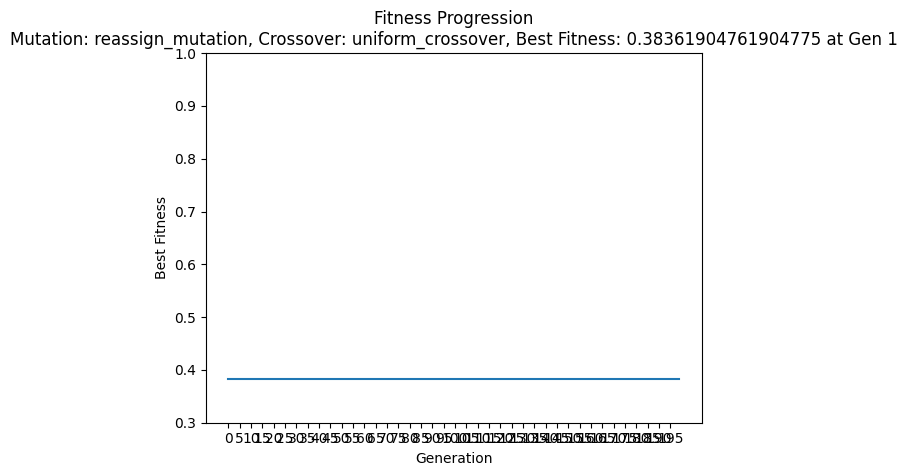

Best Fitness for this configuration: 0.38361904761904775 at Generation 1
Running GA with - Generations: 200, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.1, Elitism: True, Selection Method: roulette, Mutation: reassign_mutation, Crossover: single_point_crossover


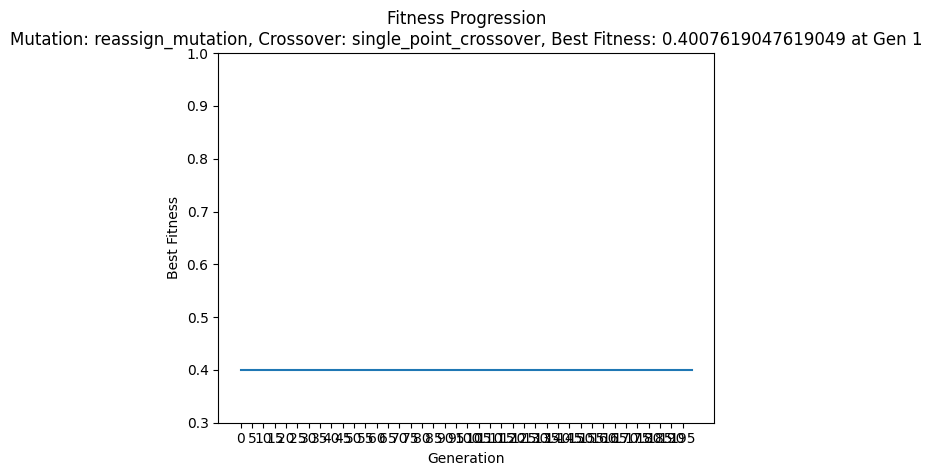

Best Fitness for this configuration: 0.4007619047619049 at Generation 1
Running GA with - Generations: 50, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.1, Elitism: False, Selection Method: tournament, Mutation: swap_mutation, Crossover: uniform_crossover


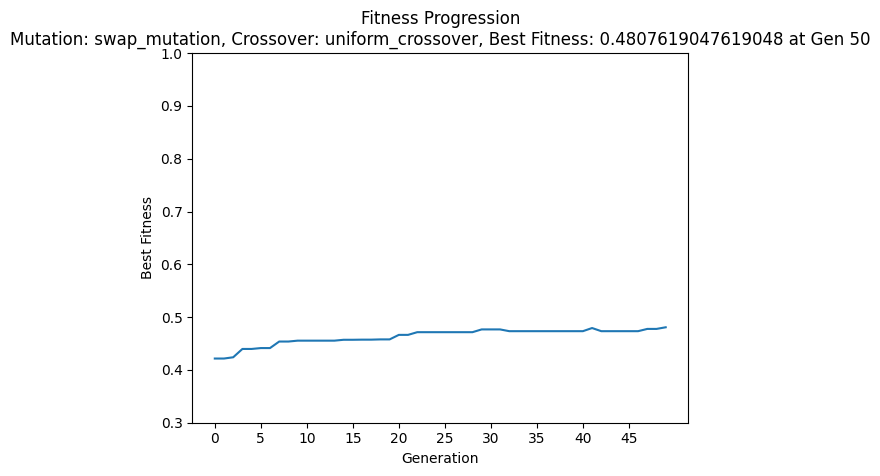

Best Fitness for this configuration: 0.4807619047619048 at Generation 50
Running GA with - Generations: 50, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.1, Elitism: False, Selection Method: tournament, Mutation: swap_mutation, Crossover: single_point_crossover


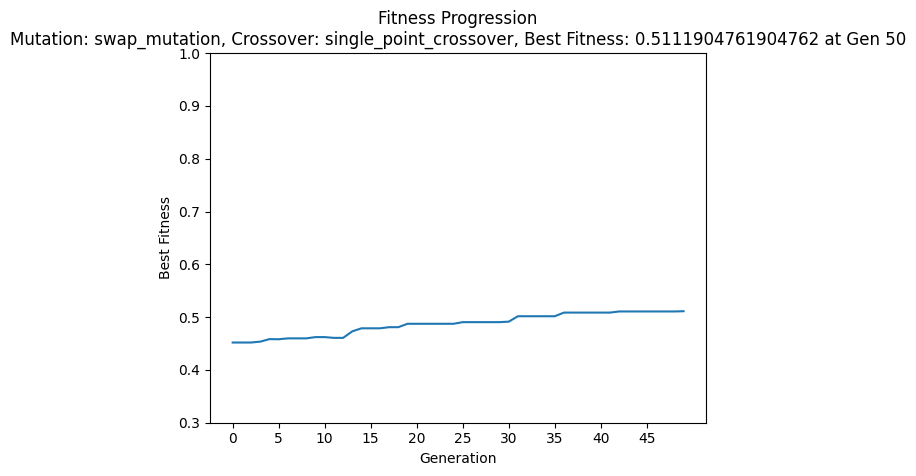

Best Fitness for this configuration: 0.5111904761904762 at Generation 50
Running GA with - Generations: 50, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.1, Elitism: False, Selection Method: tournament, Mutation: shift_mutation, Crossover: uniform_crossover


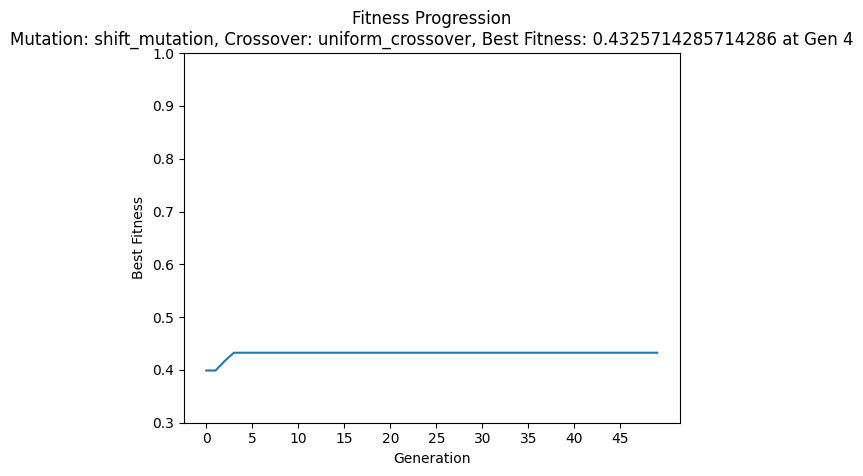

Best Fitness for this configuration: 0.4325714285714286 at Generation 4
Running GA with - Generations: 50, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.1, Elitism: False, Selection Method: tournament, Mutation: shift_mutation, Crossover: single_point_crossover


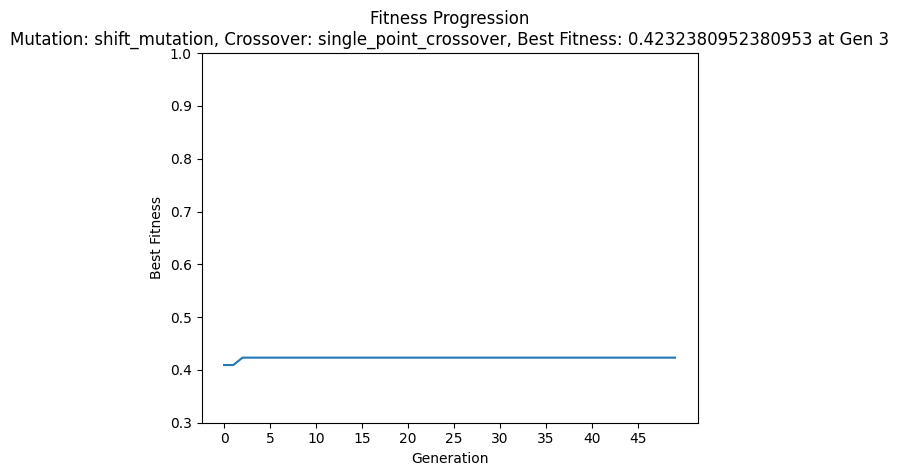

Best Fitness for this configuration: 0.4232380952380953 at Generation 3
Running GA with - Generations: 50, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.1, Elitism: False, Selection Method: tournament, Mutation: reassign_mutation, Crossover: uniform_crossover


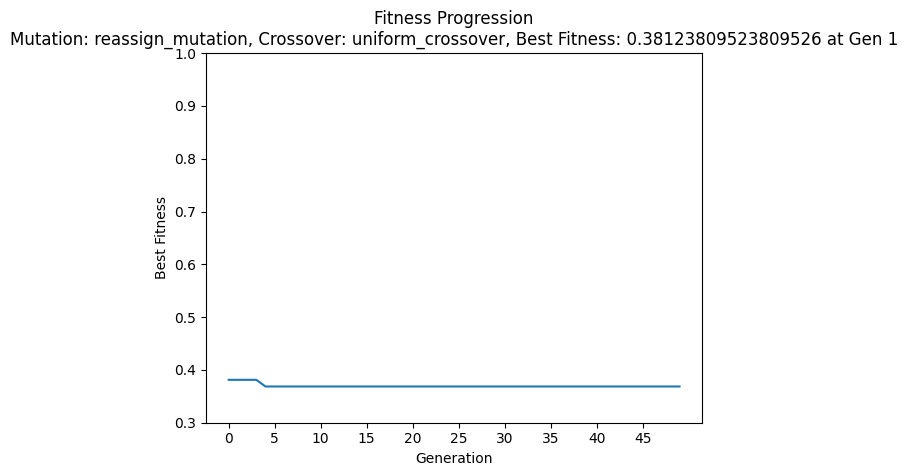

Best Fitness for this configuration: 0.38123809523809526 at Generation 1
Running GA with - Generations: 50, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.1, Elitism: False, Selection Method: tournament, Mutation: reassign_mutation, Crossover: single_point_crossover


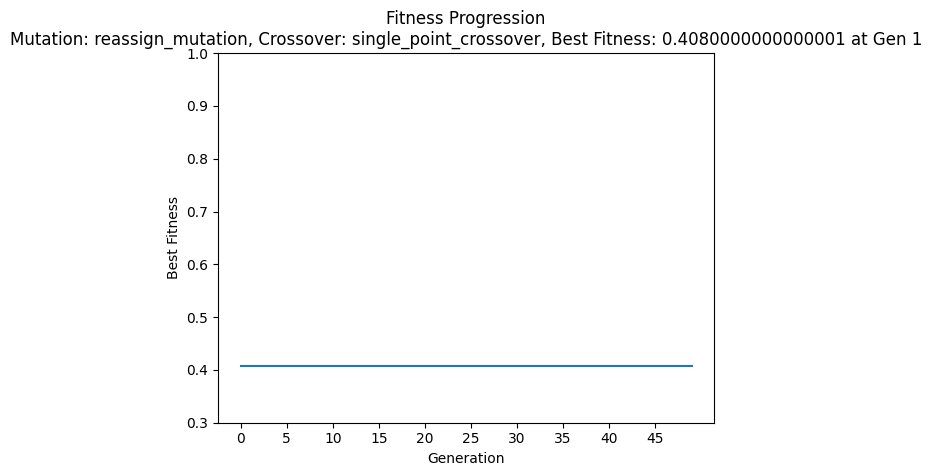

Best Fitness for this configuration: 0.4080000000000001 at Generation 1
Running GA with - Generations: 125, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.1, Elitism: False, Selection Method: tournament, Mutation: swap_mutation, Crossover: uniform_crossover


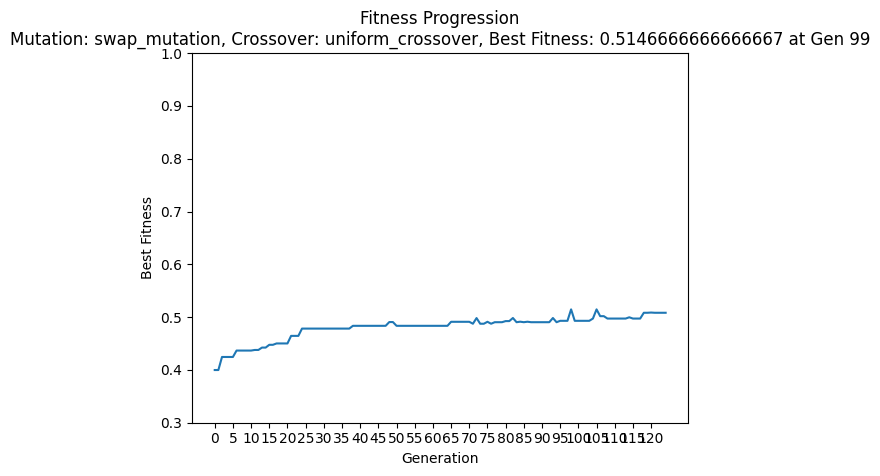

Best Fitness for this configuration: 0.5146666666666667 at Generation 99
Running GA with - Generations: 125, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.1, Elitism: False, Selection Method: tournament, Mutation: swap_mutation, Crossover: single_point_crossover


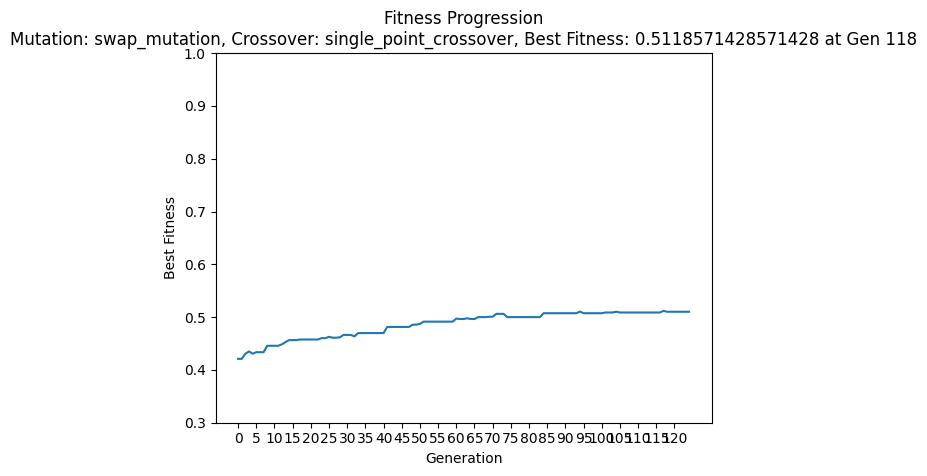

Best Fitness for this configuration: 0.5118571428571428 at Generation 118
Running GA with - Generations: 125, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.1, Elitism: False, Selection Method: tournament, Mutation: shift_mutation, Crossover: uniform_crossover


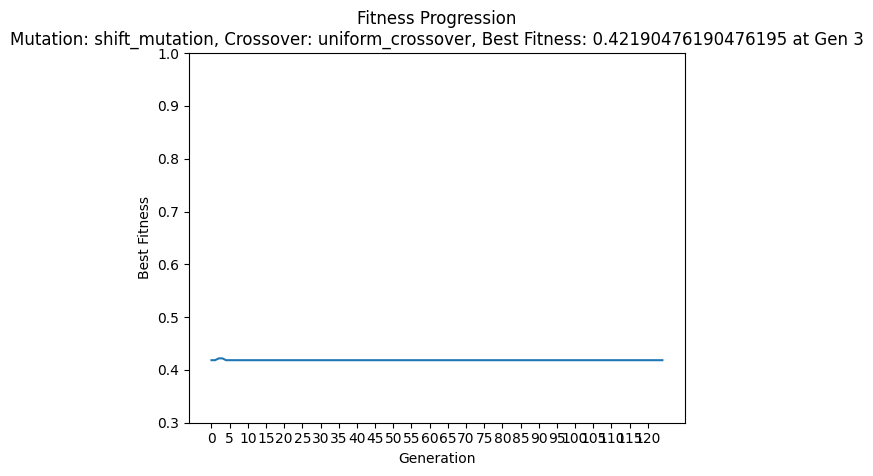

Best Fitness for this configuration: 0.42190476190476195 at Generation 3
Running GA with - Generations: 125, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.1, Elitism: False, Selection Method: tournament, Mutation: shift_mutation, Crossover: single_point_crossover


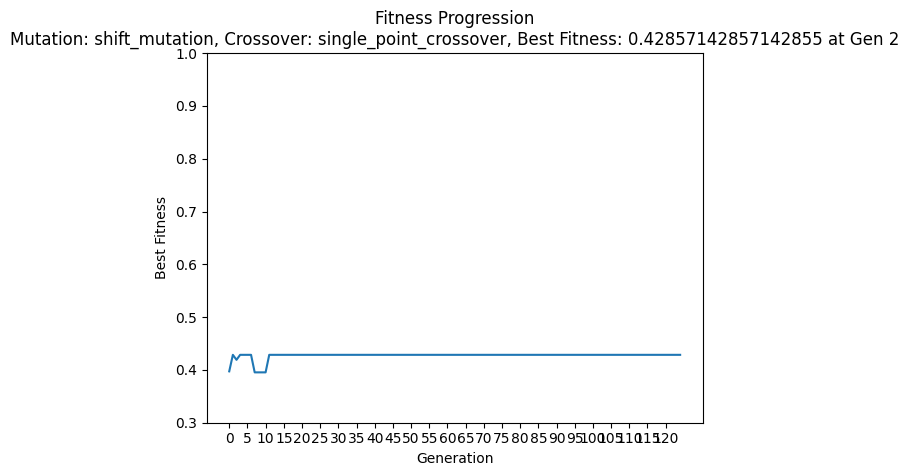

Best Fitness for this configuration: 0.42857142857142855 at Generation 2
Running GA with - Generations: 125, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.1, Elitism: False, Selection Method: tournament, Mutation: reassign_mutation, Crossover: uniform_crossover


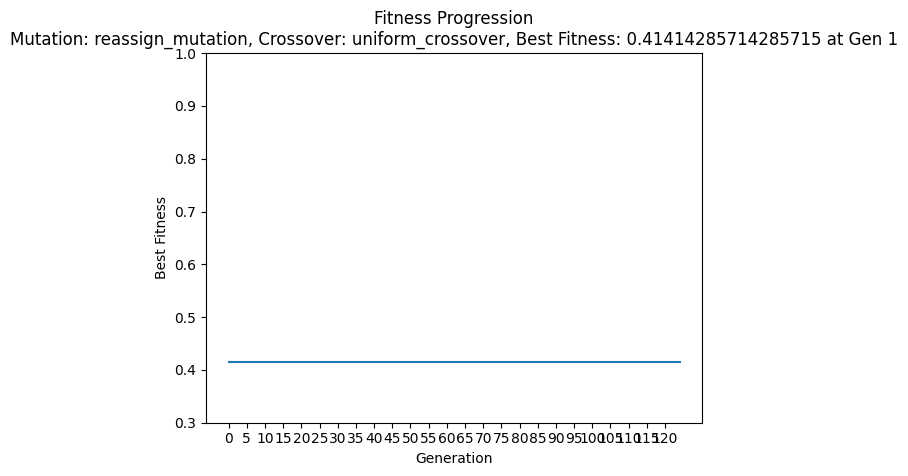

Best Fitness for this configuration: 0.41414285714285715 at Generation 1
Running GA with - Generations: 125, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.1, Elitism: False, Selection Method: tournament, Mutation: reassign_mutation, Crossover: single_point_crossover


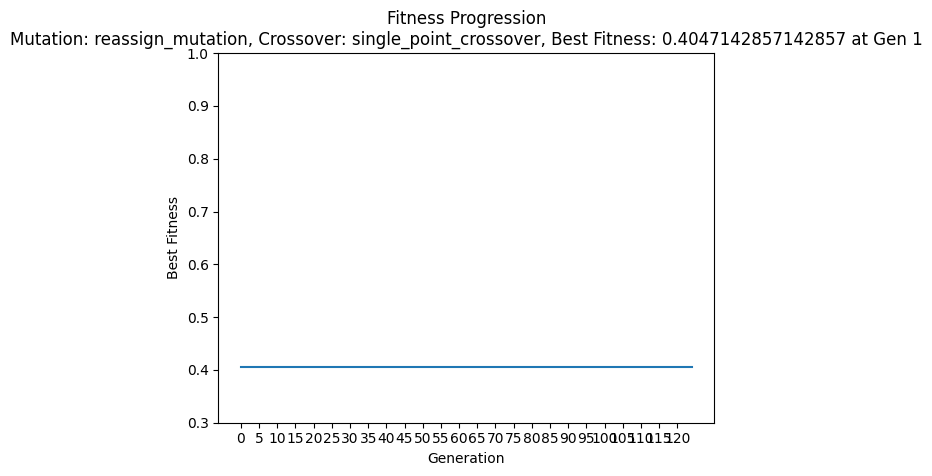

Best Fitness for this configuration: 0.4047142857142857 at Generation 1
Running GA with - Generations: 200, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.1, Elitism: False, Selection Method: tournament, Mutation: swap_mutation, Crossover: uniform_crossover


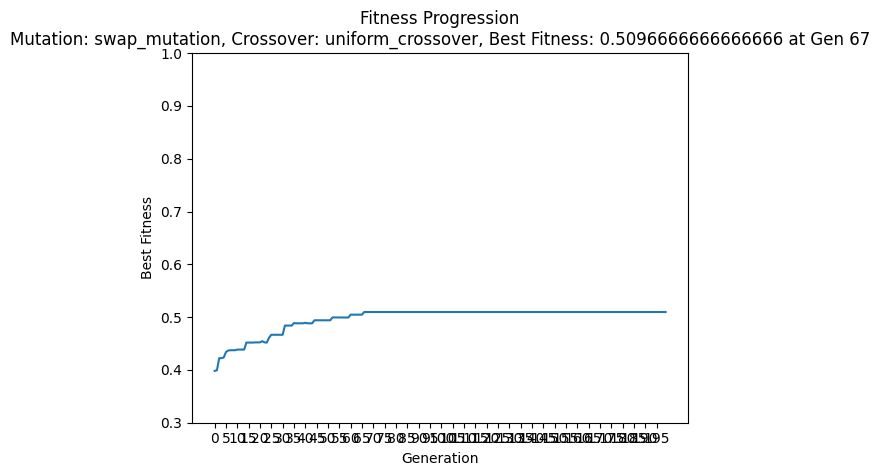

Best Fitness for this configuration: 0.5096666666666666 at Generation 67
Running GA with - Generations: 200, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.1, Elitism: False, Selection Method: tournament, Mutation: swap_mutation, Crossover: single_point_crossover


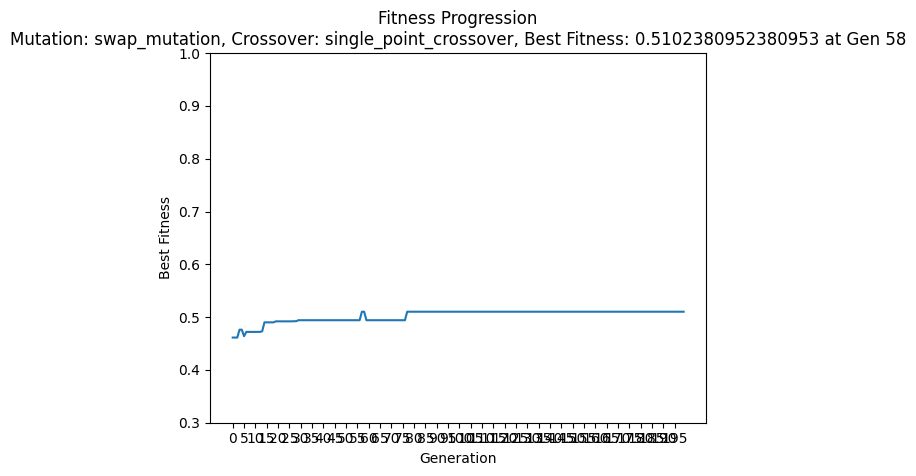

Best Fitness for this configuration: 0.5102380952380953 at Generation 58
Running GA with - Generations: 200, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.1, Elitism: False, Selection Method: tournament, Mutation: shift_mutation, Crossover: uniform_crossover


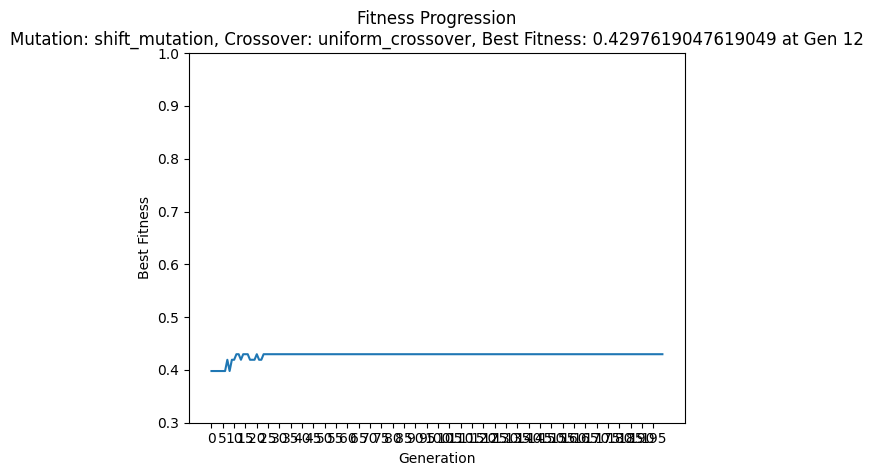

Best Fitness for this configuration: 0.4297619047619049 at Generation 12
Running GA with - Generations: 200, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.1, Elitism: False, Selection Method: tournament, Mutation: shift_mutation, Crossover: single_point_crossover


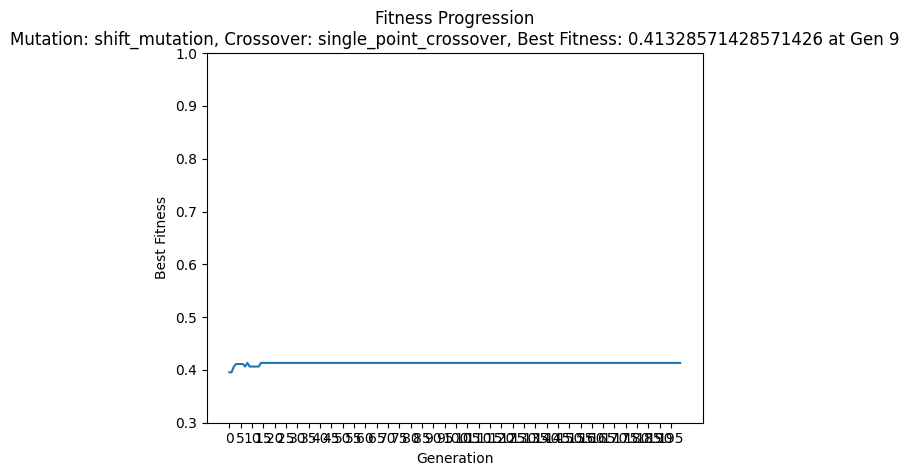

Best Fitness for this configuration: 0.41328571428571426 at Generation 9
Running GA with - Generations: 200, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.1, Elitism: False, Selection Method: tournament, Mutation: reassign_mutation, Crossover: uniform_crossover


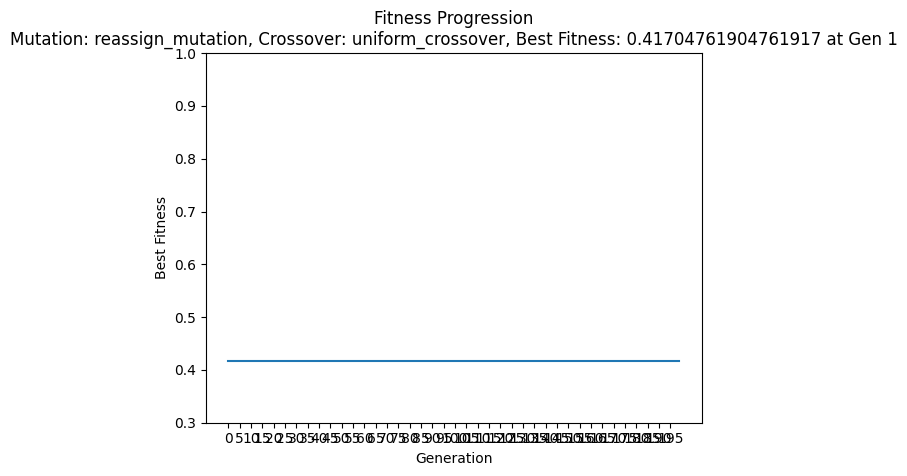

Best Fitness for this configuration: 0.41704761904761917 at Generation 1
Running GA with - Generations: 200, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.1, Elitism: False, Selection Method: tournament, Mutation: reassign_mutation, Crossover: single_point_crossover


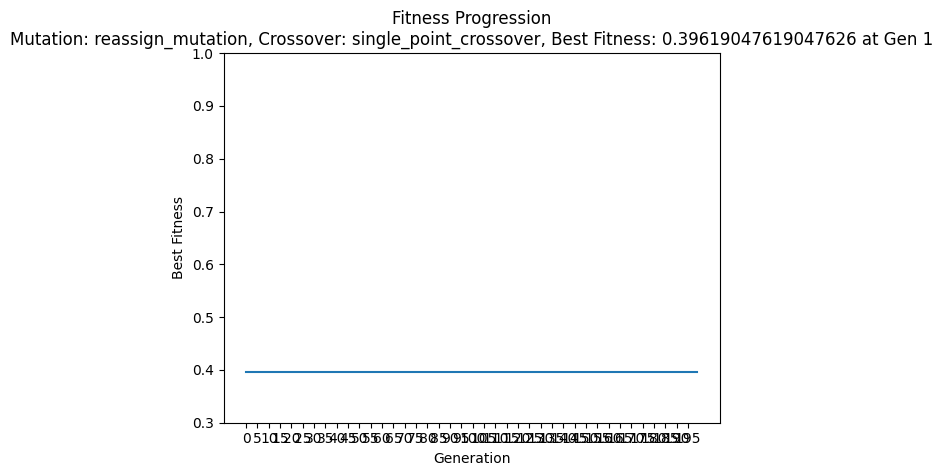

Best Fitness for this configuration: 0.39619047619047626 at Generation 1
Running GA with - Generations: 50, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.1, Elitism: False, Selection Method: roulette, Mutation: swap_mutation, Crossover: uniform_crossover


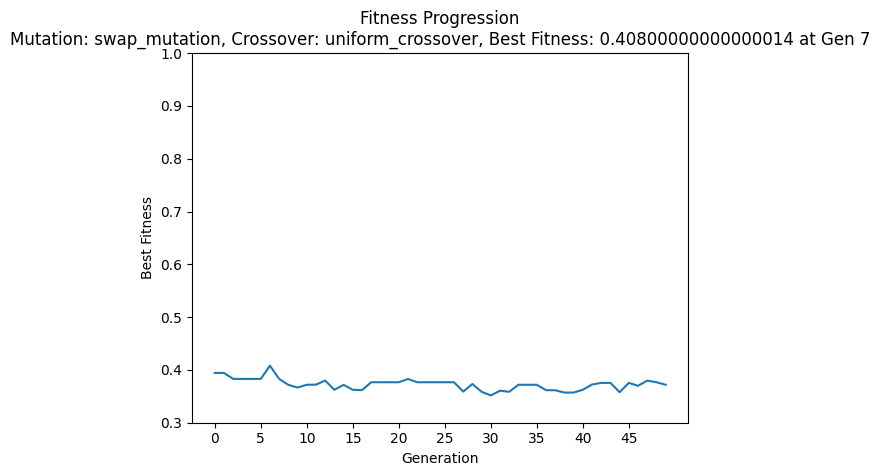

Best Fitness for this configuration: 0.40800000000000014 at Generation 7
Running GA with - Generations: 50, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.1, Elitism: False, Selection Method: roulette, Mutation: swap_mutation, Crossover: single_point_crossover


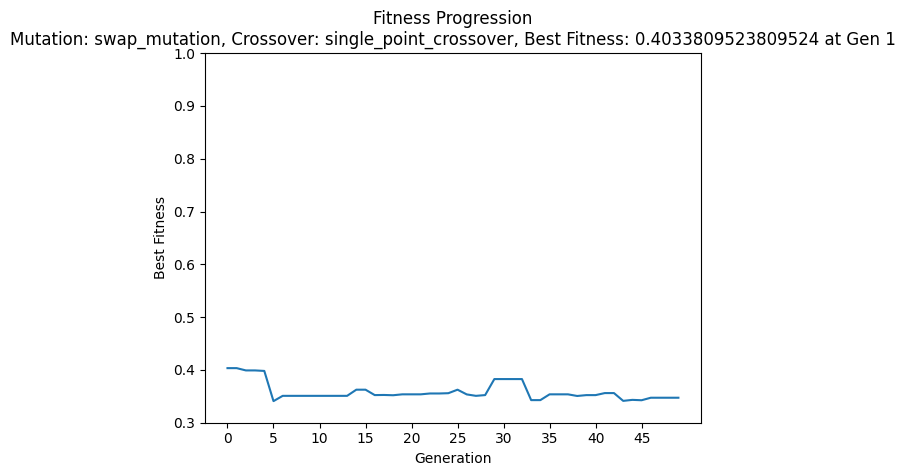

Best Fitness for this configuration: 0.4033809523809524 at Generation 1
Running GA with - Generations: 50, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.1, Elitism: False, Selection Method: roulette, Mutation: shift_mutation, Crossover: uniform_crossover


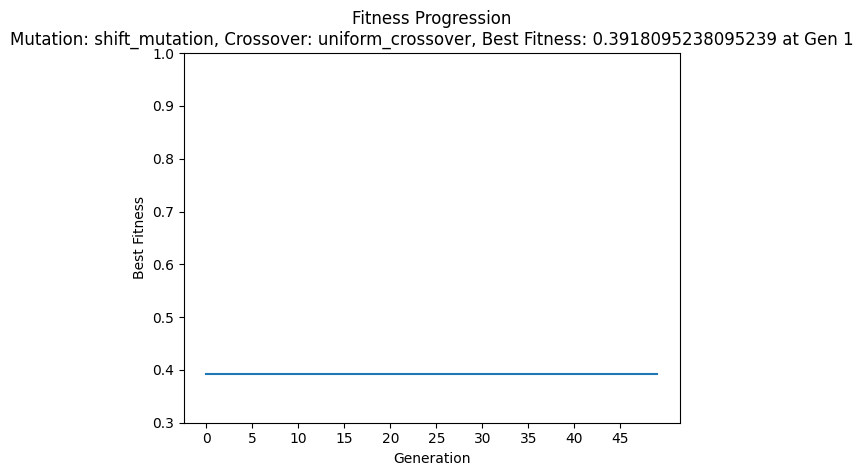

Best Fitness for this configuration: 0.3918095238095239 at Generation 1
Running GA with - Generations: 50, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.1, Elitism: False, Selection Method: roulette, Mutation: shift_mutation, Crossover: single_point_crossover


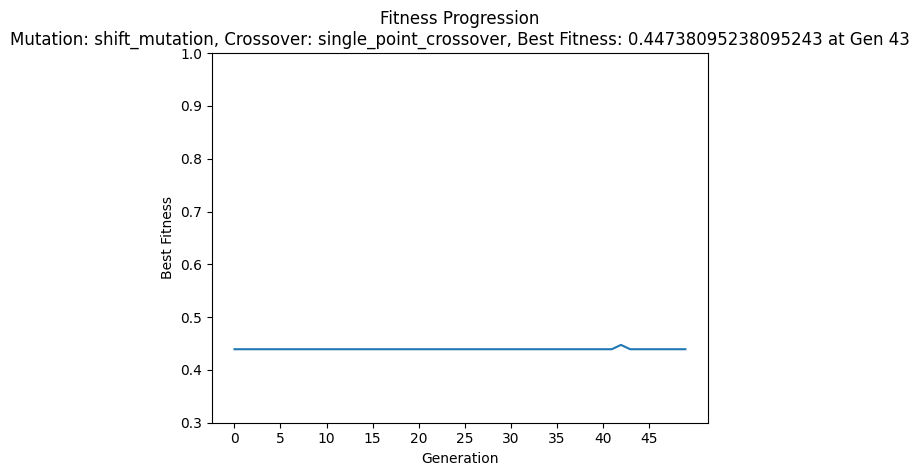

Best Fitness for this configuration: 0.44738095238095243 at Generation 43
Running GA with - Generations: 50, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.1, Elitism: False, Selection Method: roulette, Mutation: reassign_mutation, Crossover: uniform_crossover


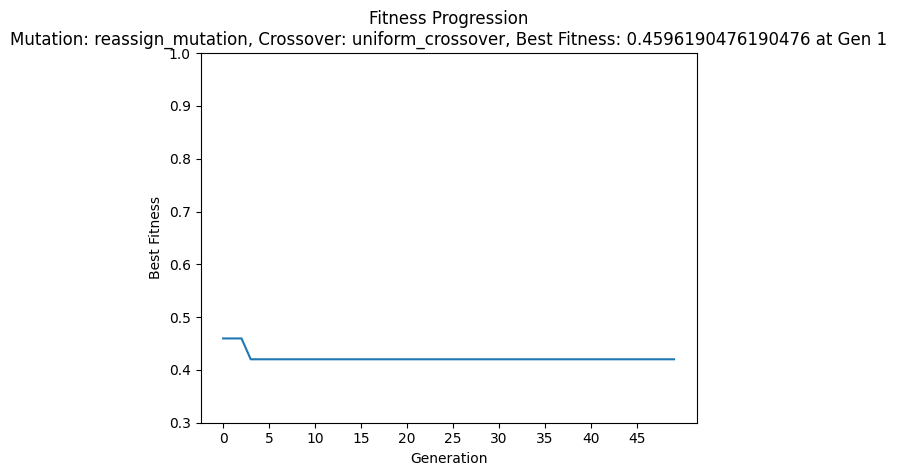

Best Fitness for this configuration: 0.4596190476190476 at Generation 1
Running GA with - Generations: 50, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.1, Elitism: False, Selection Method: roulette, Mutation: reassign_mutation, Crossover: single_point_crossover


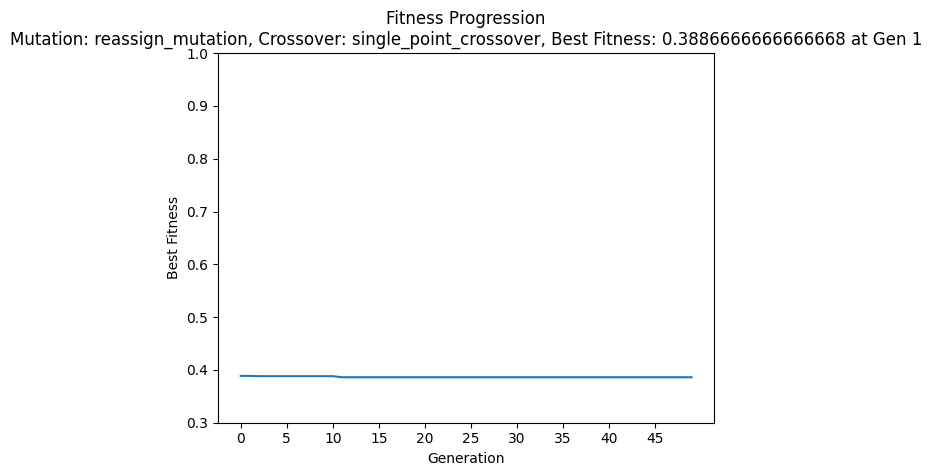

Best Fitness for this configuration: 0.3886666666666668 at Generation 1
Running GA with - Generations: 125, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.1, Elitism: False, Selection Method: roulette, Mutation: swap_mutation, Crossover: uniform_crossover


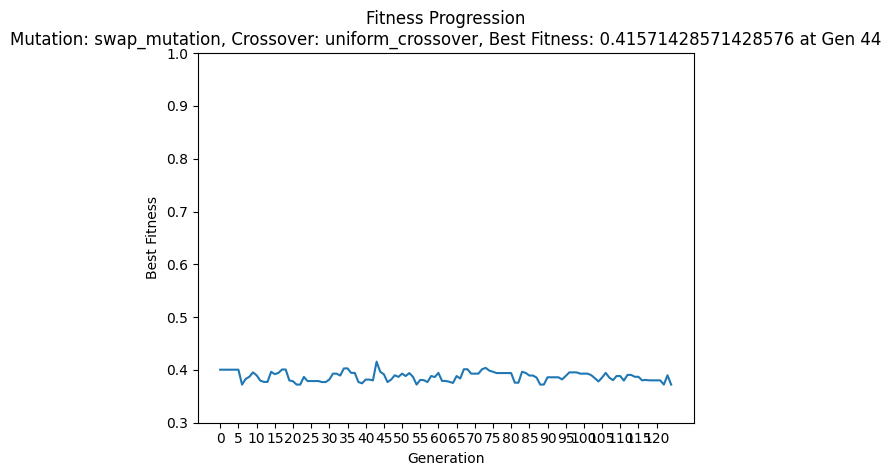

Best Fitness for this configuration: 0.41571428571428576 at Generation 44
Running GA with - Generations: 125, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.1, Elitism: False, Selection Method: roulette, Mutation: swap_mutation, Crossover: single_point_crossover


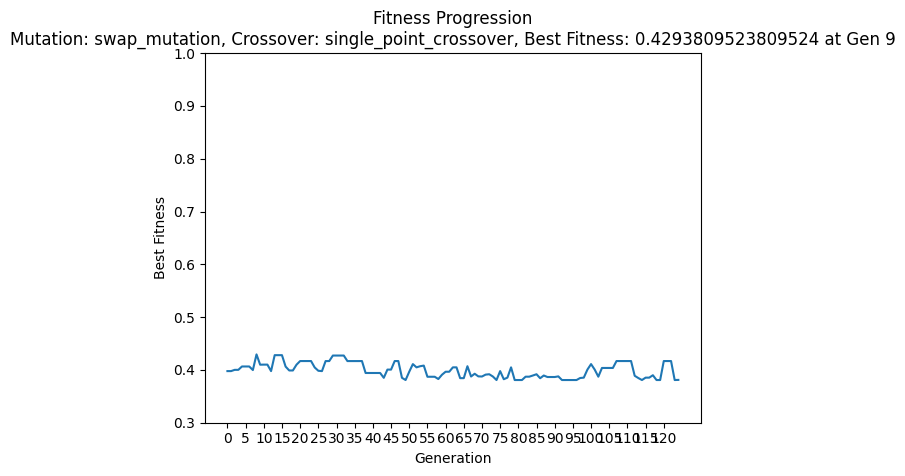

Best Fitness for this configuration: 0.4293809523809524 at Generation 9
Running GA with - Generations: 125, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.1, Elitism: False, Selection Method: roulette, Mutation: shift_mutation, Crossover: uniform_crossover


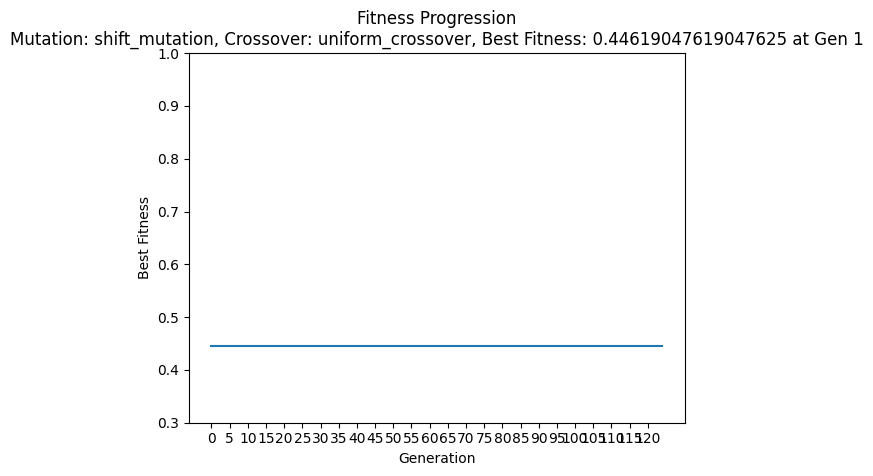

Best Fitness for this configuration: 0.44619047619047625 at Generation 1
Running GA with - Generations: 125, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.1, Elitism: False, Selection Method: roulette, Mutation: shift_mutation, Crossover: single_point_crossover


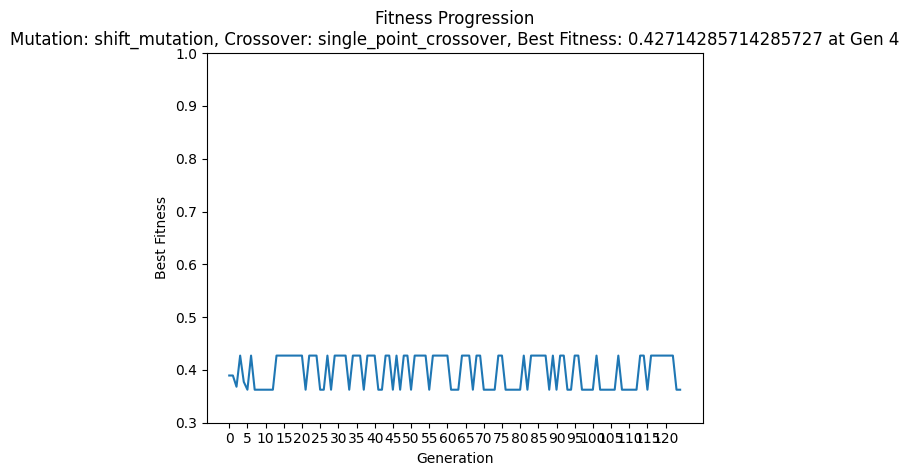

Best Fitness for this configuration: 0.42714285714285727 at Generation 4
Running GA with - Generations: 125, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.1, Elitism: False, Selection Method: roulette, Mutation: reassign_mutation, Crossover: uniform_crossover


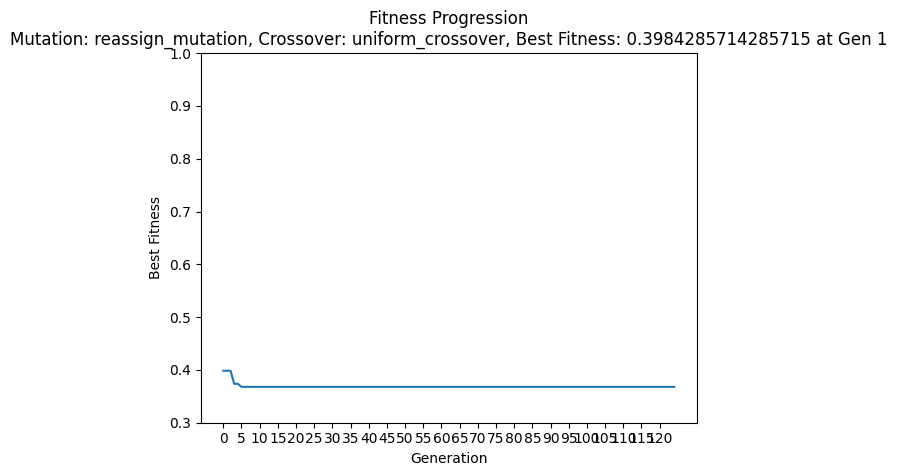

Best Fitness for this configuration: 0.3984285714285715 at Generation 1
Running GA with - Generations: 125, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.1, Elitism: False, Selection Method: roulette, Mutation: reassign_mutation, Crossover: single_point_crossover


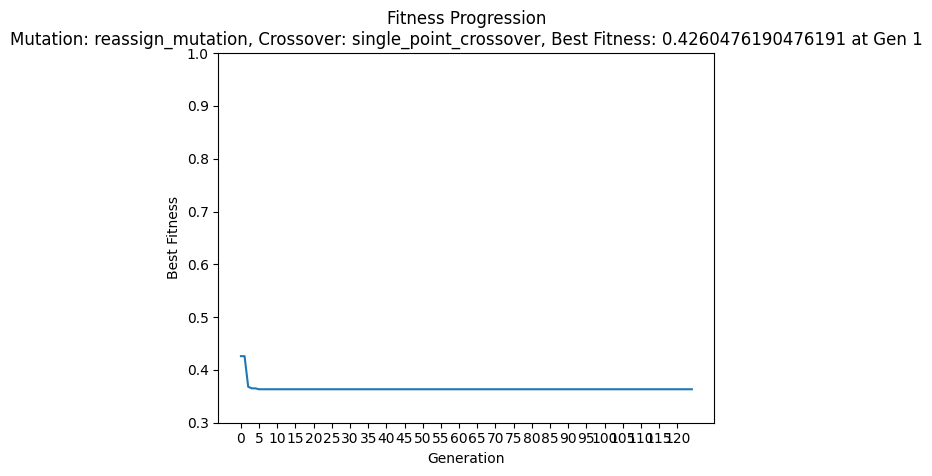

Best Fitness for this configuration: 0.4260476190476191 at Generation 1
Running GA with - Generations: 200, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.1, Elitism: False, Selection Method: roulette, Mutation: swap_mutation, Crossover: uniform_crossover


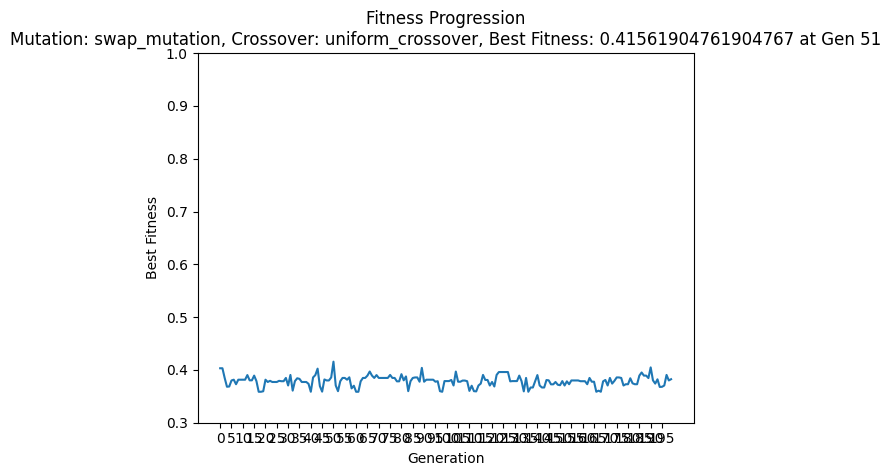

Best Fitness for this configuration: 0.41561904761904767 at Generation 51
Running GA with - Generations: 200, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.1, Elitism: False, Selection Method: roulette, Mutation: swap_mutation, Crossover: single_point_crossover


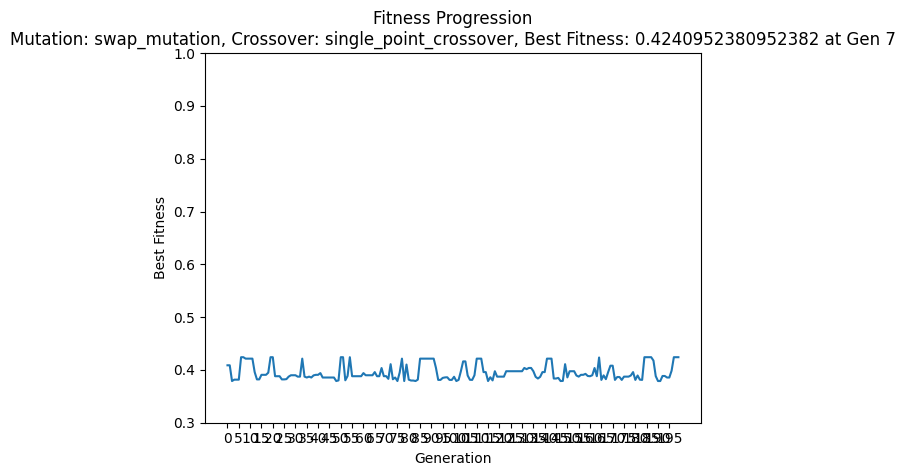

Best Fitness for this configuration: 0.4240952380952382 at Generation 7
Running GA with - Generations: 200, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.1, Elitism: False, Selection Method: roulette, Mutation: shift_mutation, Crossover: uniform_crossover


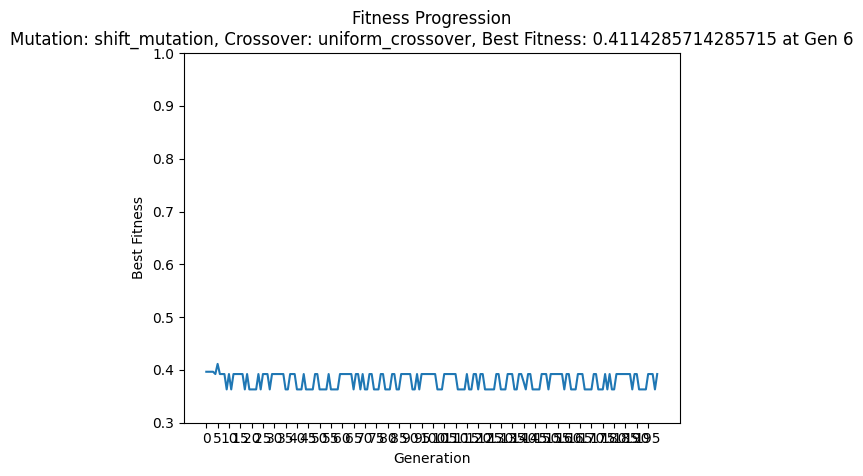

Best Fitness for this configuration: 0.4114285714285715 at Generation 6
Running GA with - Generations: 200, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.1, Elitism: False, Selection Method: roulette, Mutation: shift_mutation, Crossover: single_point_crossover


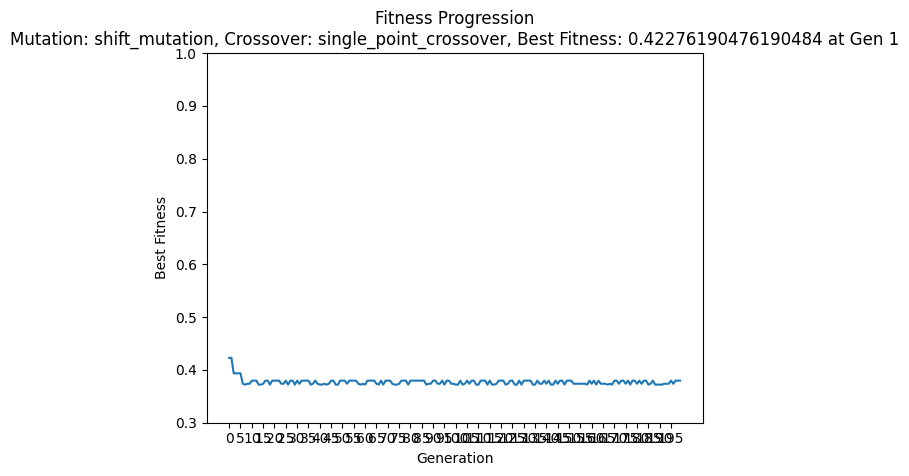

Best Fitness for this configuration: 0.42276190476190484 at Generation 1
Running GA with - Generations: 200, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.1, Elitism: False, Selection Method: roulette, Mutation: reassign_mutation, Crossover: uniform_crossover


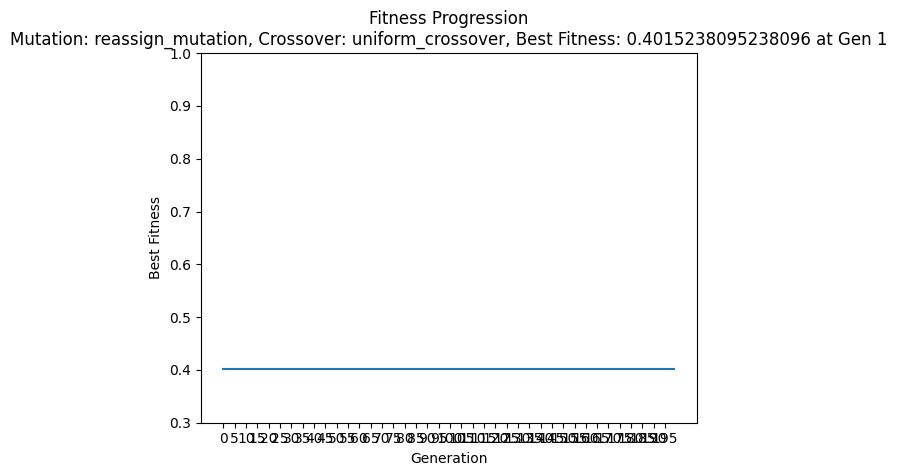

Best Fitness for this configuration: 0.4015238095238096 at Generation 1
Running GA with - Generations: 200, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.1, Elitism: False, Selection Method: roulette, Mutation: reassign_mutation, Crossover: single_point_crossover


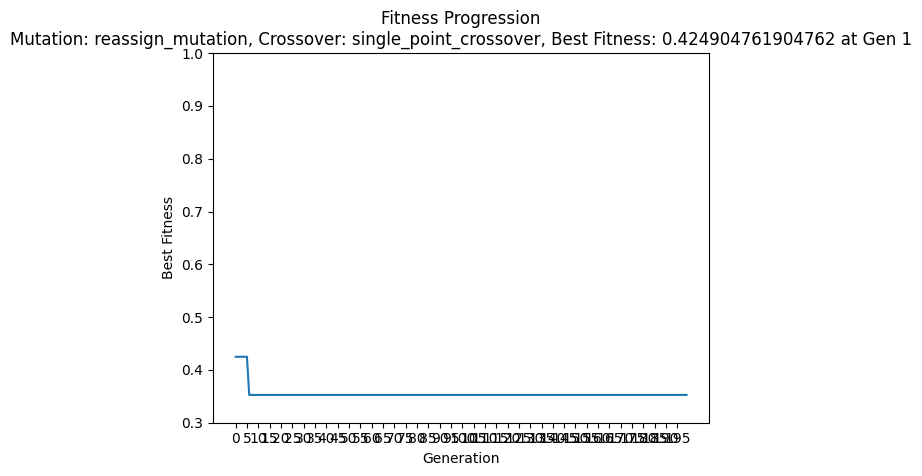

Best Fitness for this configuration: 0.424904761904762 at Generation 1
Running GA with - Generations: 50, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.3, Elitism: True, Selection Method: tournament, Mutation: swap_mutation, Crossover: uniform_crossover


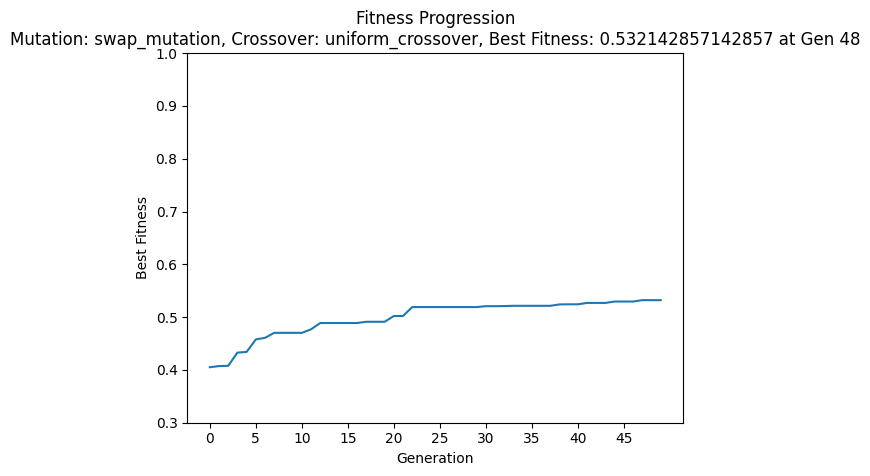

Best Fitness for this configuration: 0.532142857142857 at Generation 48
Running GA with - Generations: 50, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.3, Elitism: True, Selection Method: tournament, Mutation: swap_mutation, Crossover: single_point_crossover


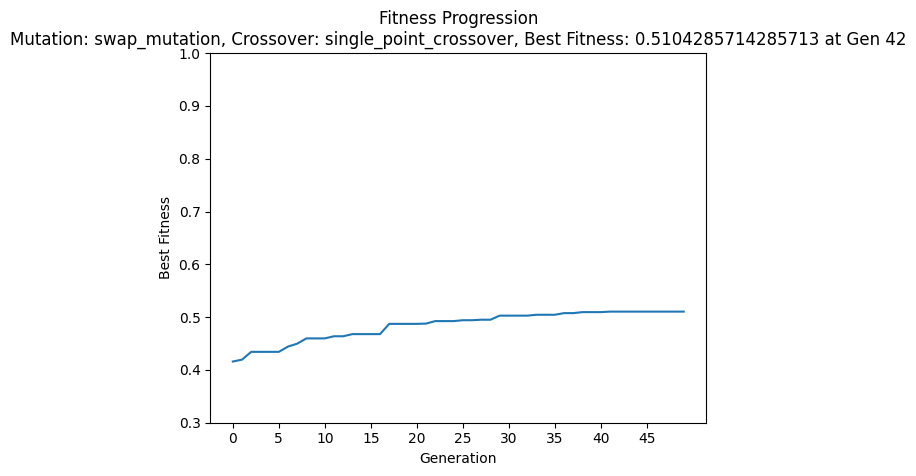

Best Fitness for this configuration: 0.5104285714285713 at Generation 42
Running GA with - Generations: 50, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.3, Elitism: True, Selection Method: tournament, Mutation: shift_mutation, Crossover: uniform_crossover


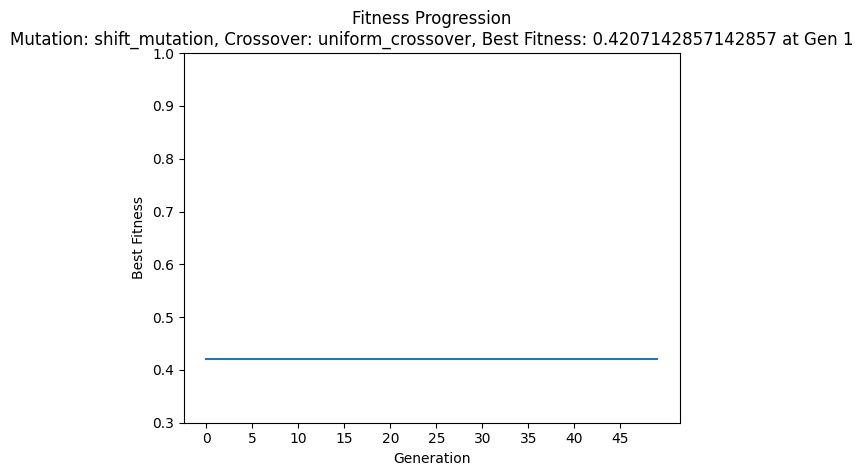

Best Fitness for this configuration: 0.4207142857142857 at Generation 1
Running GA with - Generations: 50, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.3, Elitism: True, Selection Method: tournament, Mutation: shift_mutation, Crossover: single_point_crossover


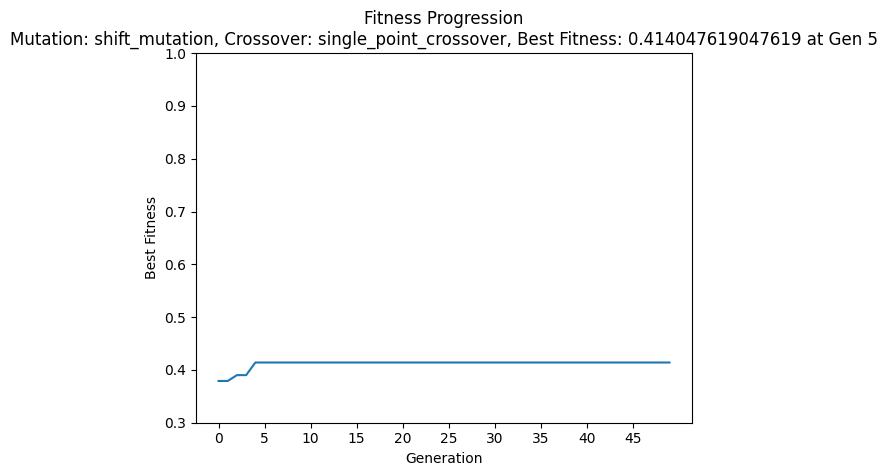

Best Fitness for this configuration: 0.414047619047619 at Generation 5
Running GA with - Generations: 50, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.3, Elitism: True, Selection Method: tournament, Mutation: reassign_mutation, Crossover: uniform_crossover


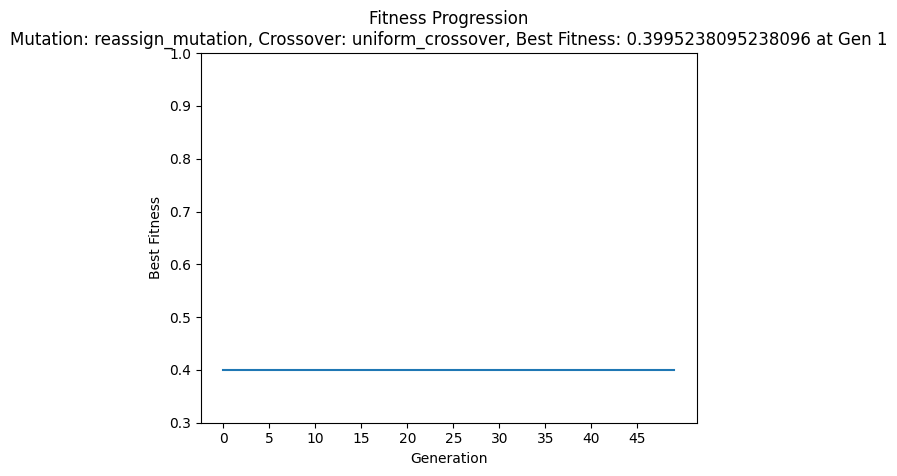

Best Fitness for this configuration: 0.3995238095238096 at Generation 1
Running GA with - Generations: 50, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.3, Elitism: True, Selection Method: tournament, Mutation: reassign_mutation, Crossover: single_point_crossover


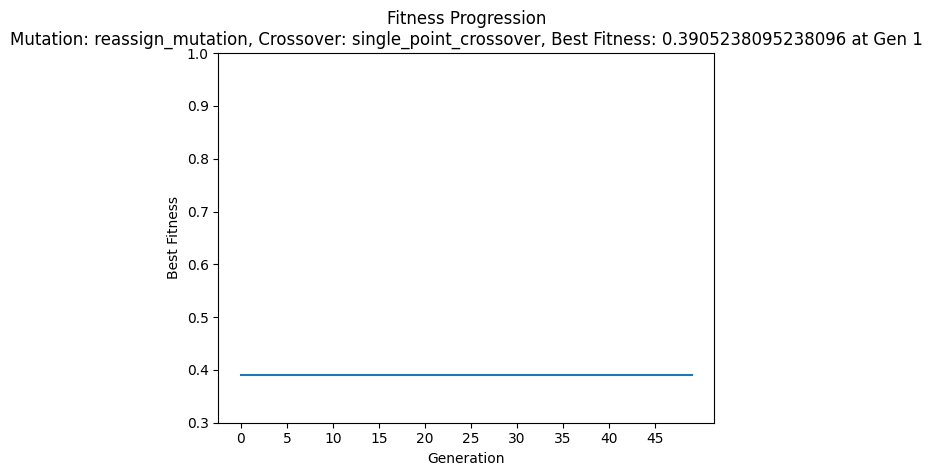

Best Fitness for this configuration: 0.3905238095238096 at Generation 1
Running GA with - Generations: 125, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.3, Elitism: True, Selection Method: tournament, Mutation: swap_mutation, Crossover: uniform_crossover


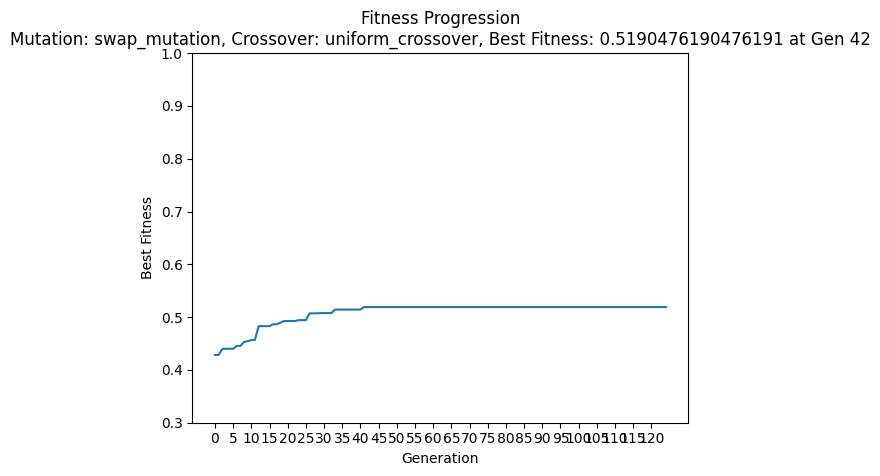

Best Fitness for this configuration: 0.5190476190476191 at Generation 42
Running GA with - Generations: 125, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.3, Elitism: True, Selection Method: tournament, Mutation: swap_mutation, Crossover: single_point_crossover


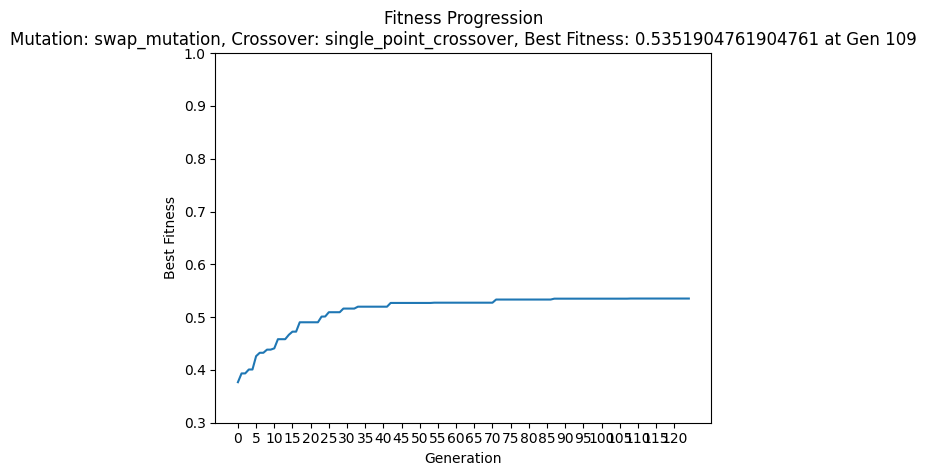

Best Fitness for this configuration: 0.5351904761904761 at Generation 109
Running GA with - Generations: 125, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.3, Elitism: True, Selection Method: tournament, Mutation: shift_mutation, Crossover: uniform_crossover


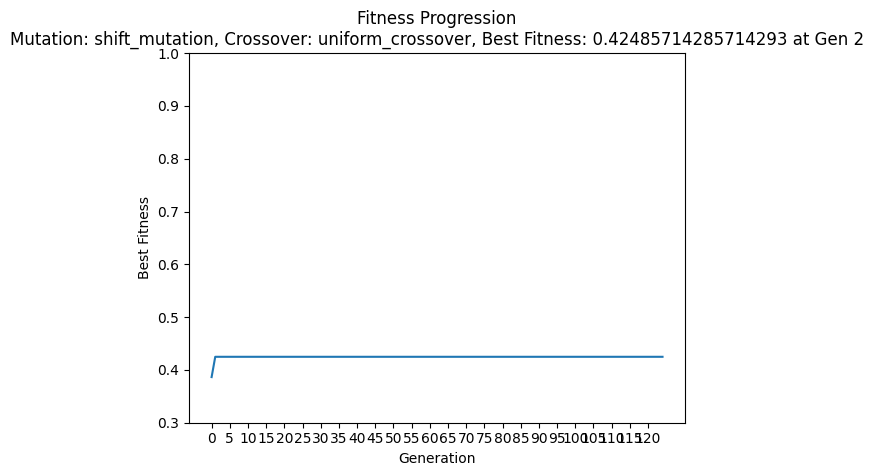

Best Fitness for this configuration: 0.42485714285714293 at Generation 2
Running GA with - Generations: 125, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.3, Elitism: True, Selection Method: tournament, Mutation: shift_mutation, Crossover: single_point_crossover


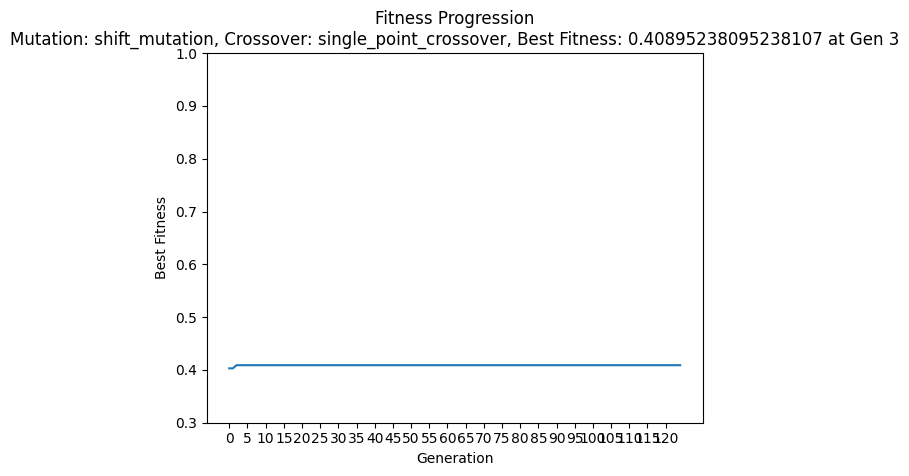

Best Fitness for this configuration: 0.40895238095238107 at Generation 3
Running GA with - Generations: 125, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.3, Elitism: True, Selection Method: tournament, Mutation: reassign_mutation, Crossover: uniform_crossover


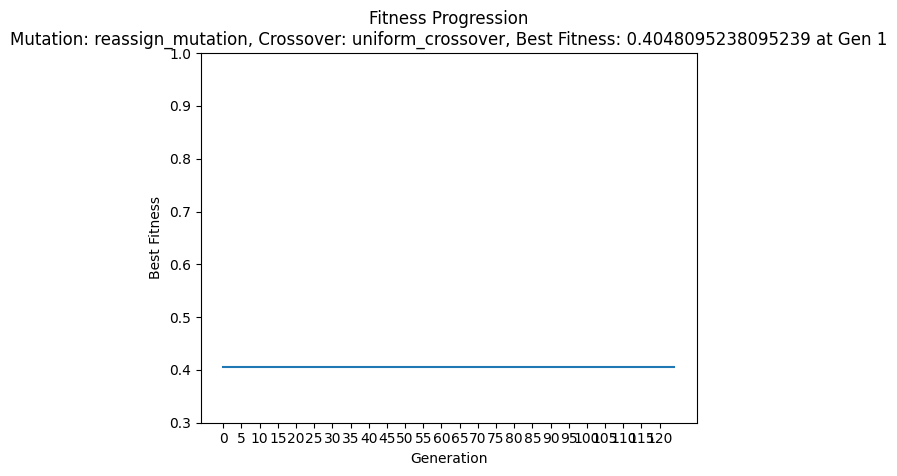

Best Fitness for this configuration: 0.4048095238095239 at Generation 1
Running GA with - Generations: 125, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.3, Elitism: True, Selection Method: tournament, Mutation: reassign_mutation, Crossover: single_point_crossover


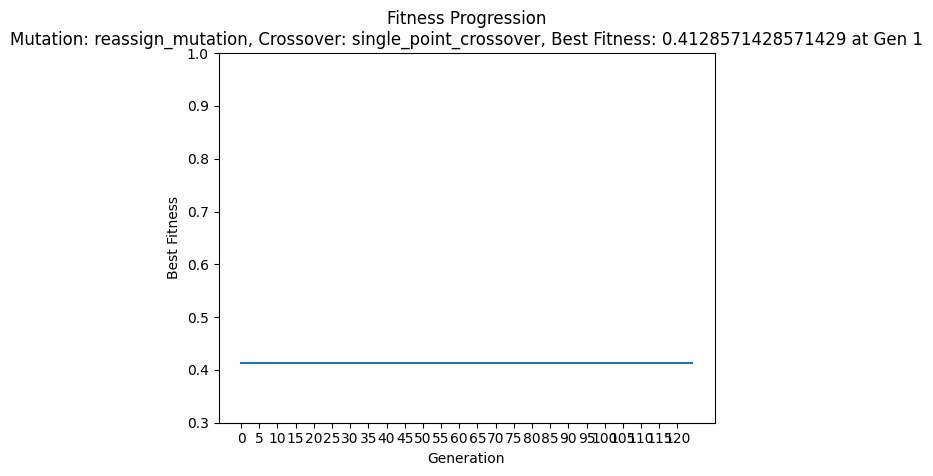

Best Fitness for this configuration: 0.4128571428571429 at Generation 1
Running GA with - Generations: 200, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.3, Elitism: True, Selection Method: tournament, Mutation: swap_mutation, Crossover: uniform_crossover


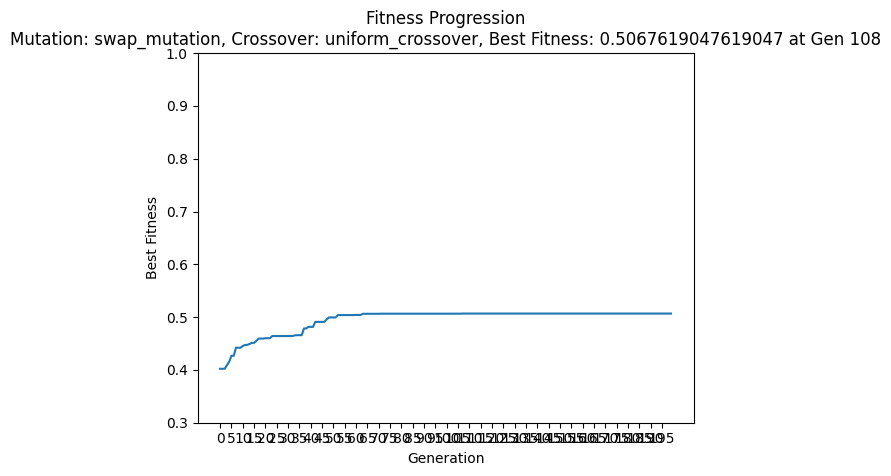

Best Fitness for this configuration: 0.5067619047619047 at Generation 108
Running GA with - Generations: 200, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.3, Elitism: True, Selection Method: tournament, Mutation: swap_mutation, Crossover: single_point_crossover


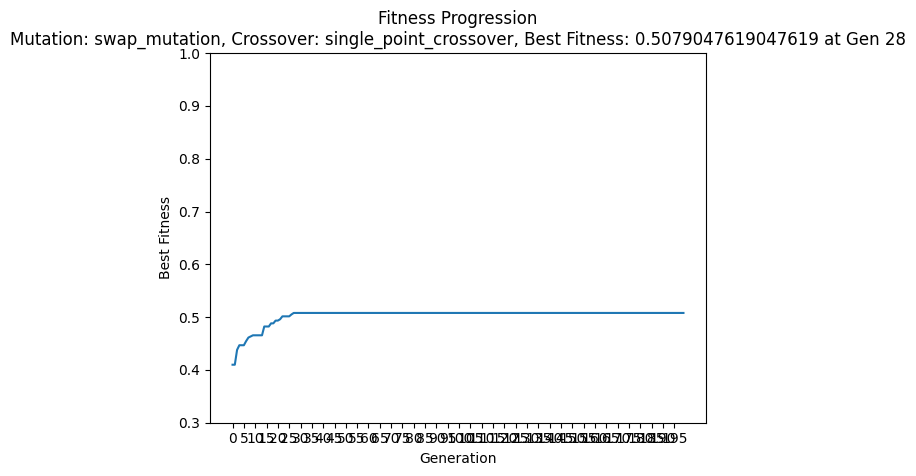

Best Fitness for this configuration: 0.5079047619047619 at Generation 28
Running GA with - Generations: 200, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.3, Elitism: True, Selection Method: tournament, Mutation: shift_mutation, Crossover: uniform_crossover


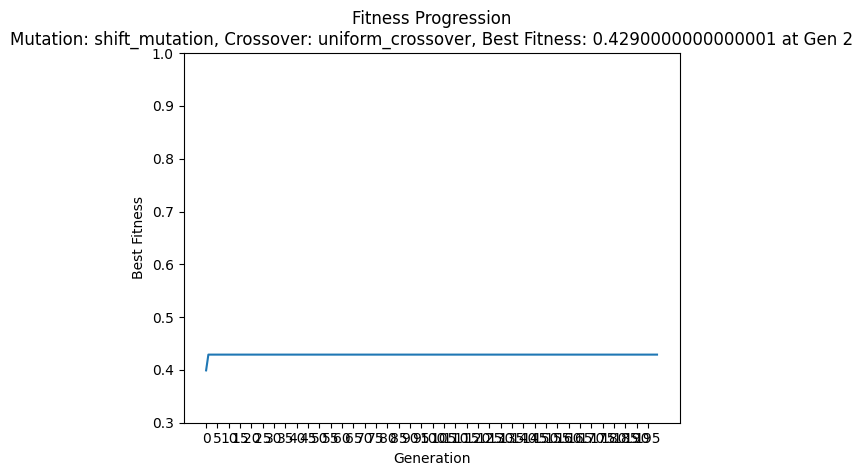

Best Fitness for this configuration: 0.4290000000000001 at Generation 2
Running GA with - Generations: 200, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.3, Elitism: True, Selection Method: tournament, Mutation: shift_mutation, Crossover: single_point_crossover


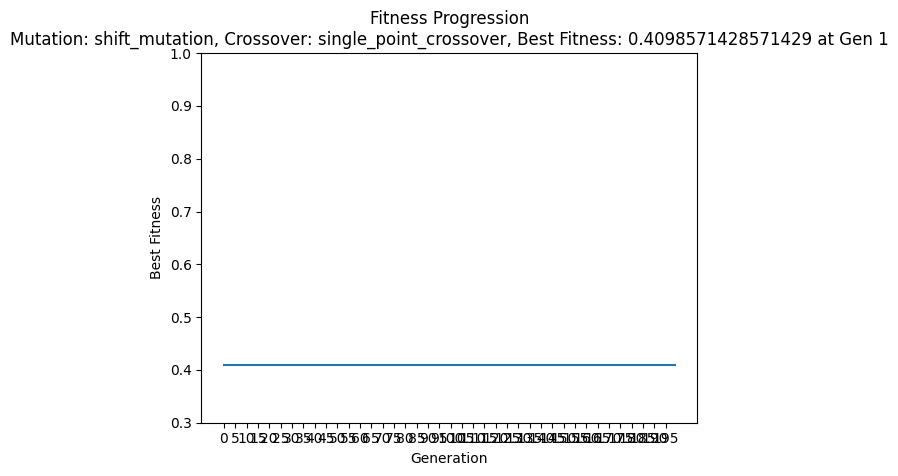

Best Fitness for this configuration: 0.4098571428571429 at Generation 1
Running GA with - Generations: 200, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.3, Elitism: True, Selection Method: tournament, Mutation: reassign_mutation, Crossover: uniform_crossover


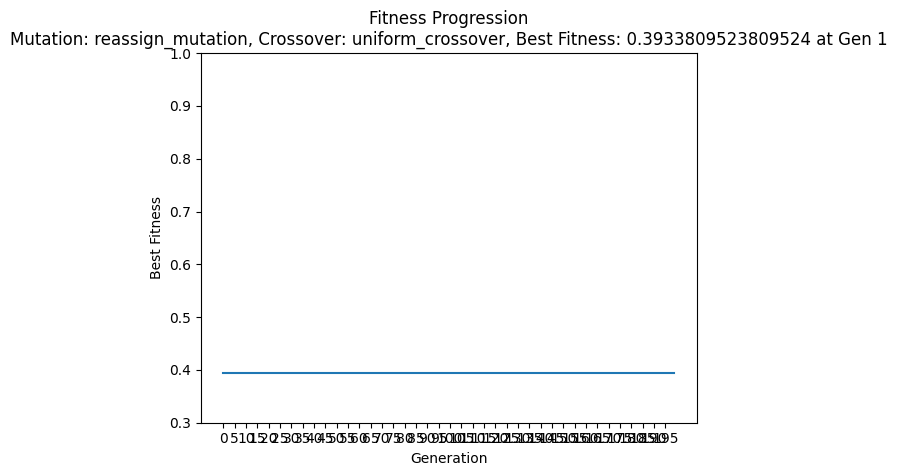

Best Fitness for this configuration: 0.3933809523809524 at Generation 1
Running GA with - Generations: 200, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.3, Elitism: True, Selection Method: tournament, Mutation: reassign_mutation, Crossover: single_point_crossover


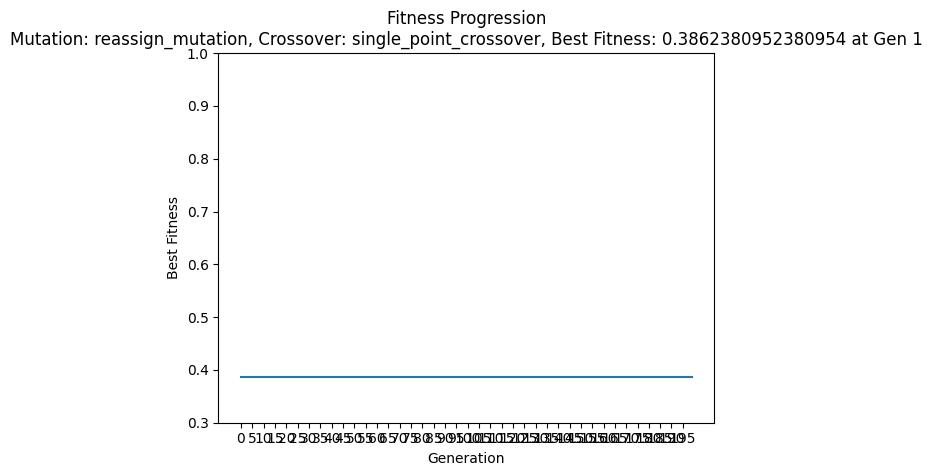

Best Fitness for this configuration: 0.3862380952380954 at Generation 1
Running GA with - Generations: 50, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.3, Elitism: True, Selection Method: roulette, Mutation: swap_mutation, Crossover: uniform_crossover


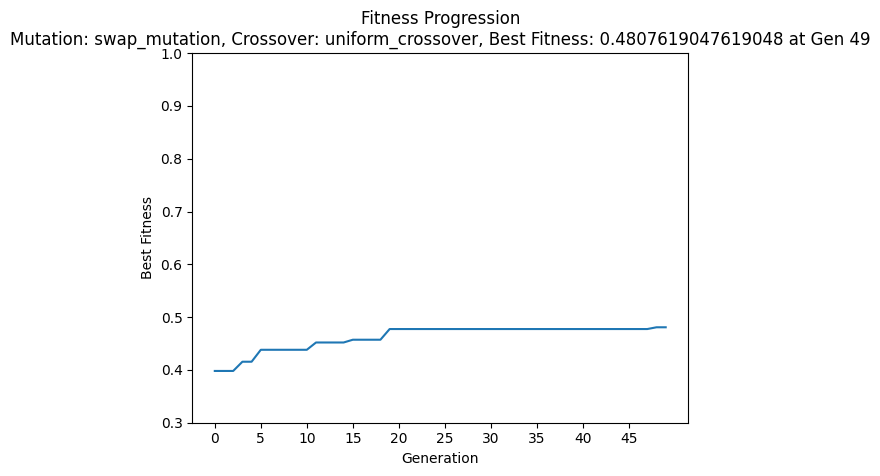

Best Fitness for this configuration: 0.4807619047619048 at Generation 49
Running GA with - Generations: 50, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.3, Elitism: True, Selection Method: roulette, Mutation: swap_mutation, Crossover: single_point_crossover


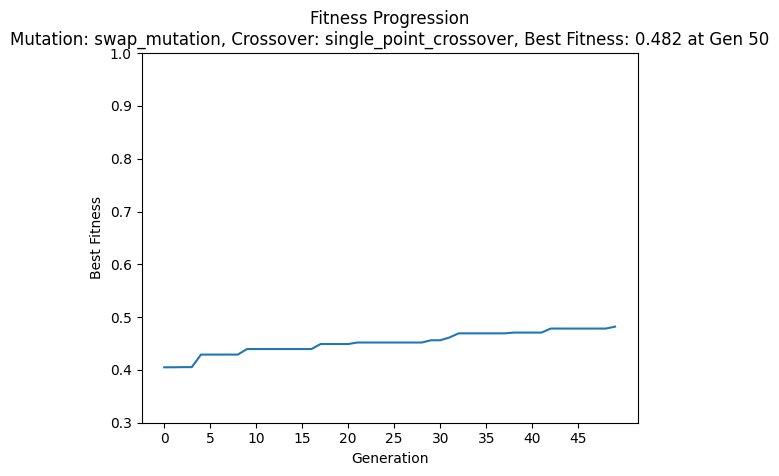

Best Fitness for this configuration: 0.482 at Generation 50
Running GA with - Generations: 50, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.3, Elitism: True, Selection Method: roulette, Mutation: shift_mutation, Crossover: uniform_crossover


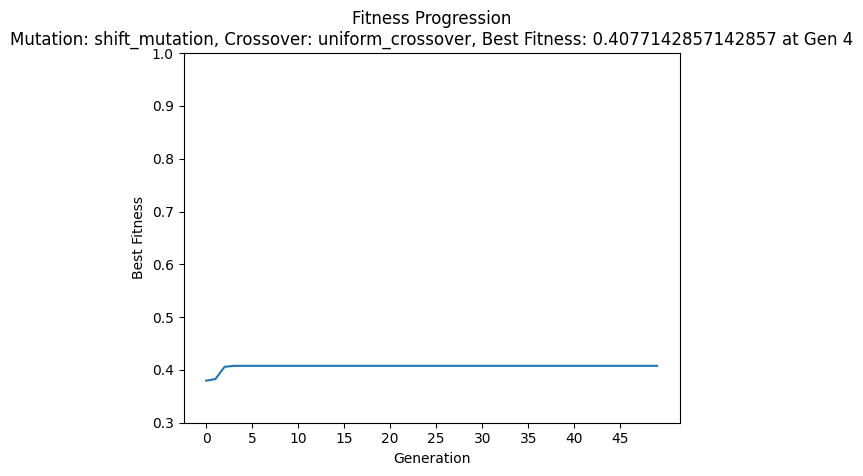

Best Fitness for this configuration: 0.4077142857142857 at Generation 4
Running GA with - Generations: 50, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.3, Elitism: True, Selection Method: roulette, Mutation: shift_mutation, Crossover: single_point_crossover


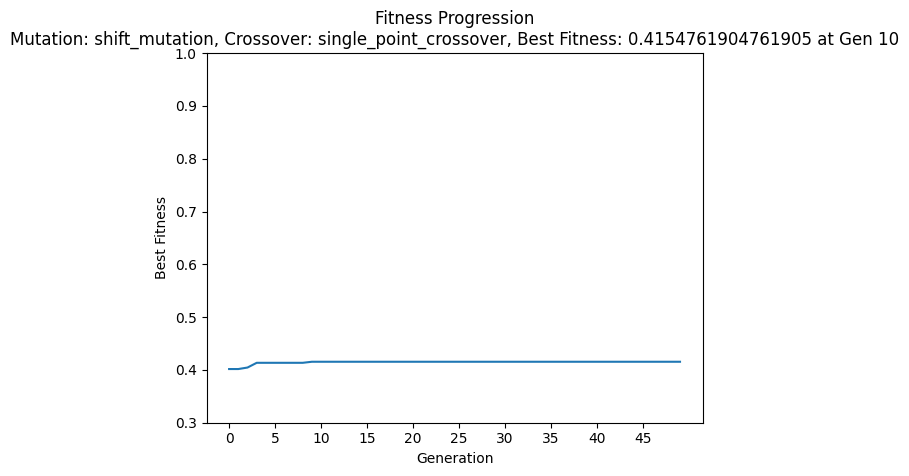

Best Fitness for this configuration: 0.4154761904761905 at Generation 10
Running GA with - Generations: 50, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.3, Elitism: True, Selection Method: roulette, Mutation: reassign_mutation, Crossover: uniform_crossover


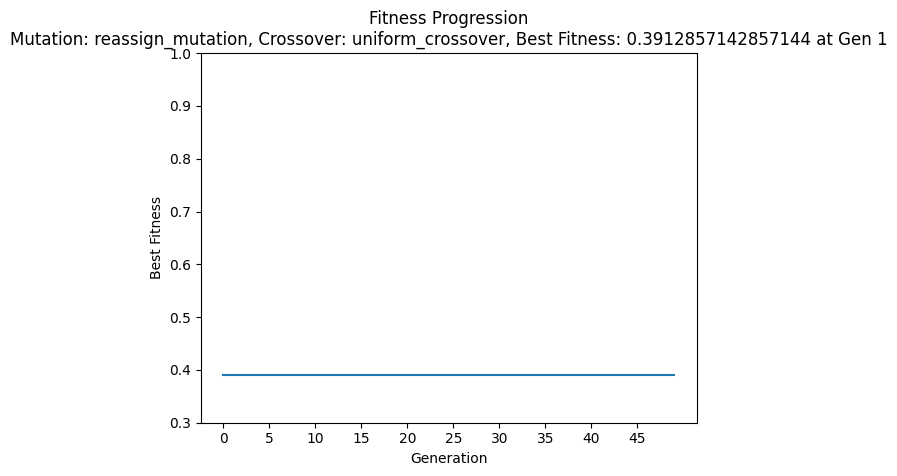

Best Fitness for this configuration: 0.3912857142857144 at Generation 1
Running GA with - Generations: 50, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.3, Elitism: True, Selection Method: roulette, Mutation: reassign_mutation, Crossover: single_point_crossover


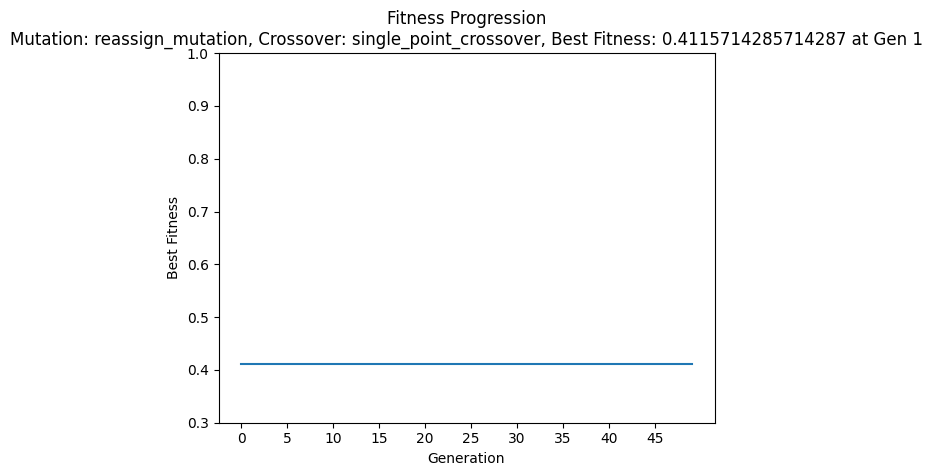

Best Fitness for this configuration: 0.4115714285714287 at Generation 1
Running GA with - Generations: 125, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.3, Elitism: True, Selection Method: roulette, Mutation: swap_mutation, Crossover: uniform_crossover


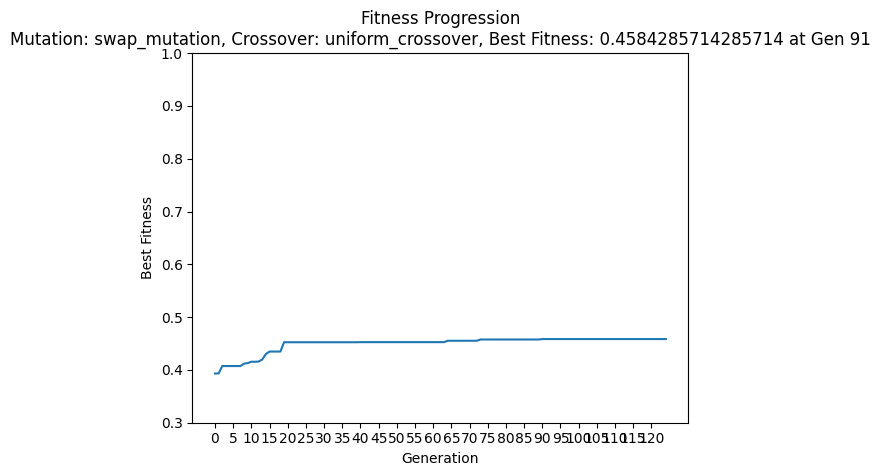

Best Fitness for this configuration: 0.4584285714285714 at Generation 91
Running GA with - Generations: 125, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.3, Elitism: True, Selection Method: roulette, Mutation: swap_mutation, Crossover: single_point_crossover


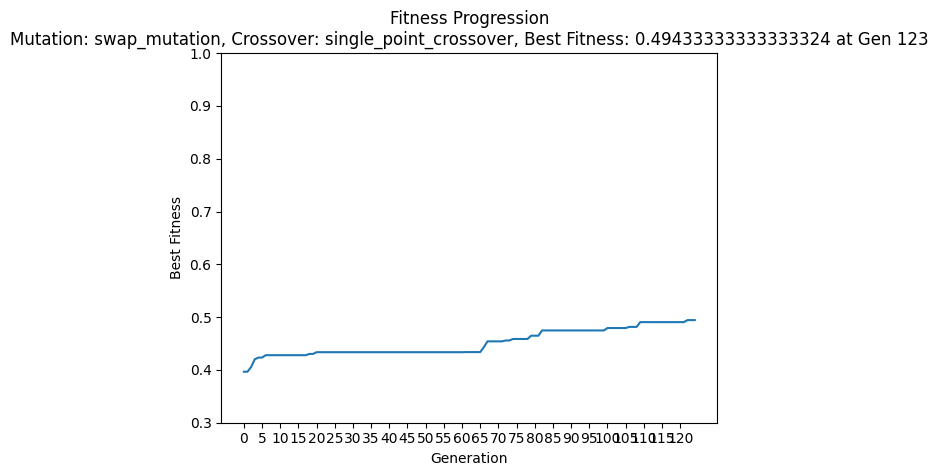

Best Fitness for this configuration: 0.49433333333333324 at Generation 123
Running GA with - Generations: 125, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.3, Elitism: True, Selection Method: roulette, Mutation: shift_mutation, Crossover: uniform_crossover


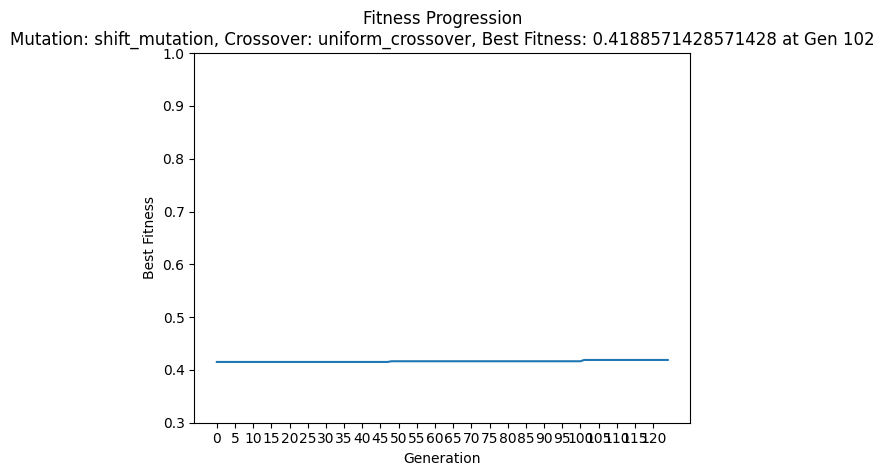

Best Fitness for this configuration: 0.4188571428571428 at Generation 102
Running GA with - Generations: 125, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.3, Elitism: True, Selection Method: roulette, Mutation: shift_mutation, Crossover: single_point_crossover


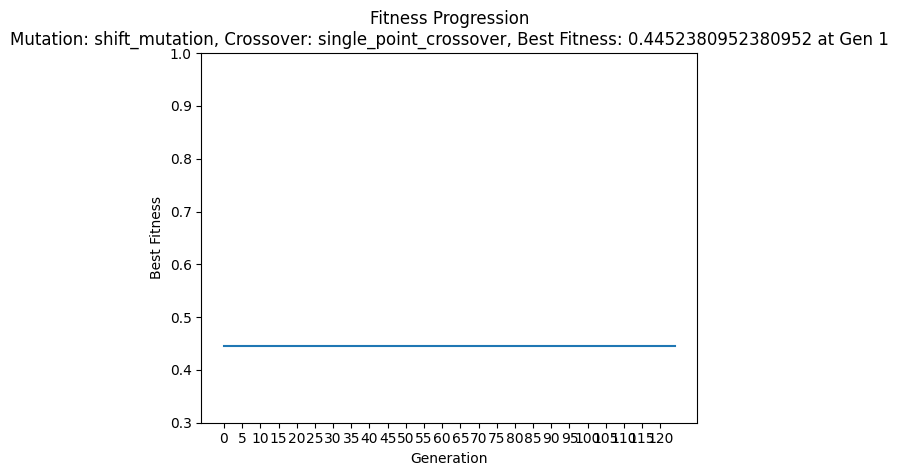

Best Fitness for this configuration: 0.4452380952380952 at Generation 1
Running GA with - Generations: 125, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.3, Elitism: True, Selection Method: roulette, Mutation: reassign_mutation, Crossover: uniform_crossover


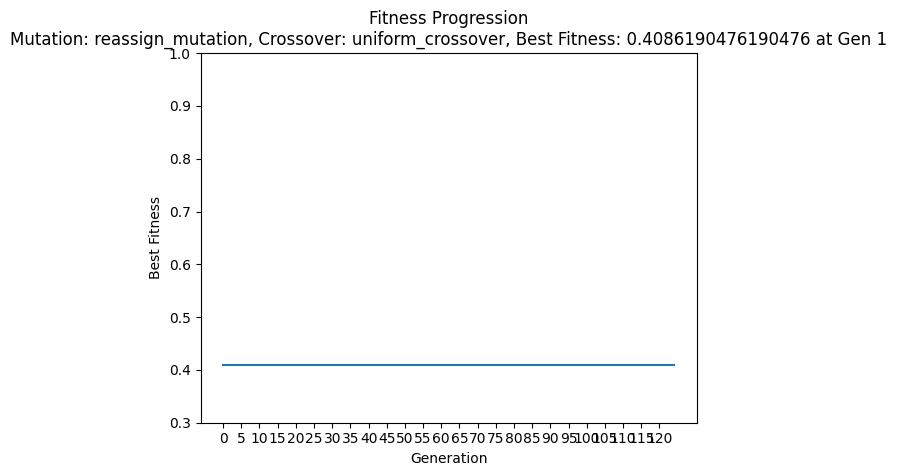

Best Fitness for this configuration: 0.4086190476190476 at Generation 1
Running GA with - Generations: 125, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.3, Elitism: True, Selection Method: roulette, Mutation: reassign_mutation, Crossover: single_point_crossover


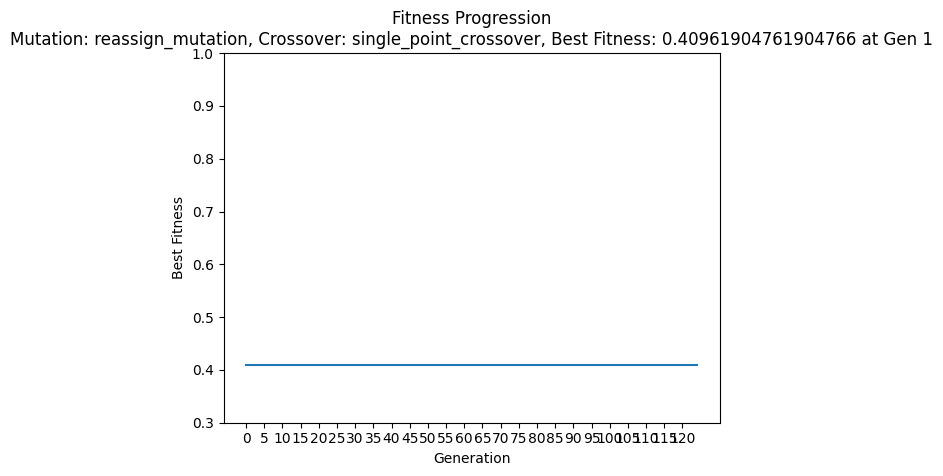

Best Fitness for this configuration: 0.40961904761904766 at Generation 1
Running GA with - Generations: 200, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.3, Elitism: True, Selection Method: roulette, Mutation: swap_mutation, Crossover: uniform_crossover


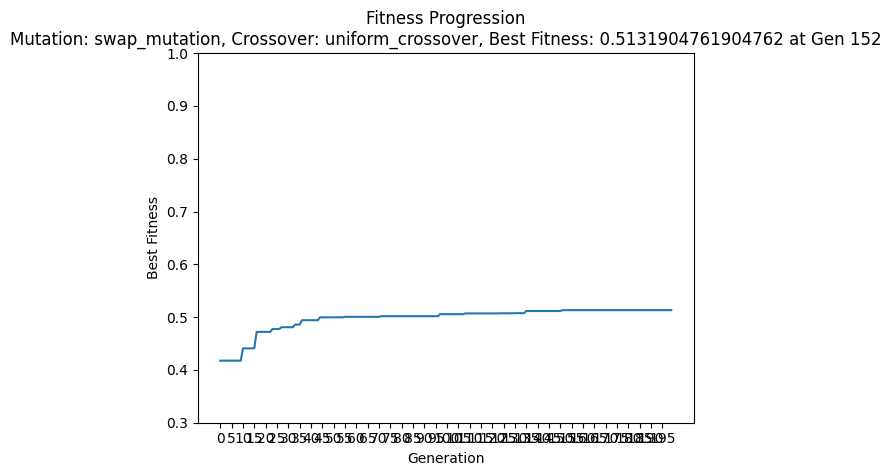

Best Fitness for this configuration: 0.5131904761904762 at Generation 152
Running GA with - Generations: 200, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.3, Elitism: True, Selection Method: roulette, Mutation: swap_mutation, Crossover: single_point_crossover


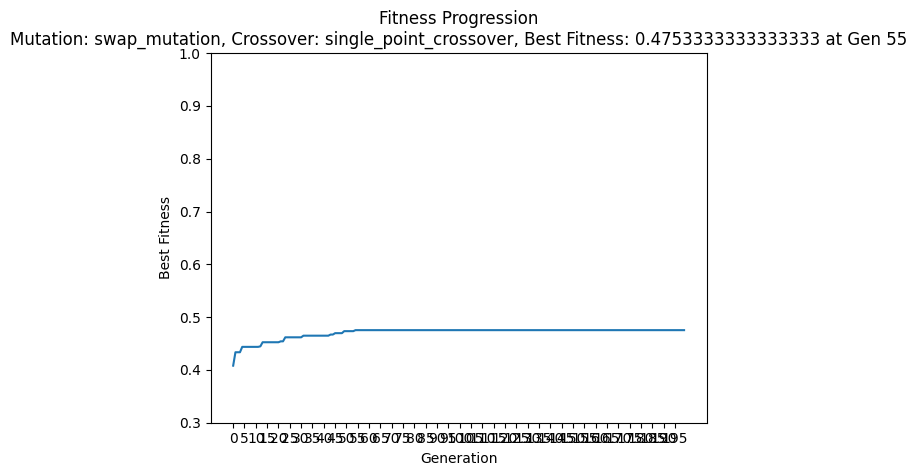

Best Fitness for this configuration: 0.4753333333333333 at Generation 55
Running GA with - Generations: 200, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.3, Elitism: True, Selection Method: roulette, Mutation: shift_mutation, Crossover: uniform_crossover


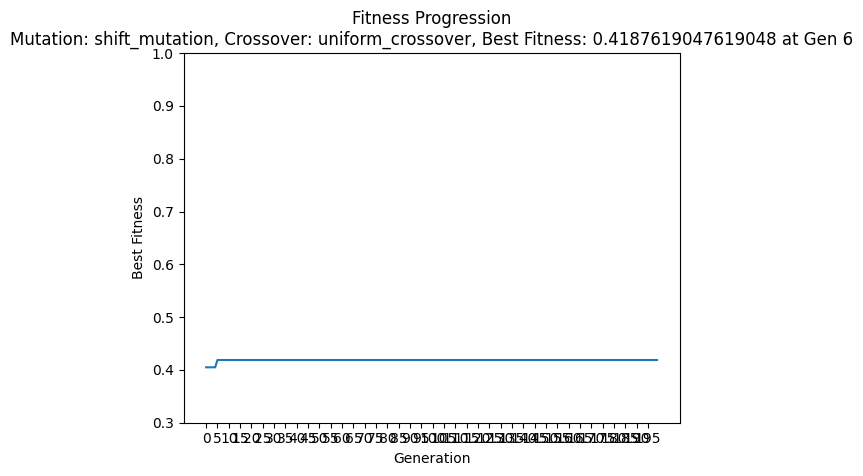

Best Fitness for this configuration: 0.4187619047619048 at Generation 6
Running GA with - Generations: 200, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.3, Elitism: True, Selection Method: roulette, Mutation: shift_mutation, Crossover: single_point_crossover


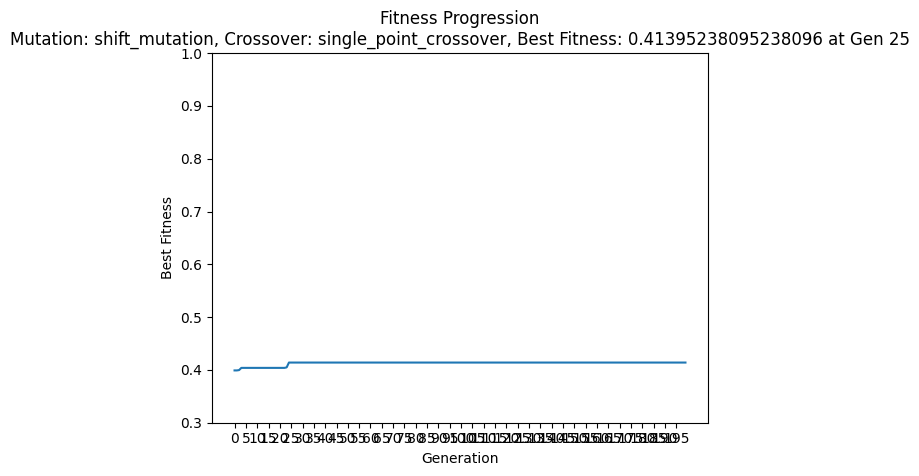

Best Fitness for this configuration: 0.41395238095238096 at Generation 25
Running GA with - Generations: 200, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.3, Elitism: True, Selection Method: roulette, Mutation: reassign_mutation, Crossover: uniform_crossover


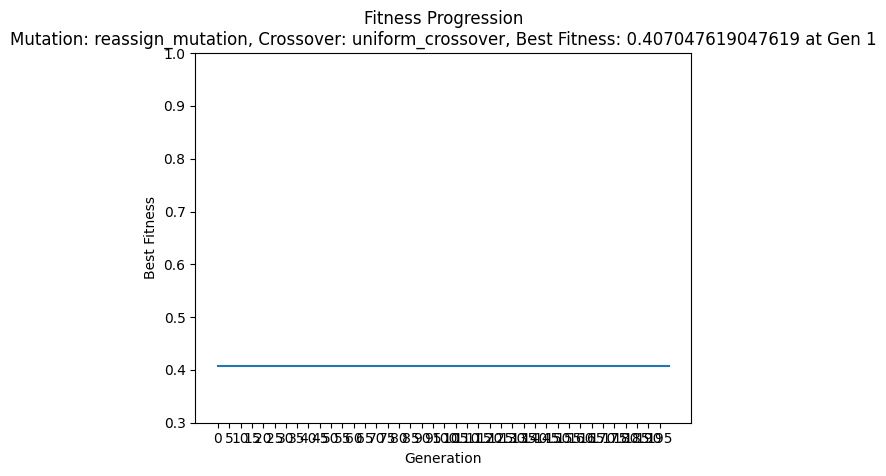

Best Fitness for this configuration: 0.407047619047619 at Generation 1
Running GA with - Generations: 200, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.3, Elitism: True, Selection Method: roulette, Mutation: reassign_mutation, Crossover: single_point_crossover


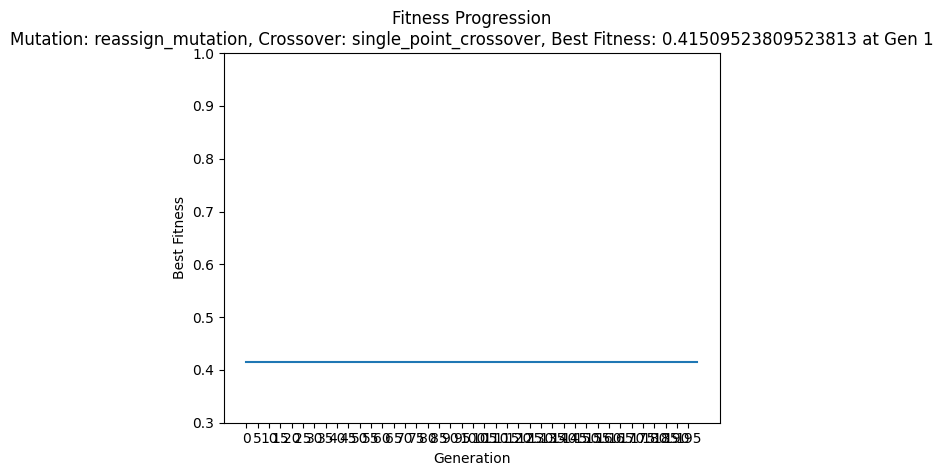

Best Fitness for this configuration: 0.41509523809523813 at Generation 1
Running GA with - Generations: 50, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.3, Elitism: False, Selection Method: tournament, Mutation: swap_mutation, Crossover: uniform_crossover


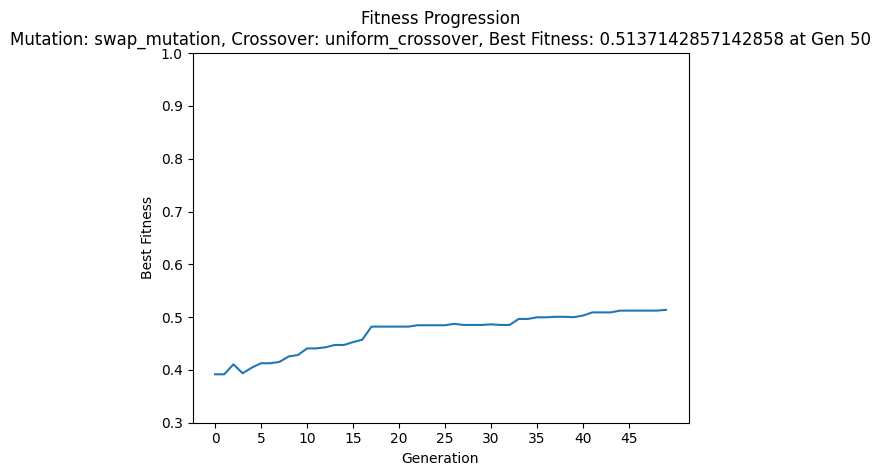

Best Fitness for this configuration: 0.5137142857142858 at Generation 50
Running GA with - Generations: 50, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.3, Elitism: False, Selection Method: tournament, Mutation: swap_mutation, Crossover: single_point_crossover


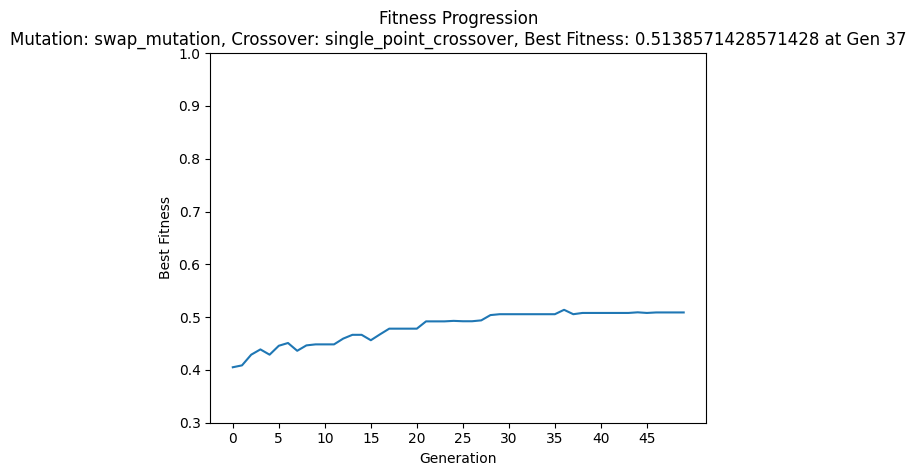

Best Fitness for this configuration: 0.5138571428571428 at Generation 37
Running GA with - Generations: 50, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.3, Elitism: False, Selection Method: tournament, Mutation: shift_mutation, Crossover: uniform_crossover


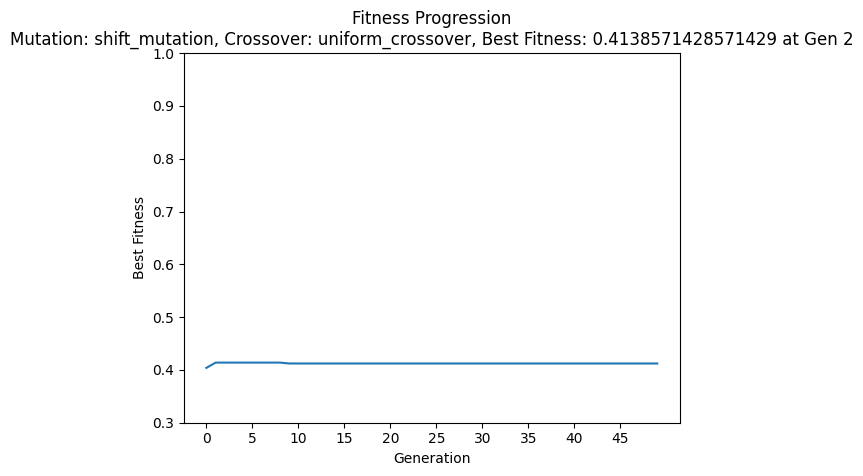

Best Fitness for this configuration: 0.4138571428571429 at Generation 2
Running GA with - Generations: 50, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.3, Elitism: False, Selection Method: tournament, Mutation: shift_mutation, Crossover: single_point_crossover


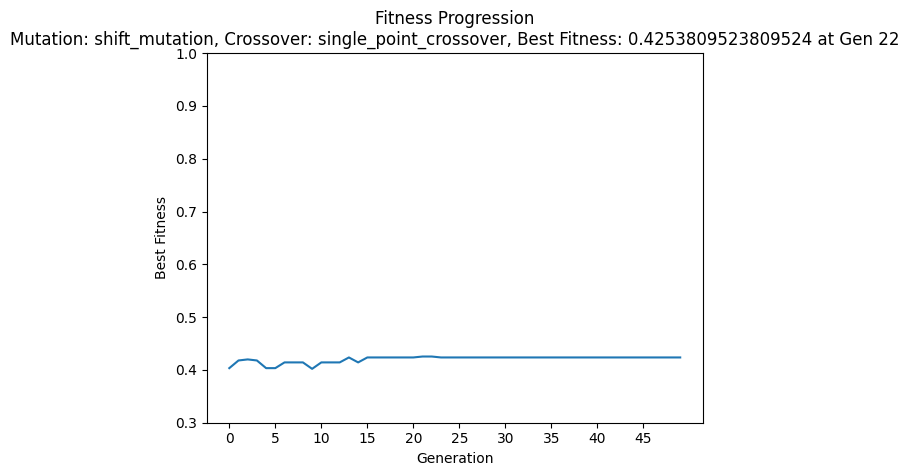

Best Fitness for this configuration: 0.4253809523809524 at Generation 22
Running GA with - Generations: 50, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.3, Elitism: False, Selection Method: tournament, Mutation: reassign_mutation, Crossover: uniform_crossover


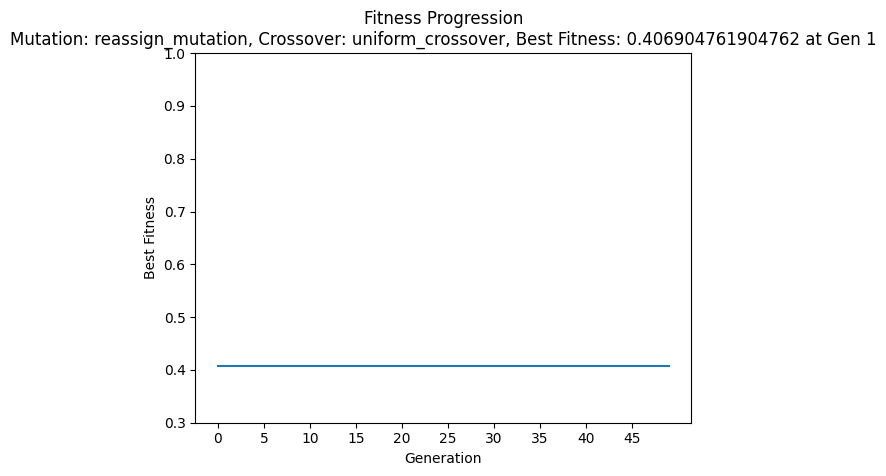

Best Fitness for this configuration: 0.406904761904762 at Generation 1
Running GA with - Generations: 50, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.3, Elitism: False, Selection Method: tournament, Mutation: reassign_mutation, Crossover: single_point_crossover


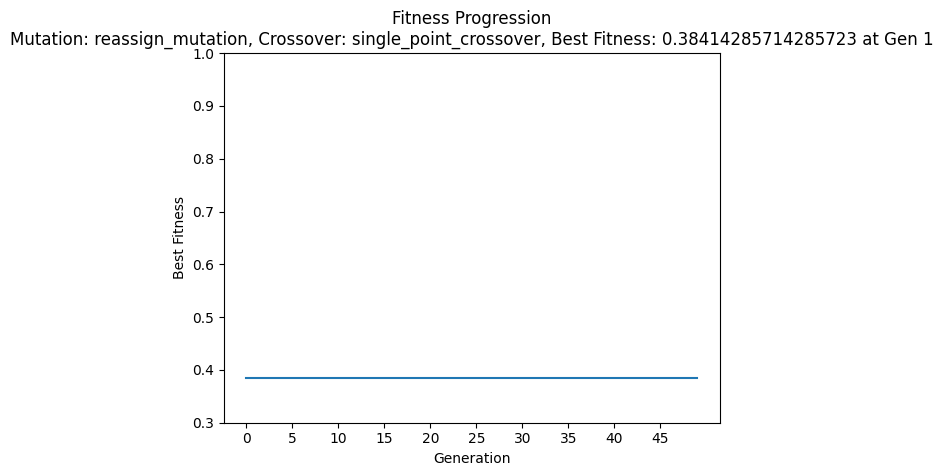

Best Fitness for this configuration: 0.38414285714285723 at Generation 1
Running GA with - Generations: 125, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.3, Elitism: False, Selection Method: tournament, Mutation: swap_mutation, Crossover: uniform_crossover


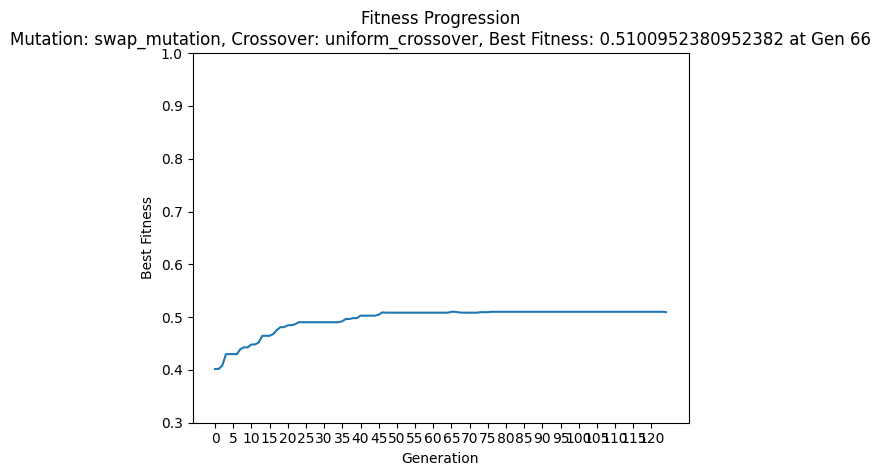

Best Fitness for this configuration: 0.5100952380952382 at Generation 66
Running GA with - Generations: 125, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.3, Elitism: False, Selection Method: tournament, Mutation: swap_mutation, Crossover: single_point_crossover


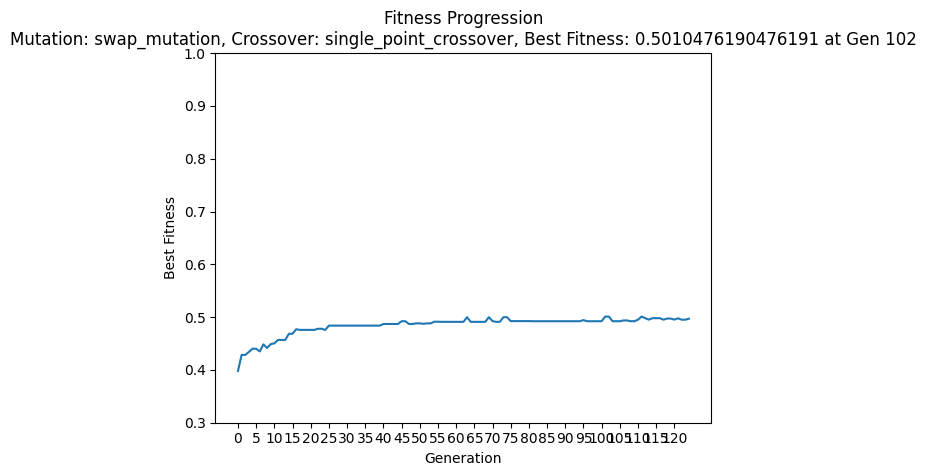

Best Fitness for this configuration: 0.5010476190476191 at Generation 102
Running GA with - Generations: 125, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.3, Elitism: False, Selection Method: tournament, Mutation: shift_mutation, Crossover: uniform_crossover


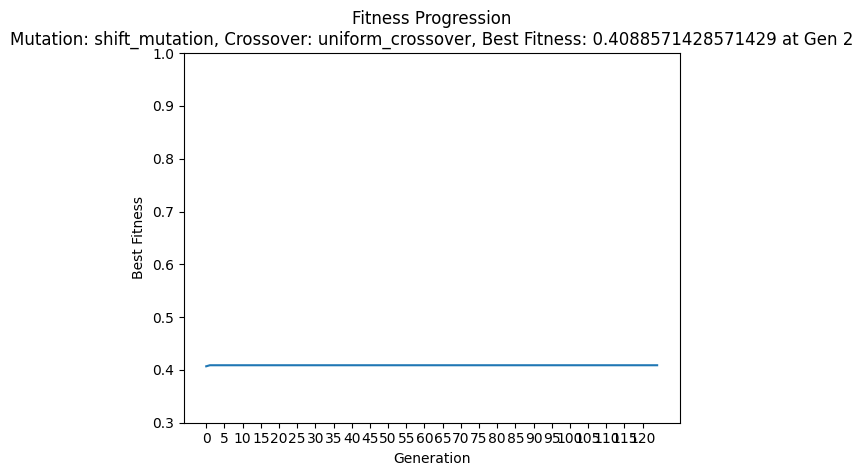

Best Fitness for this configuration: 0.4088571428571429 at Generation 2
Running GA with - Generations: 125, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.3, Elitism: False, Selection Method: tournament, Mutation: shift_mutation, Crossover: single_point_crossover


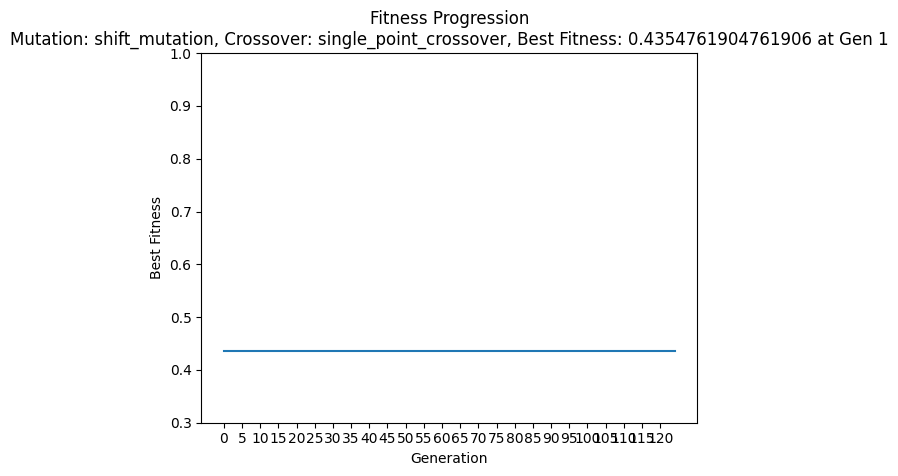

Best Fitness for this configuration: 0.4354761904761906 at Generation 1
Running GA with - Generations: 125, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.3, Elitism: False, Selection Method: tournament, Mutation: reassign_mutation, Crossover: uniform_crossover


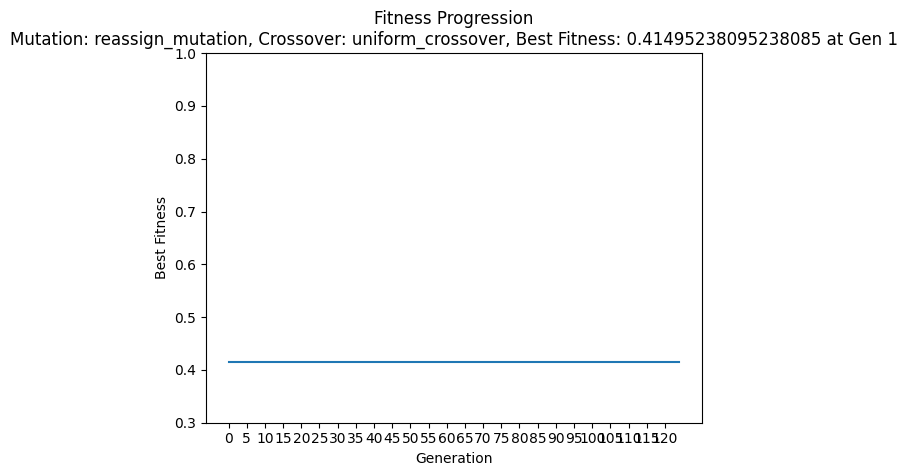

Best Fitness for this configuration: 0.41495238095238085 at Generation 1
Running GA with - Generations: 125, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.3, Elitism: False, Selection Method: tournament, Mutation: reassign_mutation, Crossover: single_point_crossover


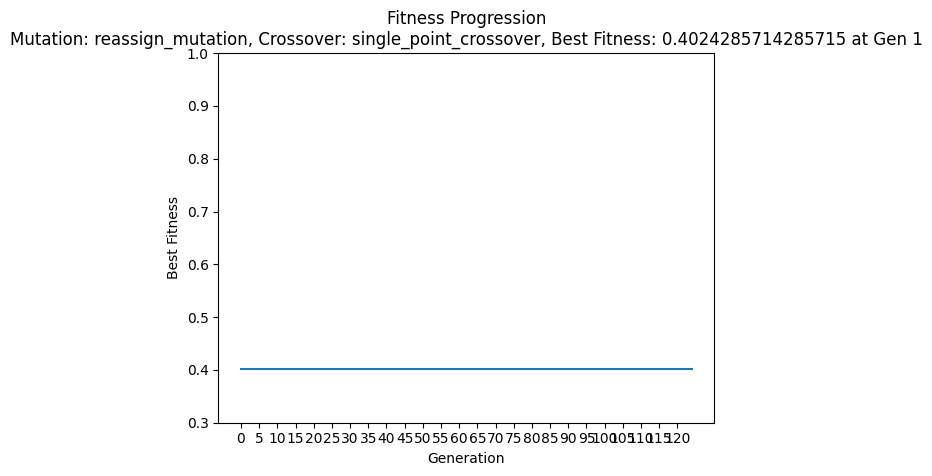

Best Fitness for this configuration: 0.4024285714285715 at Generation 1
Running GA with - Generations: 200, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.3, Elitism: False, Selection Method: tournament, Mutation: swap_mutation, Crossover: uniform_crossover


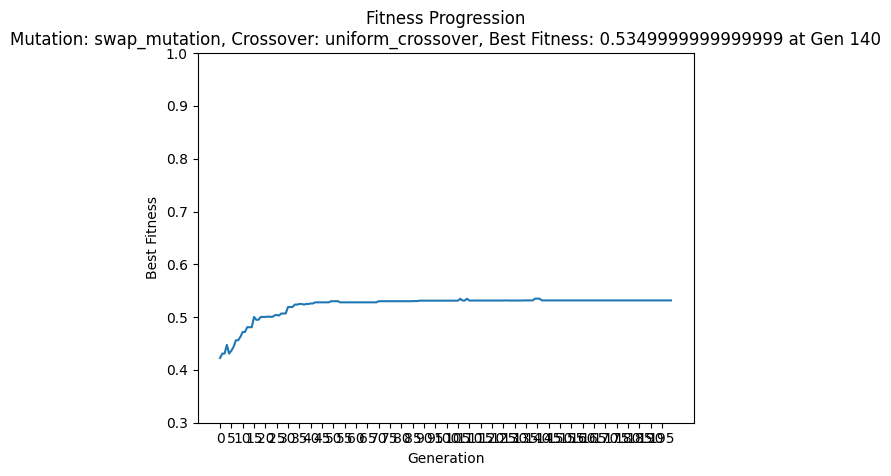

Best Fitness for this configuration: 0.5349999999999999 at Generation 140
Running GA with - Generations: 200, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.3, Elitism: False, Selection Method: tournament, Mutation: swap_mutation, Crossover: single_point_crossover


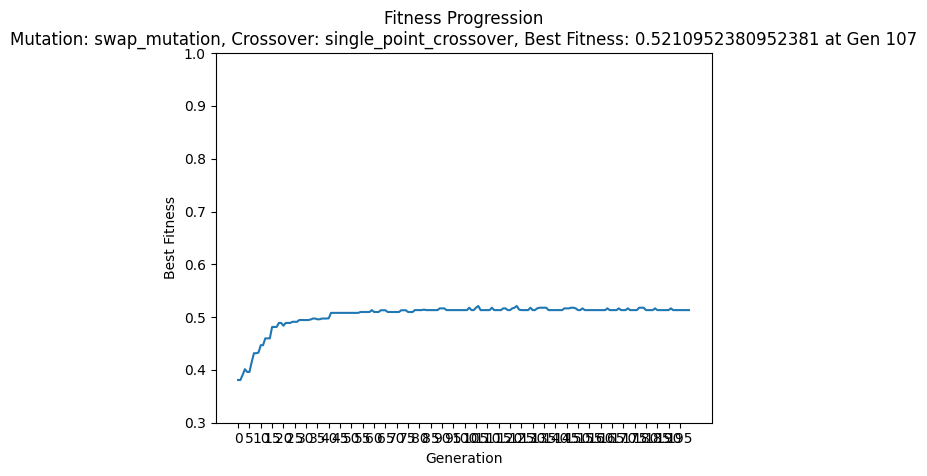

Best Fitness for this configuration: 0.5210952380952381 at Generation 107
Running GA with - Generations: 200, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.3, Elitism: False, Selection Method: tournament, Mutation: shift_mutation, Crossover: uniform_crossover


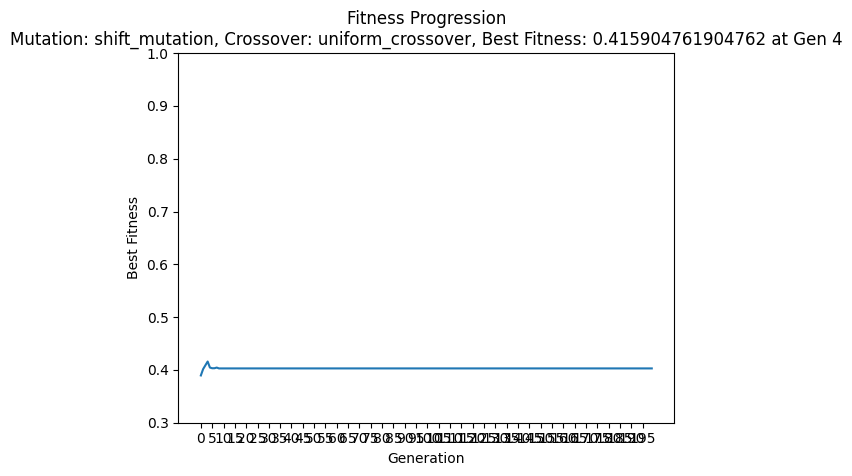

Best Fitness for this configuration: 0.415904761904762 at Generation 4
Running GA with - Generations: 200, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.3, Elitism: False, Selection Method: tournament, Mutation: shift_mutation, Crossover: single_point_crossover


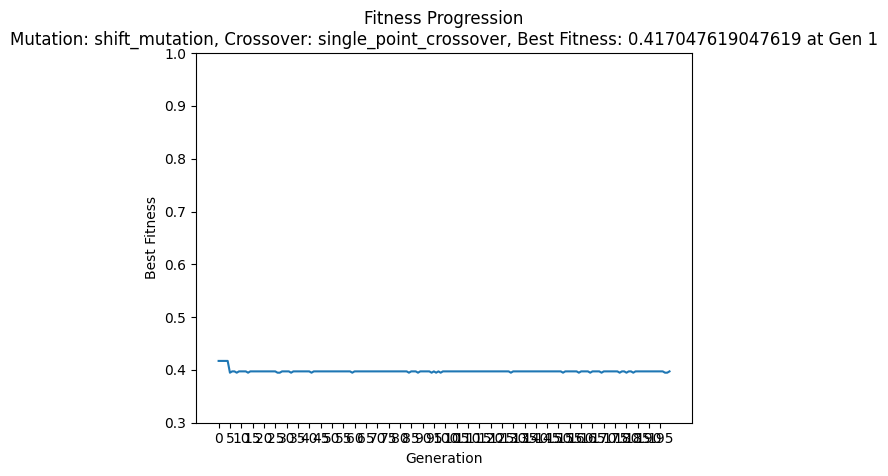

Best Fitness for this configuration: 0.417047619047619 at Generation 1
Running GA with - Generations: 200, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.3, Elitism: False, Selection Method: tournament, Mutation: reassign_mutation, Crossover: uniform_crossover


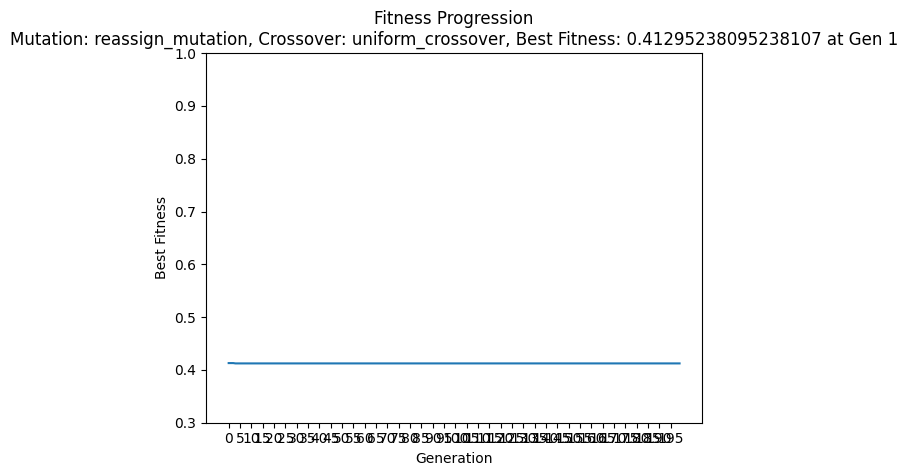

Best Fitness for this configuration: 0.41295238095238107 at Generation 1
Running GA with - Generations: 200, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.3, Elitism: False, Selection Method: tournament, Mutation: reassign_mutation, Crossover: single_point_crossover


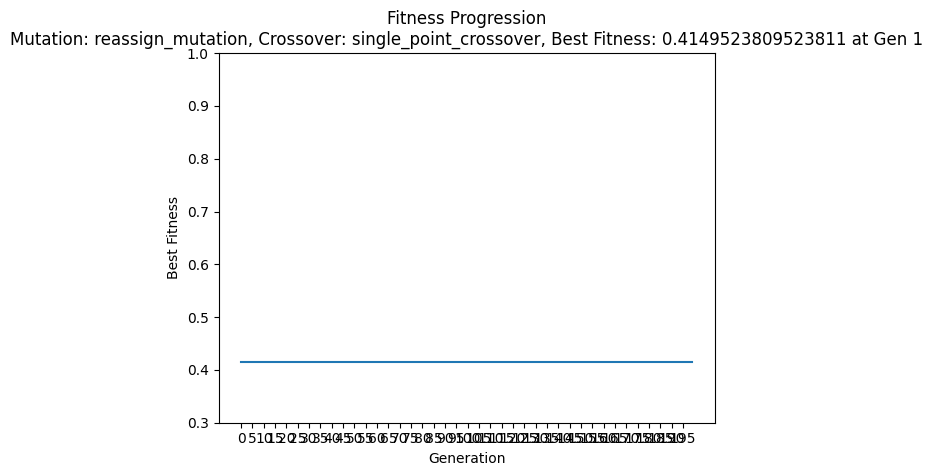

Best Fitness for this configuration: 0.4149523809523811 at Generation 1
Running GA with - Generations: 50, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.3, Elitism: False, Selection Method: roulette, Mutation: swap_mutation, Crossover: uniform_crossover


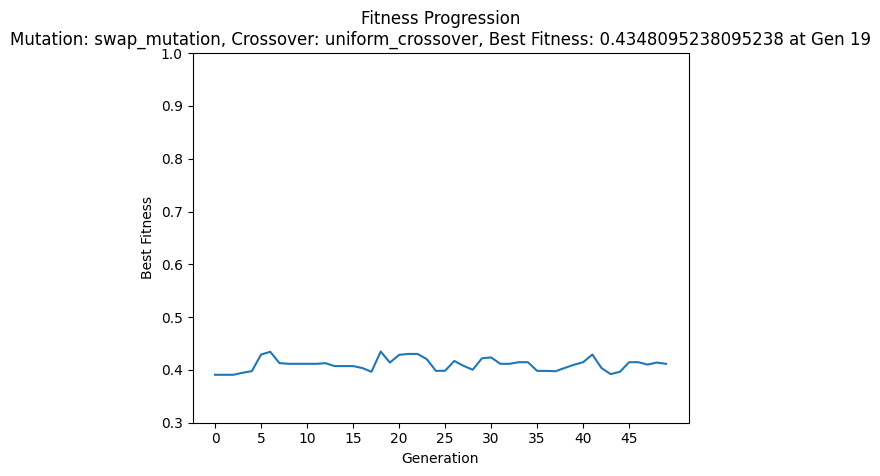

Best Fitness for this configuration: 0.4348095238095238 at Generation 19
Running GA with - Generations: 50, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.3, Elitism: False, Selection Method: roulette, Mutation: swap_mutation, Crossover: single_point_crossover


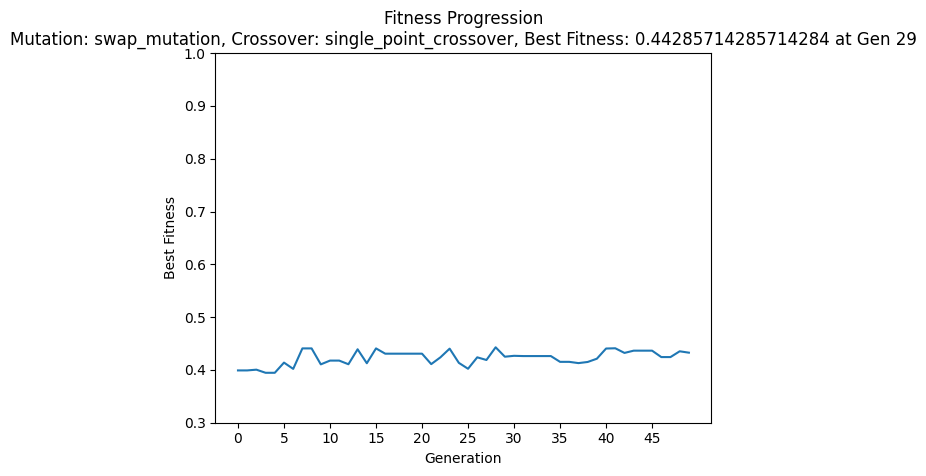

Best Fitness for this configuration: 0.44285714285714284 at Generation 29
Running GA with - Generations: 50, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.3, Elitism: False, Selection Method: roulette, Mutation: shift_mutation, Crossover: uniform_crossover


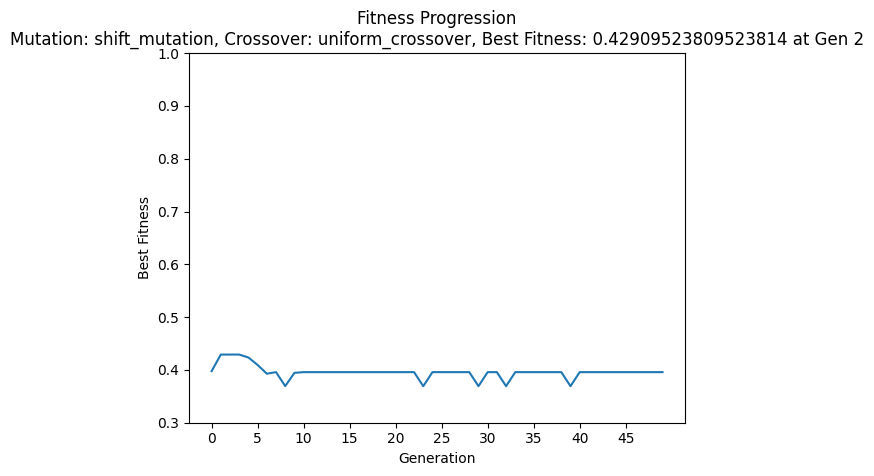

Best Fitness for this configuration: 0.42909523809523814 at Generation 2
Running GA with - Generations: 50, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.3, Elitism: False, Selection Method: roulette, Mutation: shift_mutation, Crossover: single_point_crossover


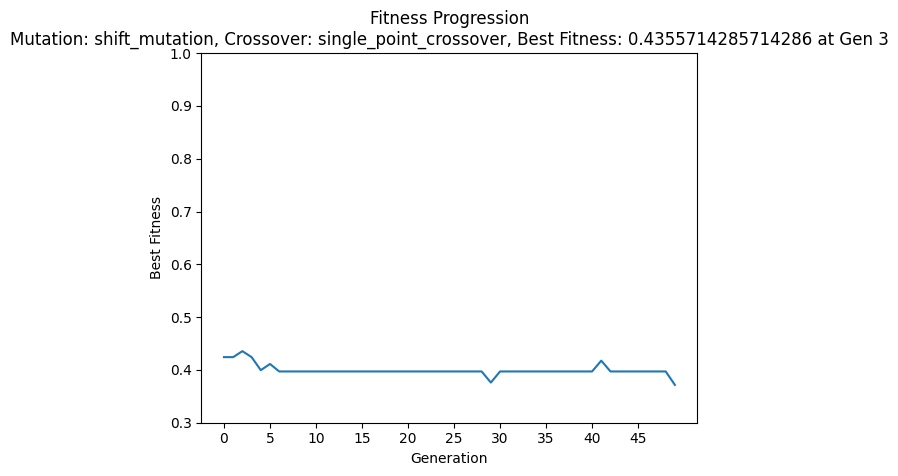

Best Fitness for this configuration: 0.4355714285714286 at Generation 3
Running GA with - Generations: 50, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.3, Elitism: False, Selection Method: roulette, Mutation: reassign_mutation, Crossover: uniform_crossover


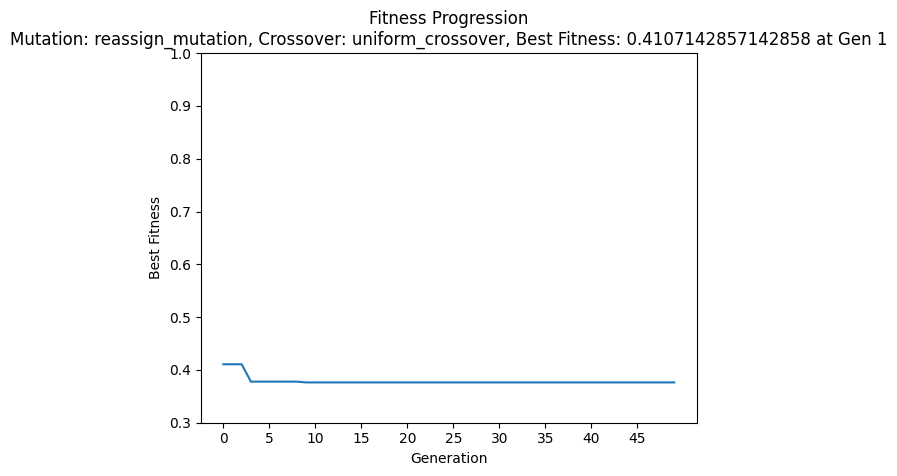

Best Fitness for this configuration: 0.4107142857142858 at Generation 1
Running GA with - Generations: 50, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.3, Elitism: False, Selection Method: roulette, Mutation: reassign_mutation, Crossover: single_point_crossover


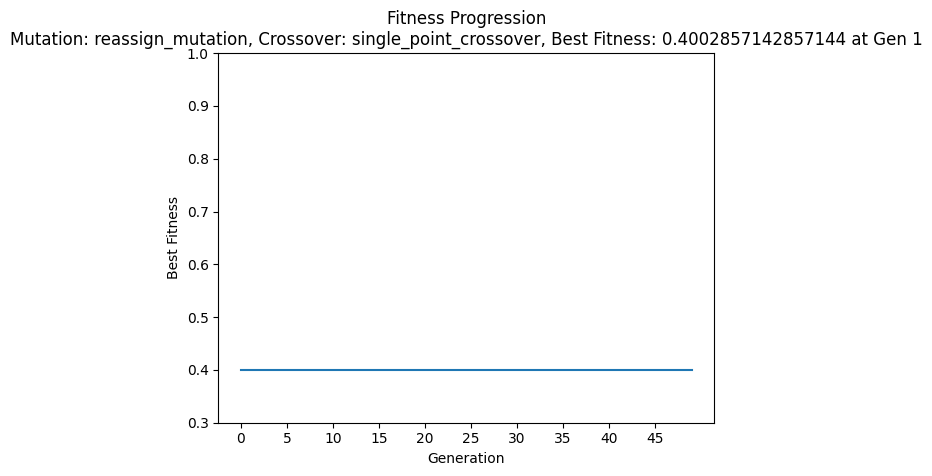

Best Fitness for this configuration: 0.4002857142857144 at Generation 1
Running GA with - Generations: 125, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.3, Elitism: False, Selection Method: roulette, Mutation: swap_mutation, Crossover: uniform_crossover


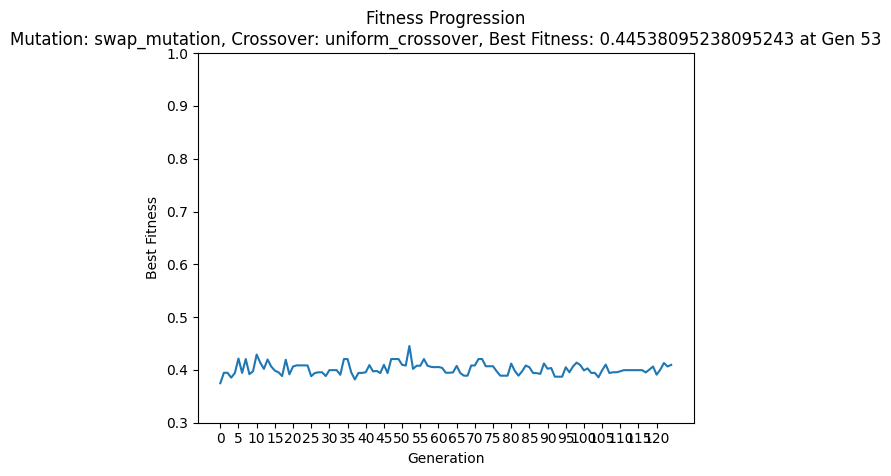

Best Fitness for this configuration: 0.44538095238095243 at Generation 53
Running GA with - Generations: 125, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.3, Elitism: False, Selection Method: roulette, Mutation: swap_mutation, Crossover: single_point_crossover


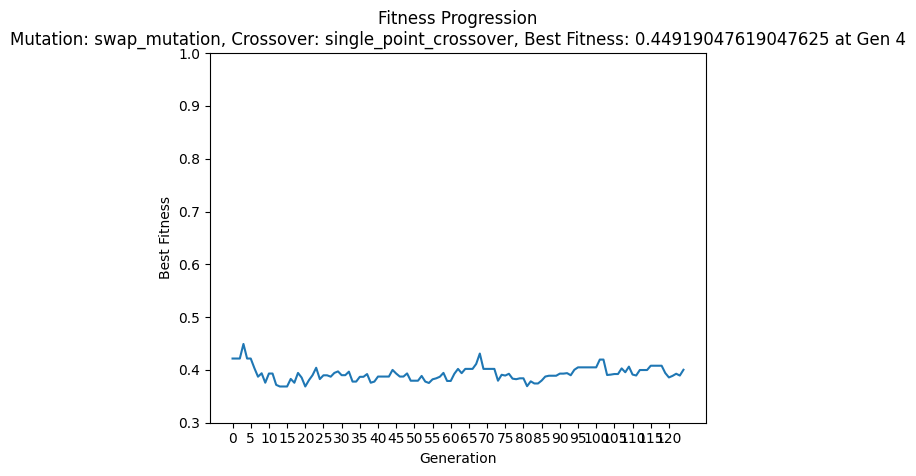

Best Fitness for this configuration: 0.44919047619047625 at Generation 4
Running GA with - Generations: 125, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.3, Elitism: False, Selection Method: roulette, Mutation: shift_mutation, Crossover: uniform_crossover


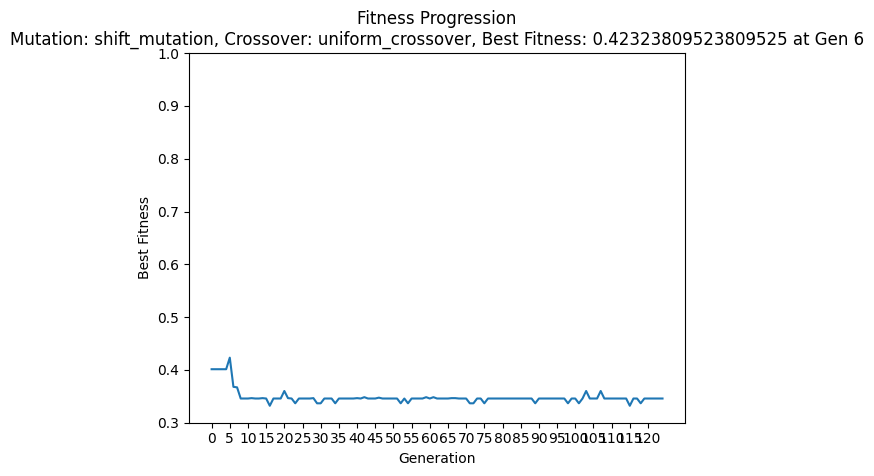

Best Fitness for this configuration: 0.42323809523809525 at Generation 6
Running GA with - Generations: 125, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.3, Elitism: False, Selection Method: roulette, Mutation: shift_mutation, Crossover: single_point_crossover


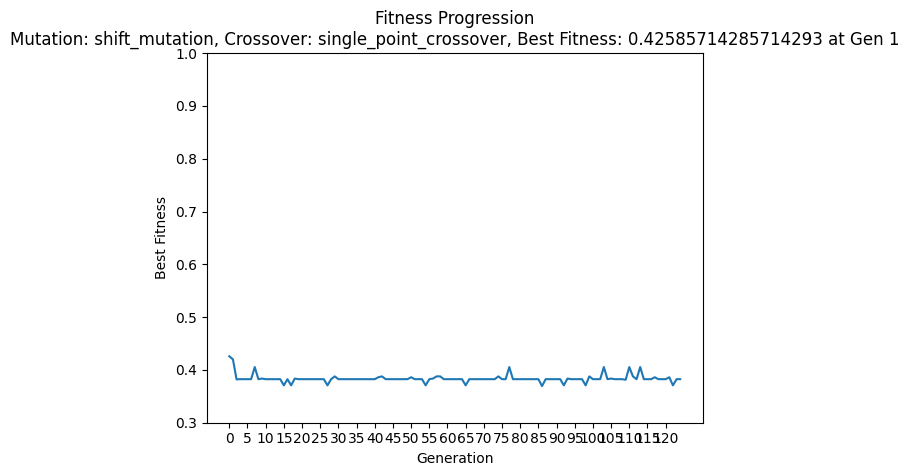

Best Fitness for this configuration: 0.42585714285714293 at Generation 1
Running GA with - Generations: 125, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.3, Elitism: False, Selection Method: roulette, Mutation: reassign_mutation, Crossover: uniform_crossover


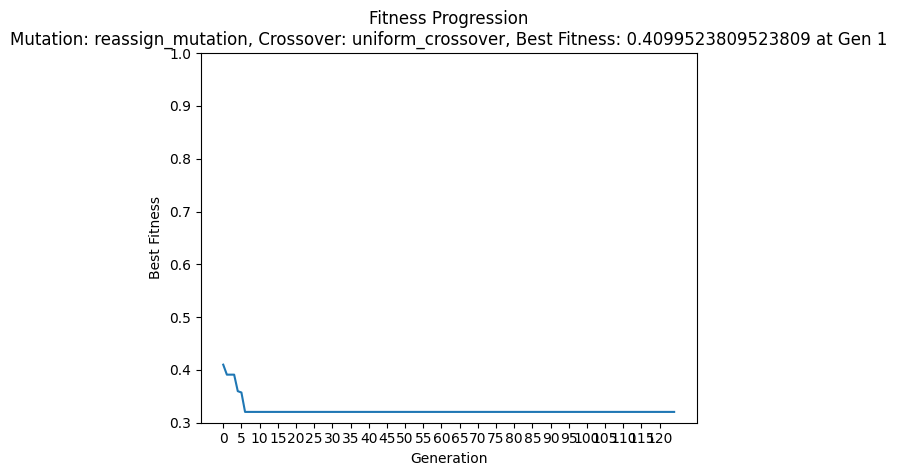

Best Fitness for this configuration: 0.4099523809523809 at Generation 1
Running GA with - Generations: 125, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.3, Elitism: False, Selection Method: roulette, Mutation: reassign_mutation, Crossover: single_point_crossover


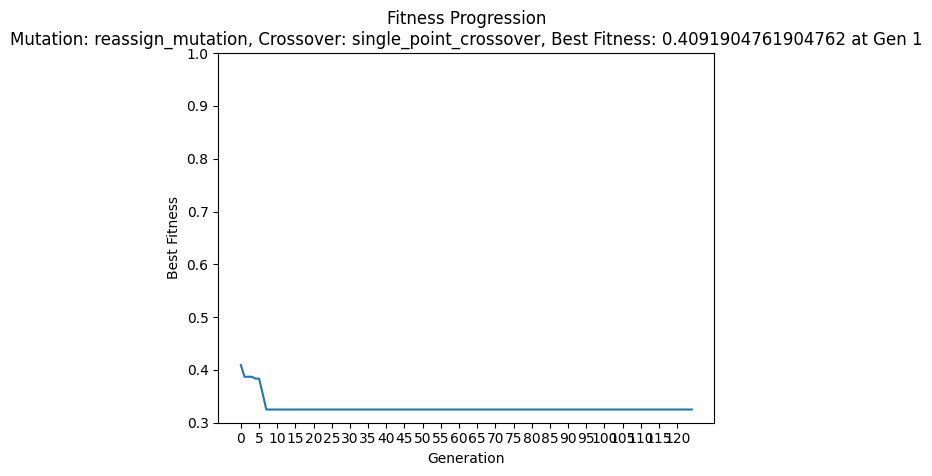

Best Fitness for this configuration: 0.4091904761904762 at Generation 1
Running GA with - Generations: 200, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.3, Elitism: False, Selection Method: roulette, Mutation: swap_mutation, Crossover: uniform_crossover


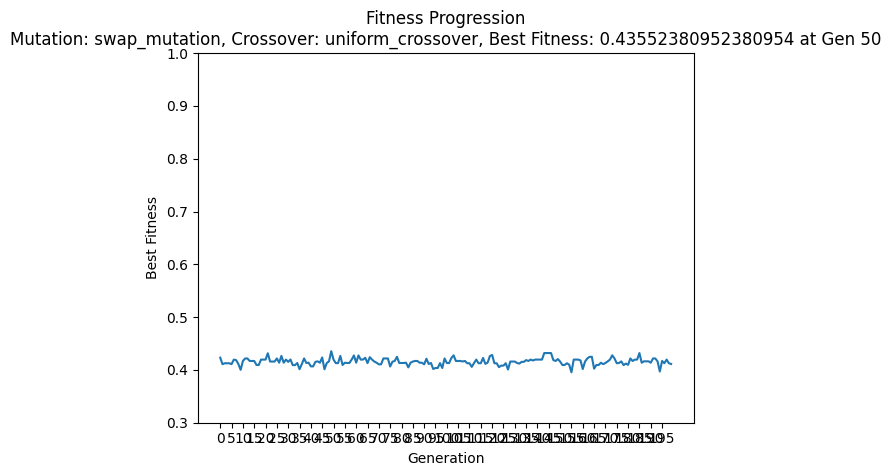

Best Fitness for this configuration: 0.43552380952380954 at Generation 50
Running GA with - Generations: 200, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.3, Elitism: False, Selection Method: roulette, Mutation: swap_mutation, Crossover: single_point_crossover


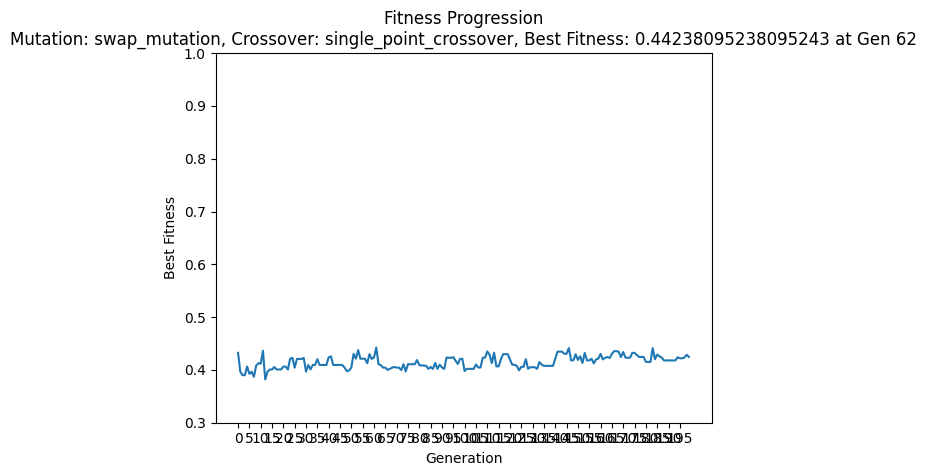

Best Fitness for this configuration: 0.44238095238095243 at Generation 62
Running GA with - Generations: 200, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.3, Elitism: False, Selection Method: roulette, Mutation: shift_mutation, Crossover: uniform_crossover


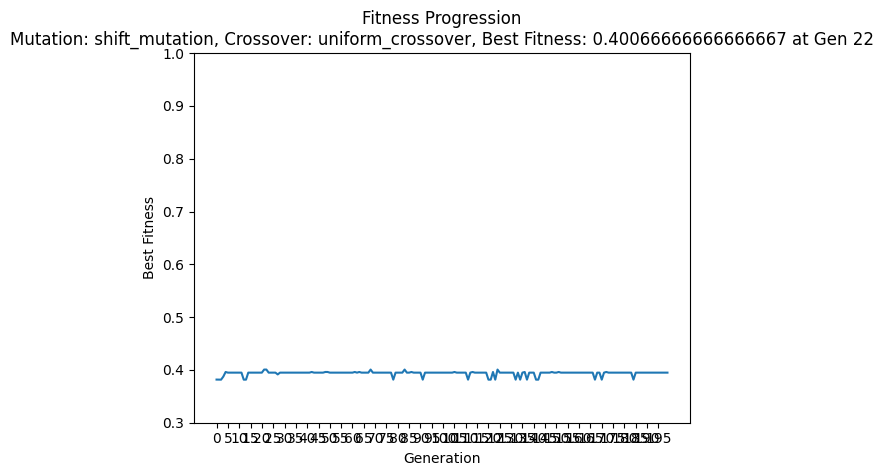

Best Fitness for this configuration: 0.40066666666666667 at Generation 22
Running GA with - Generations: 200, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.3, Elitism: False, Selection Method: roulette, Mutation: shift_mutation, Crossover: single_point_crossover


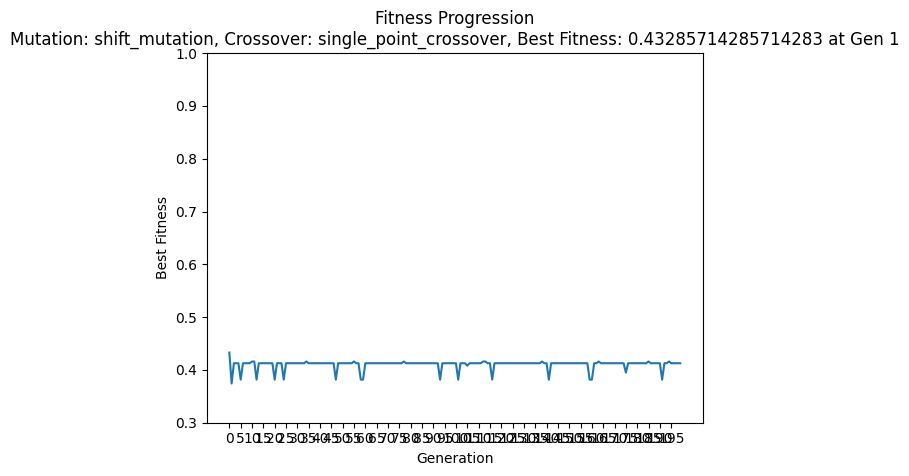

Best Fitness for this configuration: 0.43285714285714283 at Generation 1
Running GA with - Generations: 200, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.3, Elitism: False, Selection Method: roulette, Mutation: reassign_mutation, Crossover: uniform_crossover


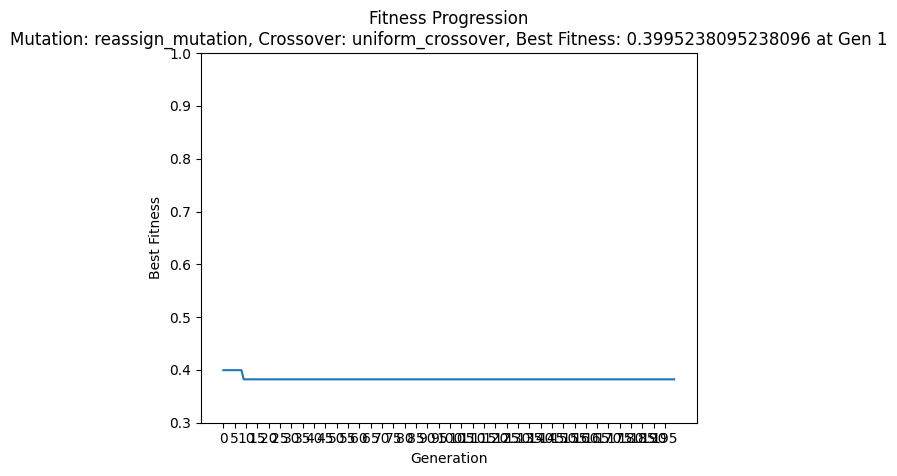

Best Fitness for this configuration: 0.3995238095238096 at Generation 1
Running GA with - Generations: 200, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.3, Elitism: False, Selection Method: roulette, Mutation: reassign_mutation, Crossover: single_point_crossover


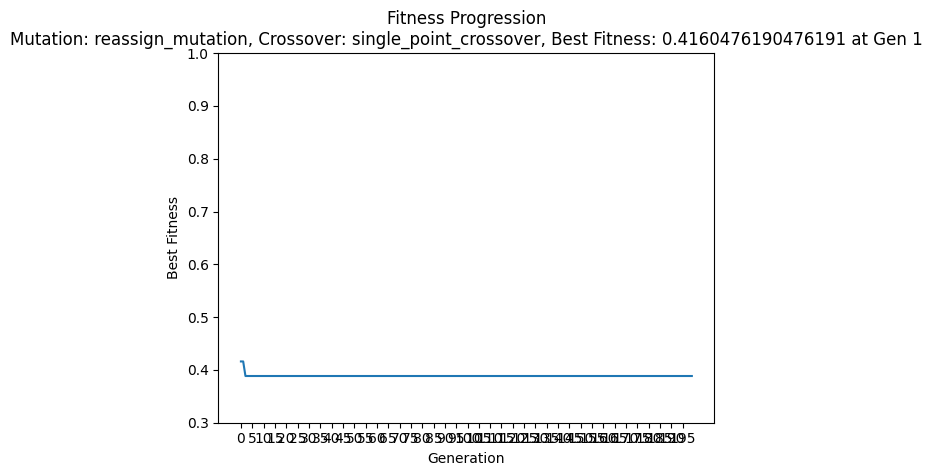

Best Fitness for this configuration: 0.4160476190476191 at Generation 1
Running GA with - Generations: 50, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.5, Elitism: True, Selection Method: tournament, Mutation: swap_mutation, Crossover: uniform_crossover


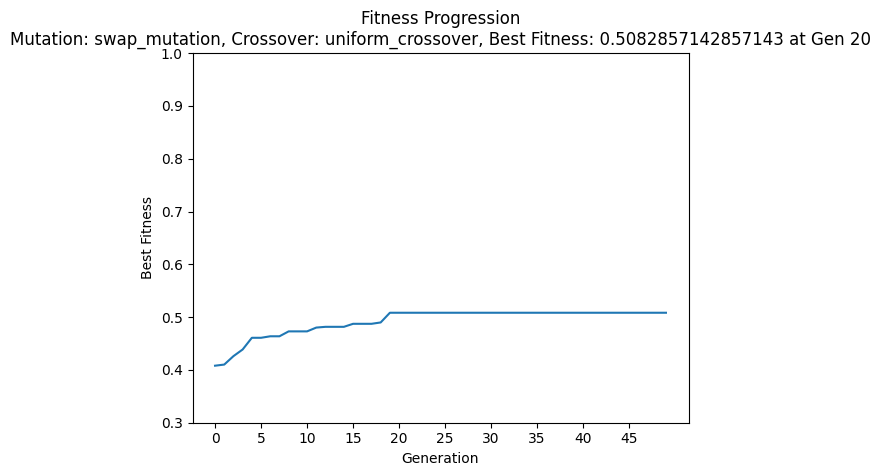

Best Fitness for this configuration: 0.5082857142857143 at Generation 20
Running GA with - Generations: 50, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.5, Elitism: True, Selection Method: tournament, Mutation: swap_mutation, Crossover: single_point_crossover


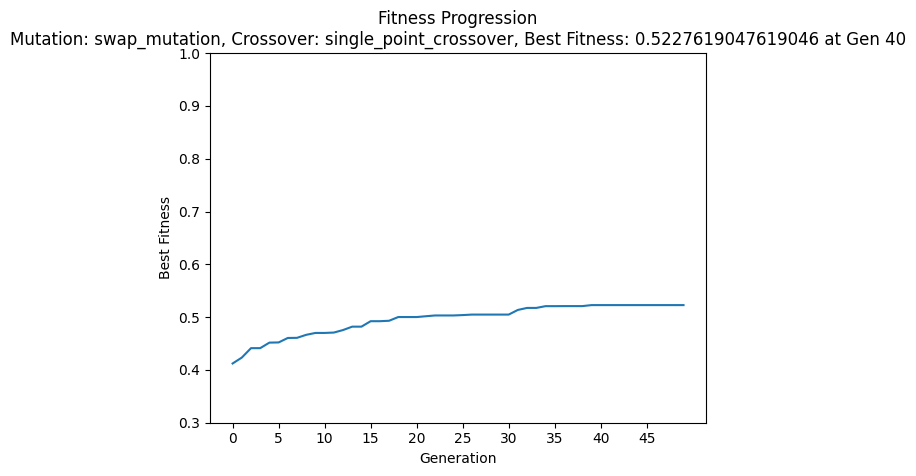

Best Fitness for this configuration: 0.5227619047619046 at Generation 40
Running GA with - Generations: 50, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.5, Elitism: True, Selection Method: tournament, Mutation: shift_mutation, Crossover: uniform_crossover


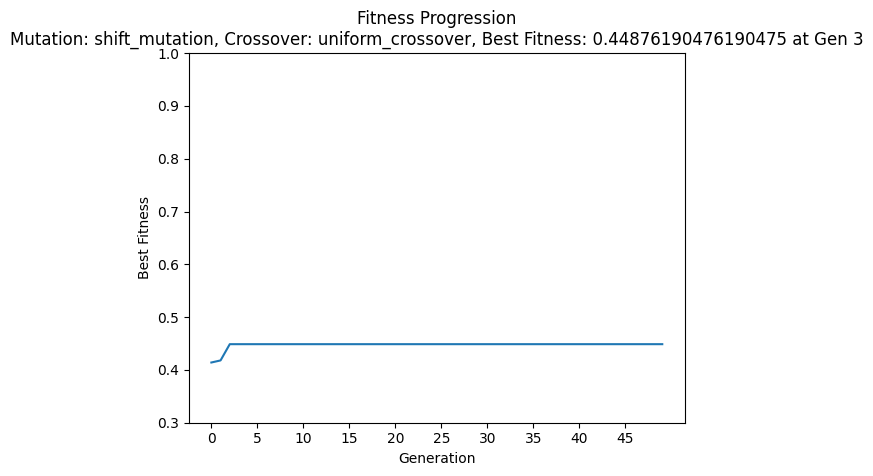

Best Fitness for this configuration: 0.44876190476190475 at Generation 3
Running GA with - Generations: 50, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.5, Elitism: True, Selection Method: tournament, Mutation: shift_mutation, Crossover: single_point_crossover


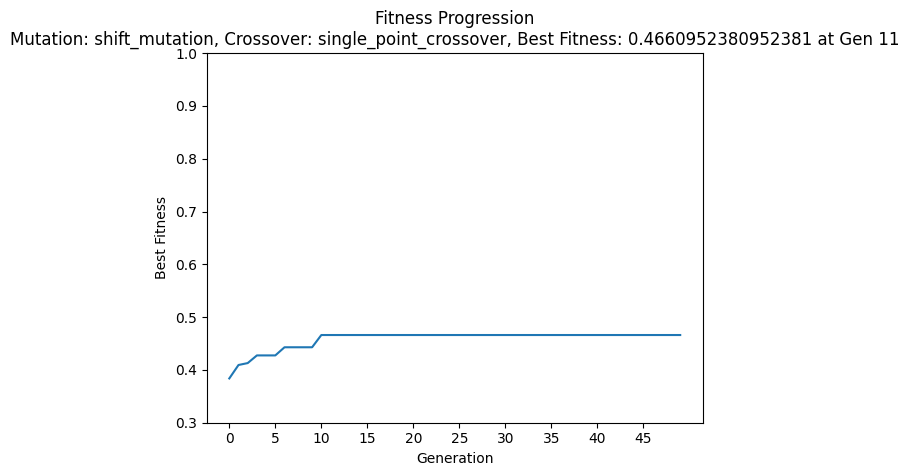

Best Fitness for this configuration: 0.4660952380952381 at Generation 11
Running GA with - Generations: 50, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.5, Elitism: True, Selection Method: tournament, Mutation: reassign_mutation, Crossover: uniform_crossover


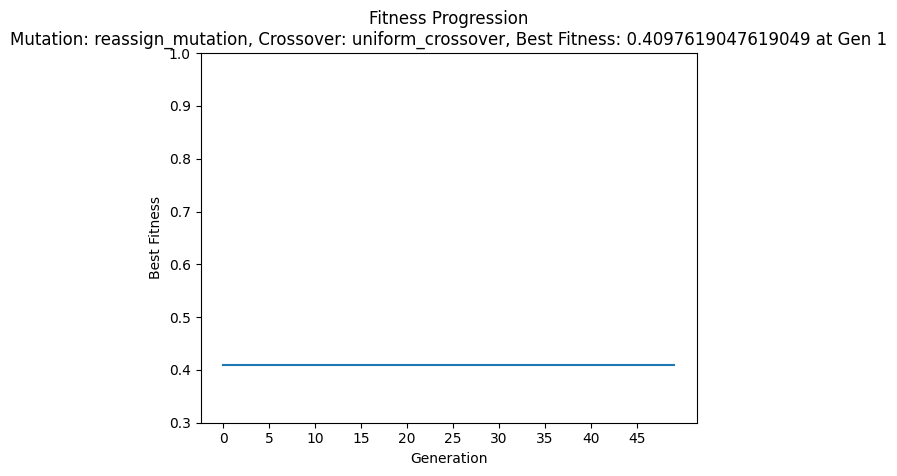

Best Fitness for this configuration: 0.4097619047619049 at Generation 1
Running GA with - Generations: 50, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.5, Elitism: True, Selection Method: tournament, Mutation: reassign_mutation, Crossover: single_point_crossover


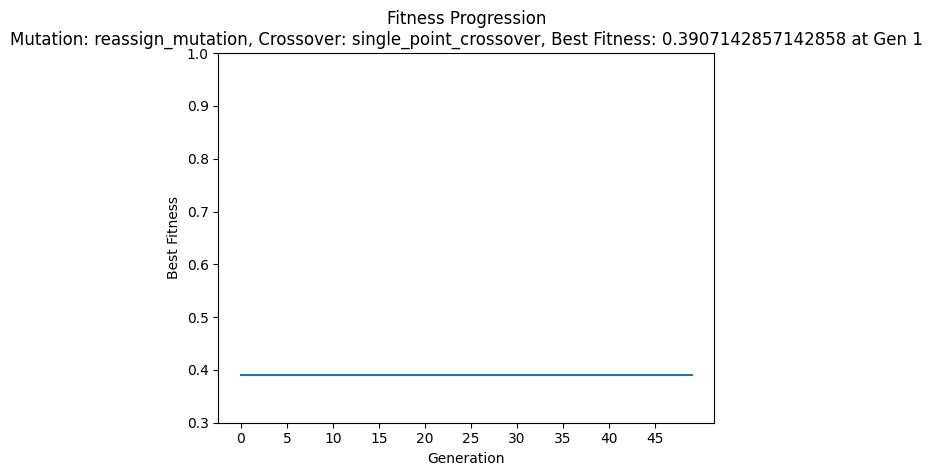

Best Fitness for this configuration: 0.3907142857142858 at Generation 1
Running GA with - Generations: 125, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.5, Elitism: True, Selection Method: tournament, Mutation: swap_mutation, Crossover: uniform_crossover


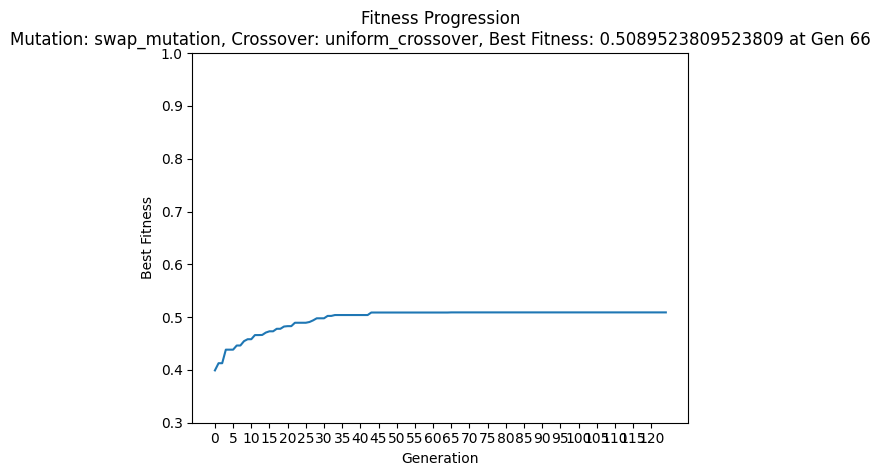

Best Fitness for this configuration: 0.5089523809523809 at Generation 66
Running GA with - Generations: 125, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.5, Elitism: True, Selection Method: tournament, Mutation: swap_mutation, Crossover: single_point_crossover


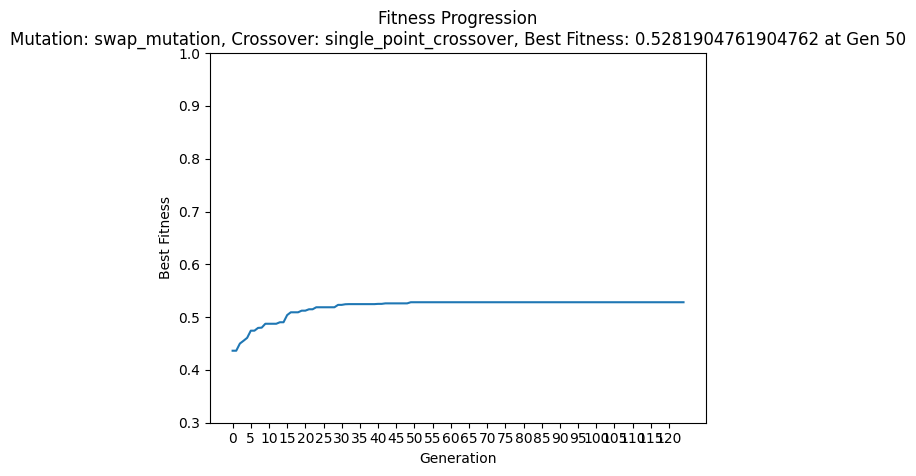

Best Fitness for this configuration: 0.5281904761904762 at Generation 50
Running GA with - Generations: 125, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.5, Elitism: True, Selection Method: tournament, Mutation: shift_mutation, Crossover: uniform_crossover


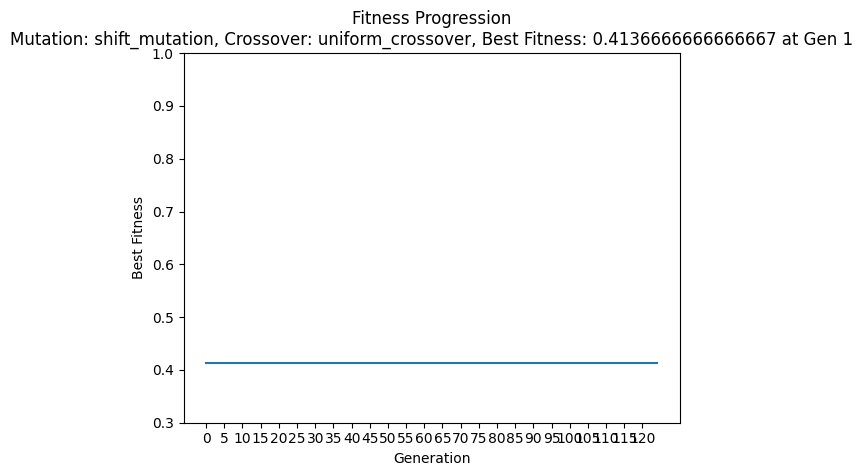

Best Fitness for this configuration: 0.4136666666666667 at Generation 1
Running GA with - Generations: 125, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.5, Elitism: True, Selection Method: tournament, Mutation: shift_mutation, Crossover: single_point_crossover


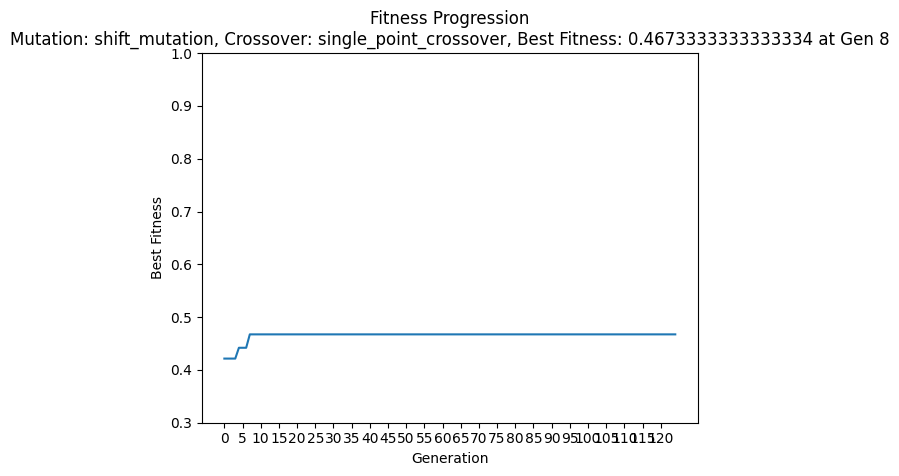

Best Fitness for this configuration: 0.4673333333333334 at Generation 8
Running GA with - Generations: 125, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.5, Elitism: True, Selection Method: tournament, Mutation: reassign_mutation, Crossover: uniform_crossover


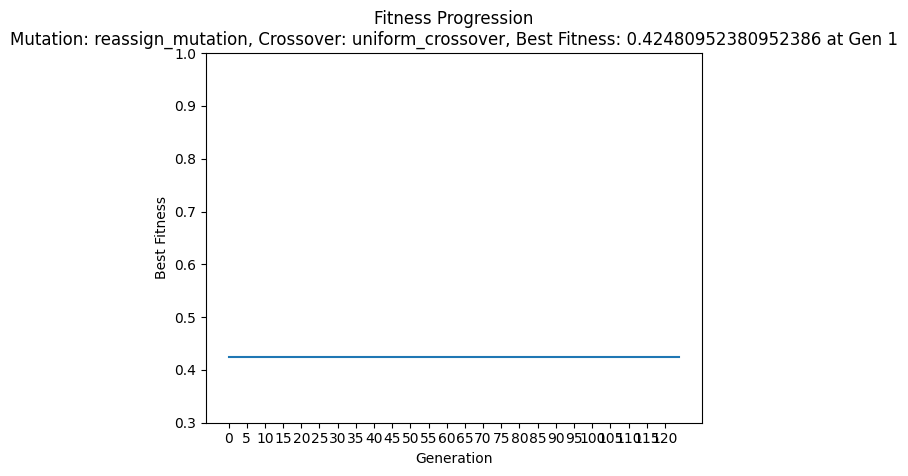

Best Fitness for this configuration: 0.42480952380952386 at Generation 1
Running GA with - Generations: 125, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.5, Elitism: True, Selection Method: tournament, Mutation: reassign_mutation, Crossover: single_point_crossover


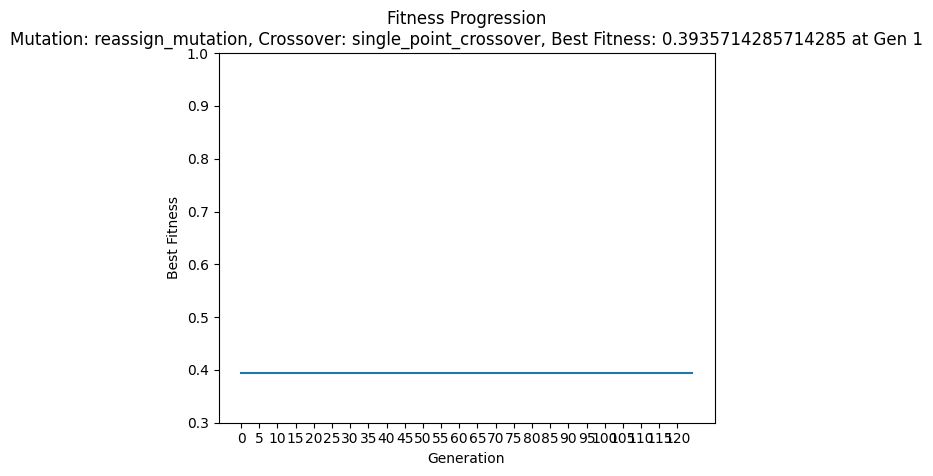

Best Fitness for this configuration: 0.3935714285714285 at Generation 1
Running GA with - Generations: 200, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.5, Elitism: True, Selection Method: tournament, Mutation: swap_mutation, Crossover: uniform_crossover


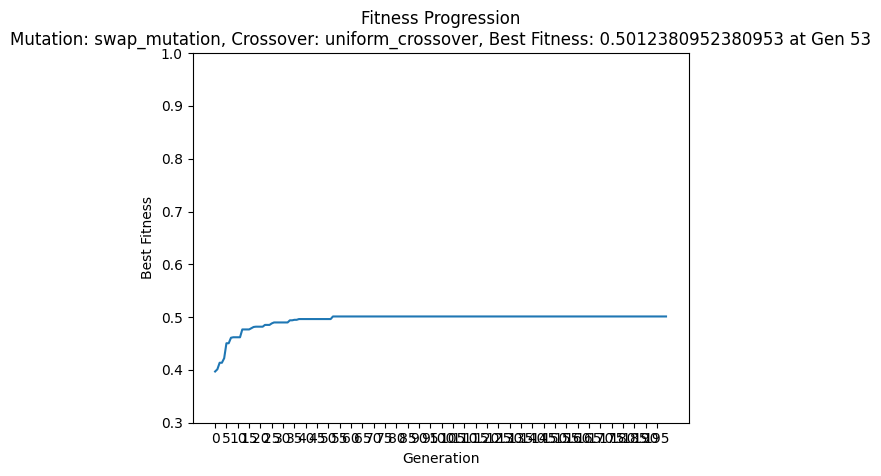

Best Fitness for this configuration: 0.5012380952380953 at Generation 53
Running GA with - Generations: 200, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.5, Elitism: True, Selection Method: tournament, Mutation: swap_mutation, Crossover: single_point_crossover


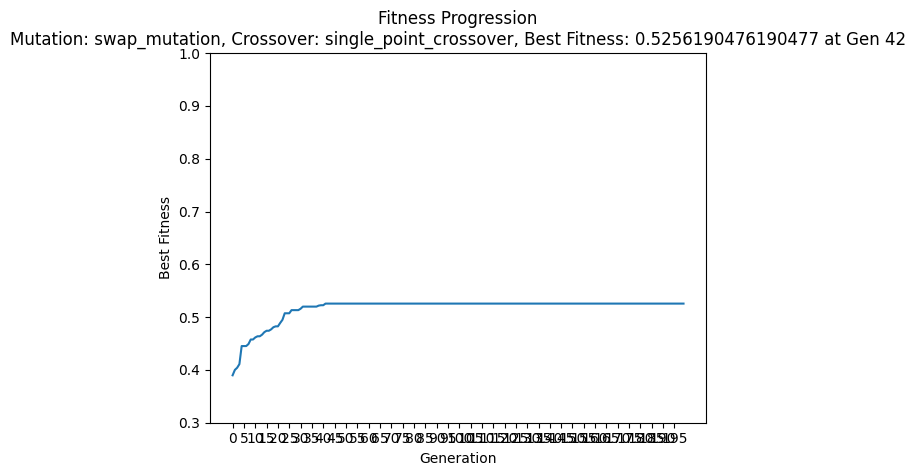

Best Fitness for this configuration: 0.5256190476190477 at Generation 42
Running GA with - Generations: 200, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.5, Elitism: True, Selection Method: tournament, Mutation: shift_mutation, Crossover: uniform_crossover


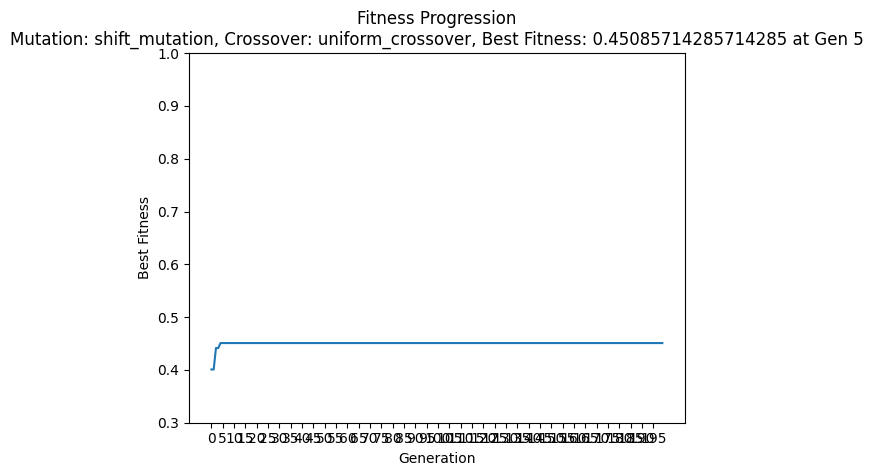

Best Fitness for this configuration: 0.45085714285714285 at Generation 5
Running GA with - Generations: 200, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.5, Elitism: True, Selection Method: tournament, Mutation: shift_mutation, Crossover: single_point_crossover


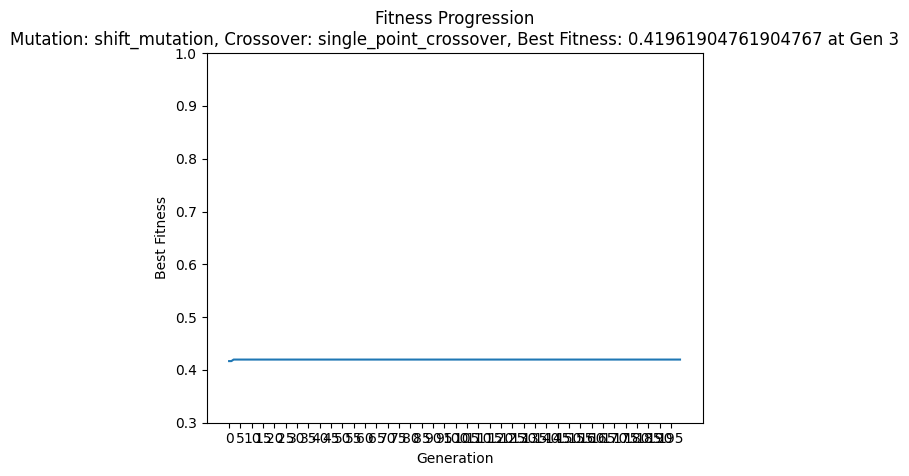

Best Fitness for this configuration: 0.41961904761904767 at Generation 3
Running GA with - Generations: 200, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.5, Elitism: True, Selection Method: tournament, Mutation: reassign_mutation, Crossover: uniform_crossover


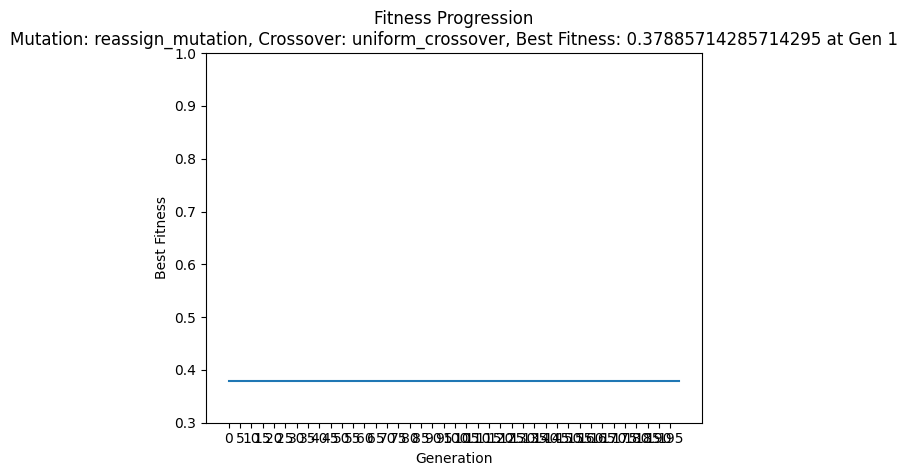

Best Fitness for this configuration: 0.37885714285714295 at Generation 1
Running GA with - Generations: 200, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.5, Elitism: True, Selection Method: tournament, Mutation: reassign_mutation, Crossover: single_point_crossover


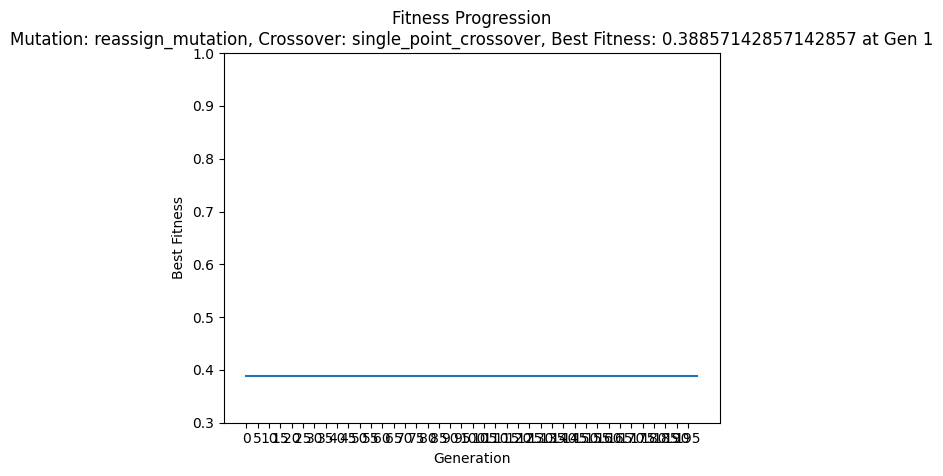

Best Fitness for this configuration: 0.38857142857142857 at Generation 1
Running GA with - Generations: 50, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.5, Elitism: True, Selection Method: roulette, Mutation: swap_mutation, Crossover: uniform_crossover


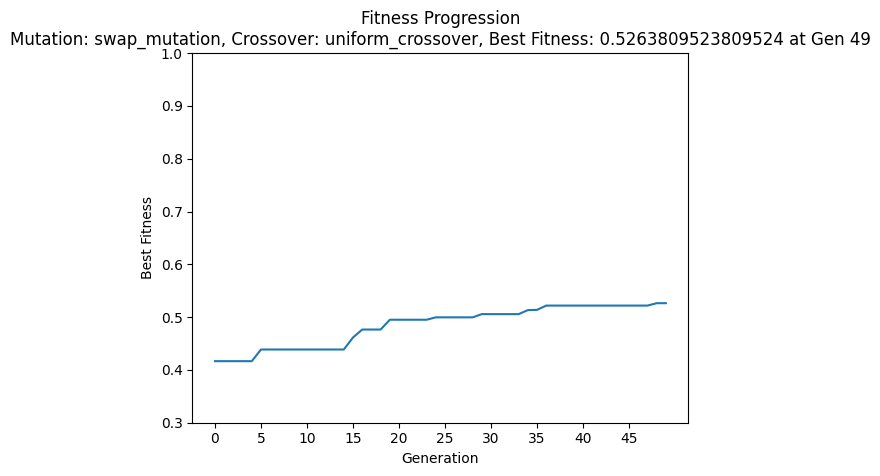

Best Fitness for this configuration: 0.5263809523809524 at Generation 49
Running GA with - Generations: 50, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.5, Elitism: True, Selection Method: roulette, Mutation: swap_mutation, Crossover: single_point_crossover


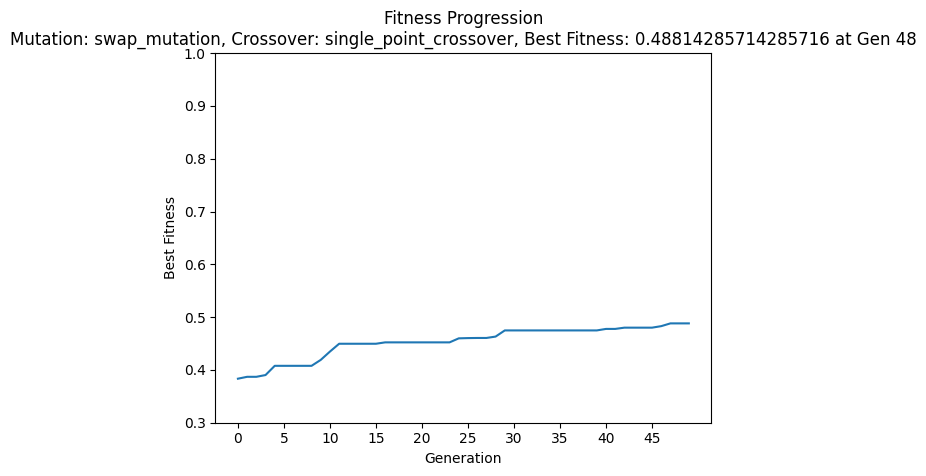

Best Fitness for this configuration: 0.48814285714285716 at Generation 48
Running GA with - Generations: 50, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.5, Elitism: True, Selection Method: roulette, Mutation: shift_mutation, Crossover: uniform_crossover


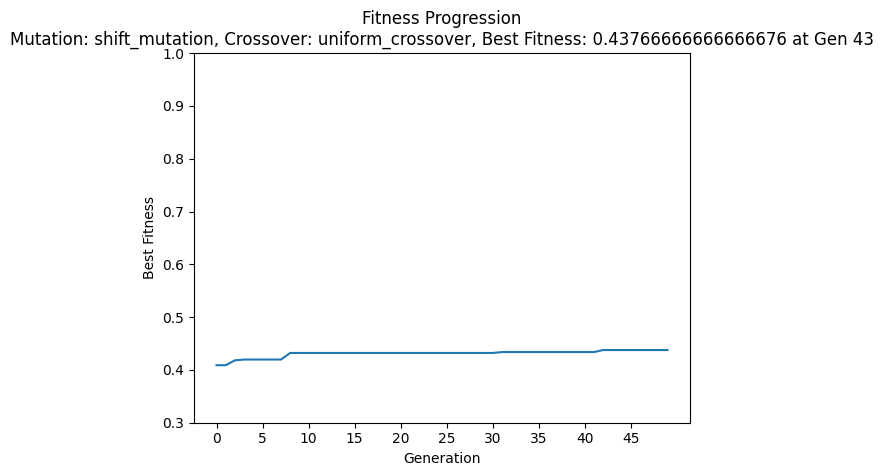

Best Fitness for this configuration: 0.43766666666666676 at Generation 43
Running GA with - Generations: 50, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.5, Elitism: True, Selection Method: roulette, Mutation: shift_mutation, Crossover: single_point_crossover


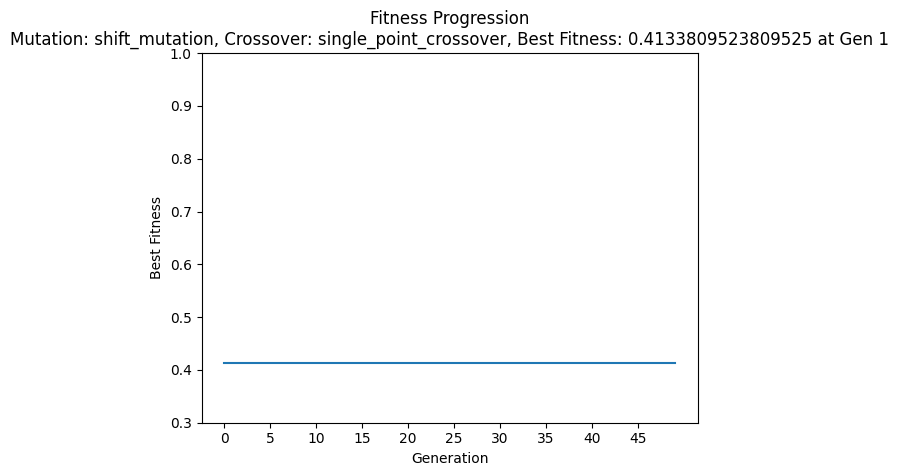

Best Fitness for this configuration: 0.4133809523809525 at Generation 1
Running GA with - Generations: 50, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.5, Elitism: True, Selection Method: roulette, Mutation: reassign_mutation, Crossover: uniform_crossover


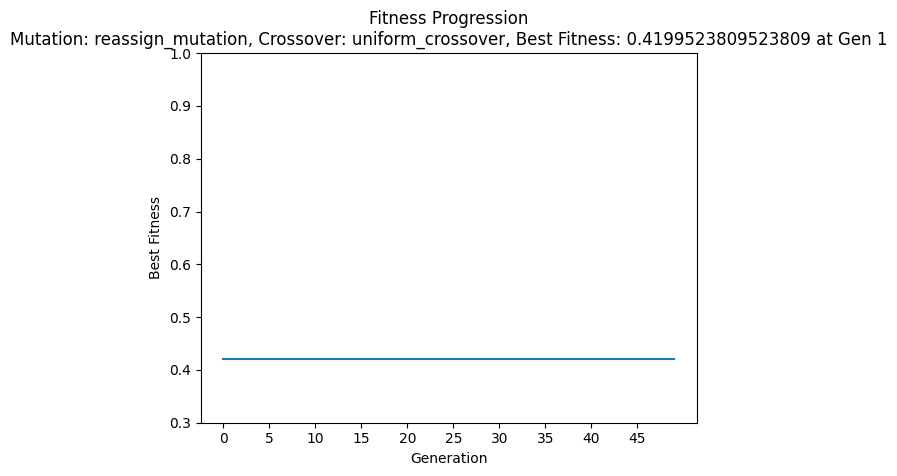

Best Fitness for this configuration: 0.4199523809523809 at Generation 1
Running GA with - Generations: 50, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.5, Elitism: True, Selection Method: roulette, Mutation: reassign_mutation, Crossover: single_point_crossover


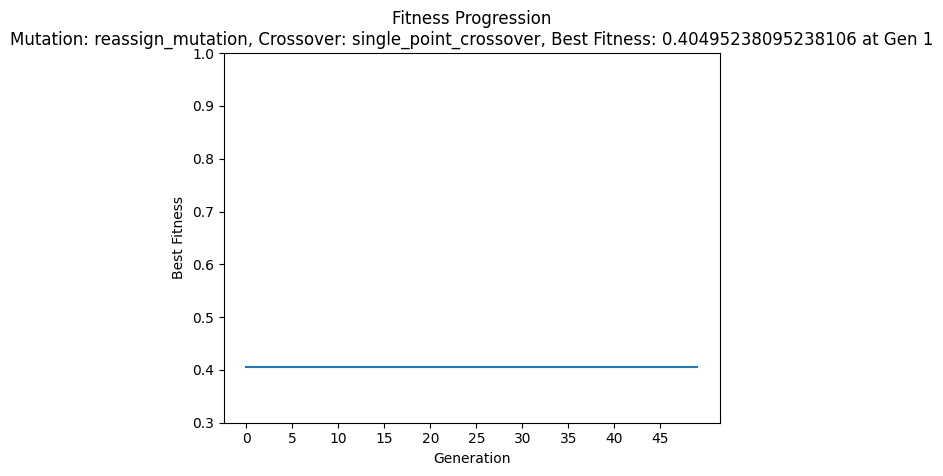

Best Fitness for this configuration: 0.40495238095238106 at Generation 1
Running GA with - Generations: 125, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.5, Elitism: True, Selection Method: roulette, Mutation: swap_mutation, Crossover: uniform_crossover


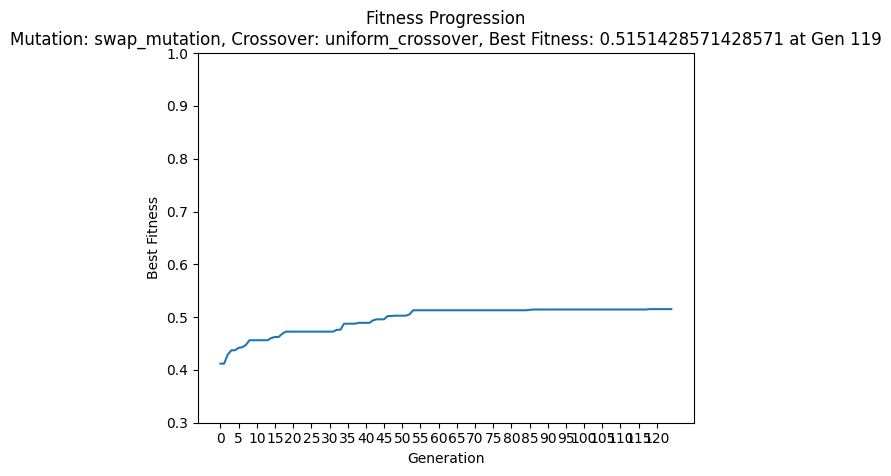

Best Fitness for this configuration: 0.5151428571428571 at Generation 119
Running GA with - Generations: 125, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.5, Elitism: True, Selection Method: roulette, Mutation: swap_mutation, Crossover: single_point_crossover


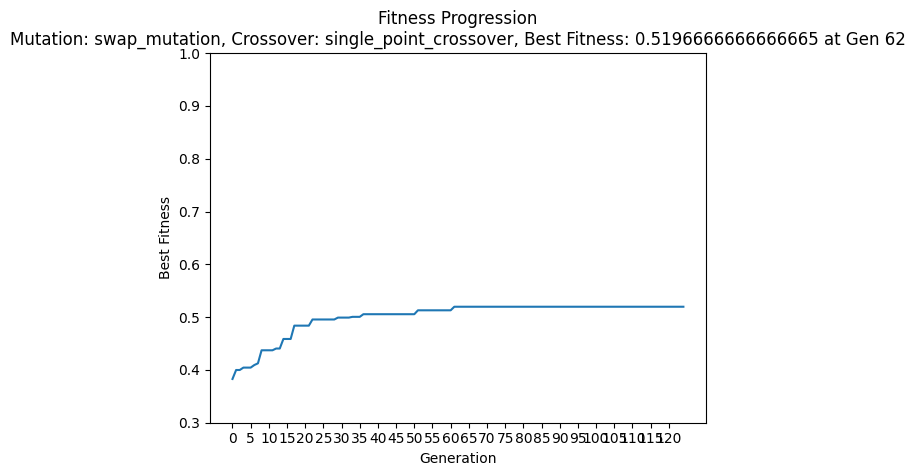

Best Fitness for this configuration: 0.5196666666666665 at Generation 62
Running GA with - Generations: 125, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.5, Elitism: True, Selection Method: roulette, Mutation: shift_mutation, Crossover: uniform_crossover


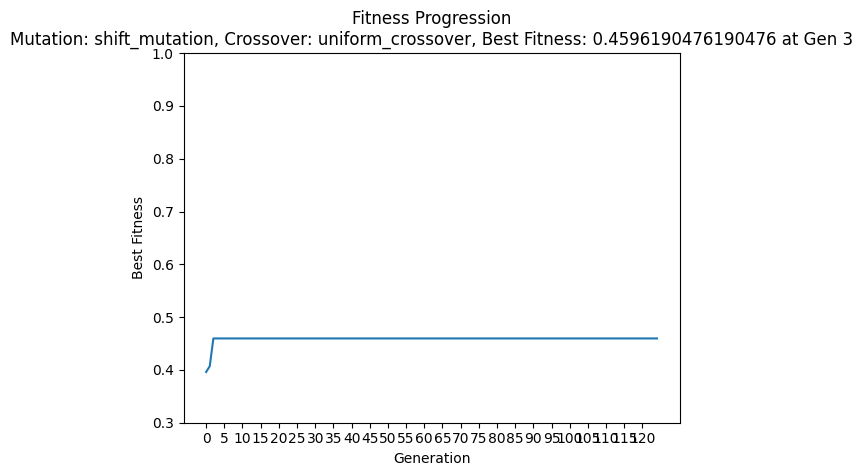

Best Fitness for this configuration: 0.4596190476190476 at Generation 3
Running GA with - Generations: 125, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.5, Elitism: True, Selection Method: roulette, Mutation: shift_mutation, Crossover: single_point_crossover


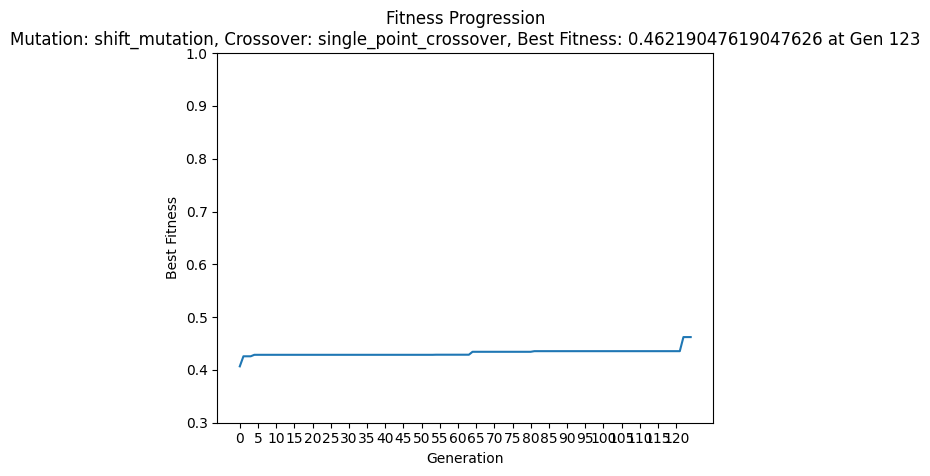

Best Fitness for this configuration: 0.46219047619047626 at Generation 123
Running GA with - Generations: 125, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.5, Elitism: True, Selection Method: roulette, Mutation: reassign_mutation, Crossover: uniform_crossover


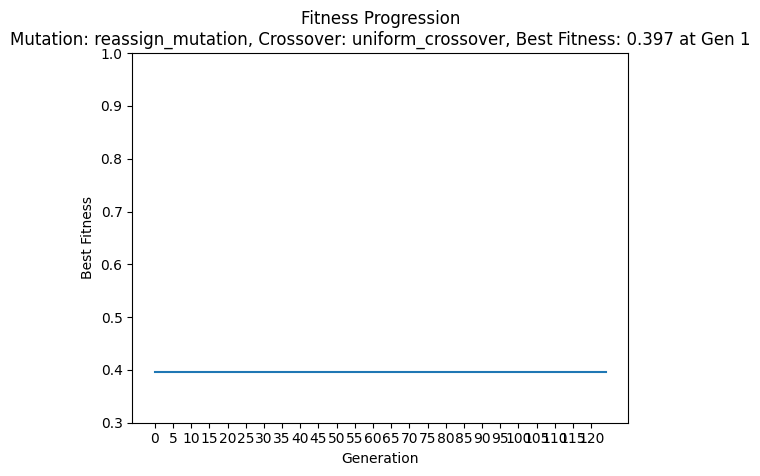

Best Fitness for this configuration: 0.397 at Generation 1
Running GA with - Generations: 125, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.5, Elitism: True, Selection Method: roulette, Mutation: reassign_mutation, Crossover: single_point_crossover


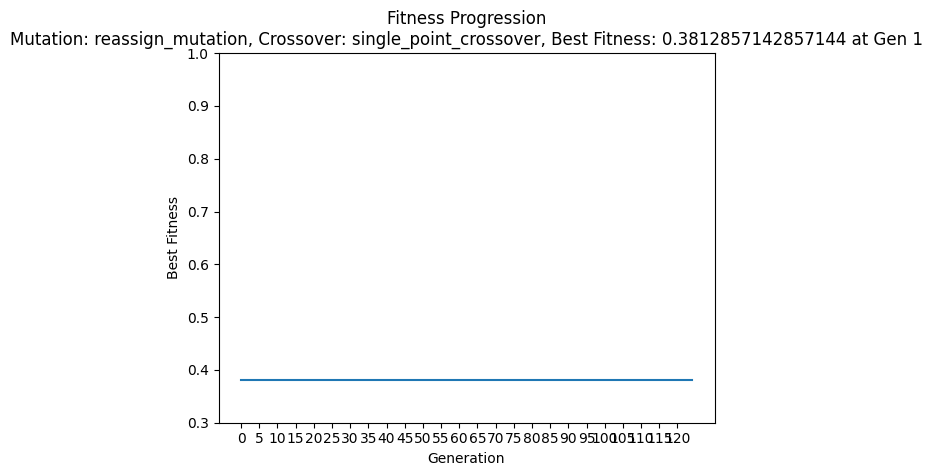

Best Fitness for this configuration: 0.3812857142857144 at Generation 1
Running GA with - Generations: 200, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.5, Elitism: True, Selection Method: roulette, Mutation: swap_mutation, Crossover: uniform_crossover


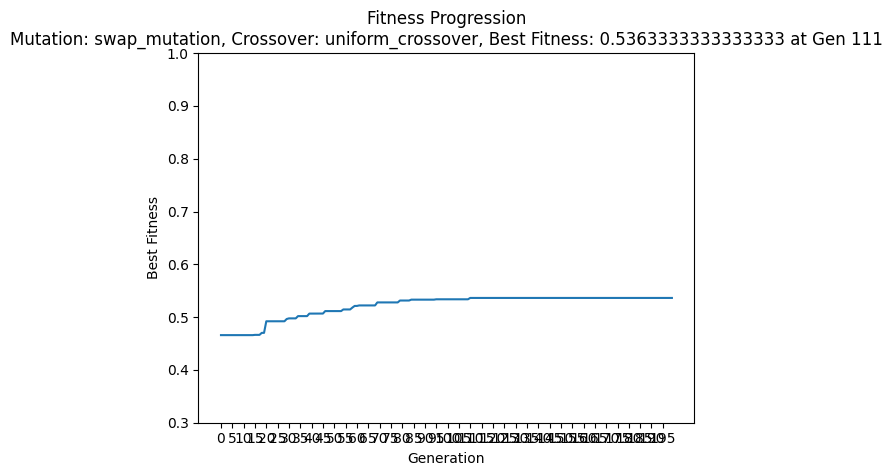

Best Fitness for this configuration: 0.5363333333333333 at Generation 111
Running GA with - Generations: 200, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.5, Elitism: True, Selection Method: roulette, Mutation: swap_mutation, Crossover: single_point_crossover


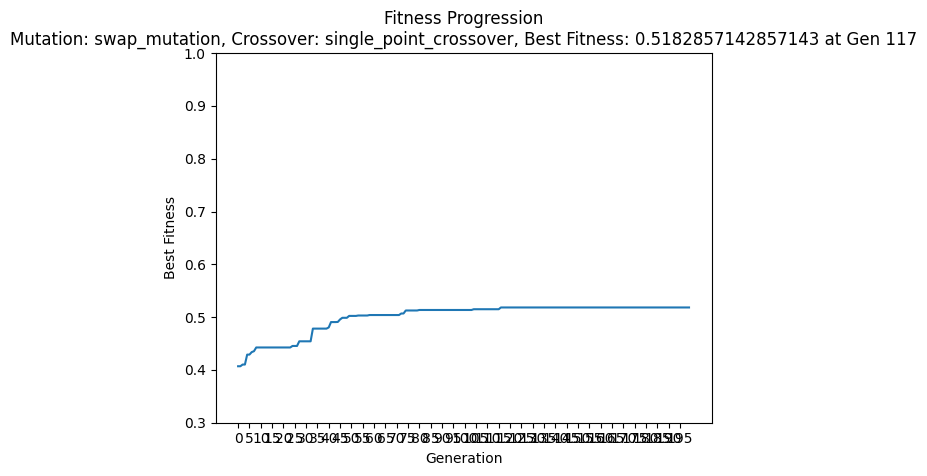

Best Fitness for this configuration: 0.5182857142857143 at Generation 117
Running GA with - Generations: 200, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.5, Elitism: True, Selection Method: roulette, Mutation: shift_mutation, Crossover: uniform_crossover


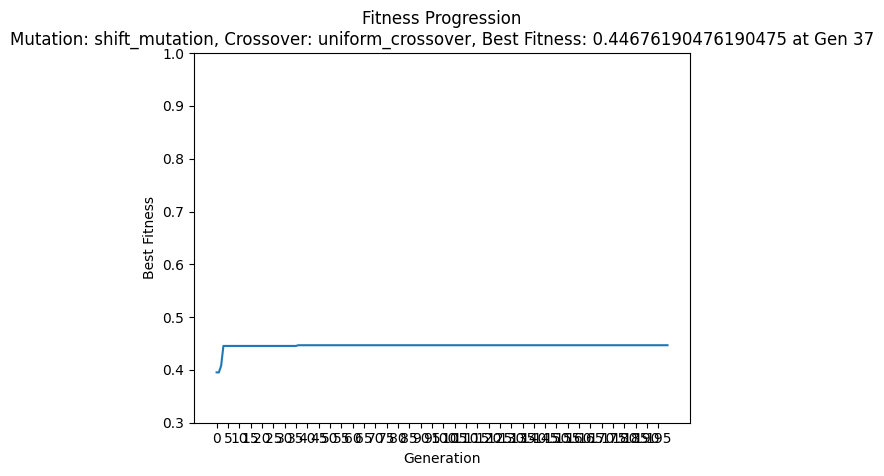

Best Fitness for this configuration: 0.44676190476190475 at Generation 37
Running GA with - Generations: 200, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.5, Elitism: True, Selection Method: roulette, Mutation: shift_mutation, Crossover: single_point_crossover


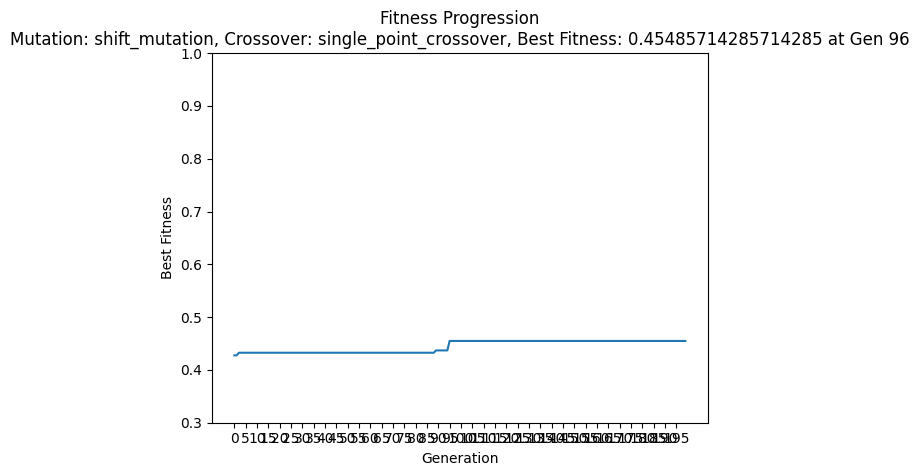

Best Fitness for this configuration: 0.45485714285714285 at Generation 96
Running GA with - Generations: 200, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.5, Elitism: True, Selection Method: roulette, Mutation: reassign_mutation, Crossover: uniform_crossover


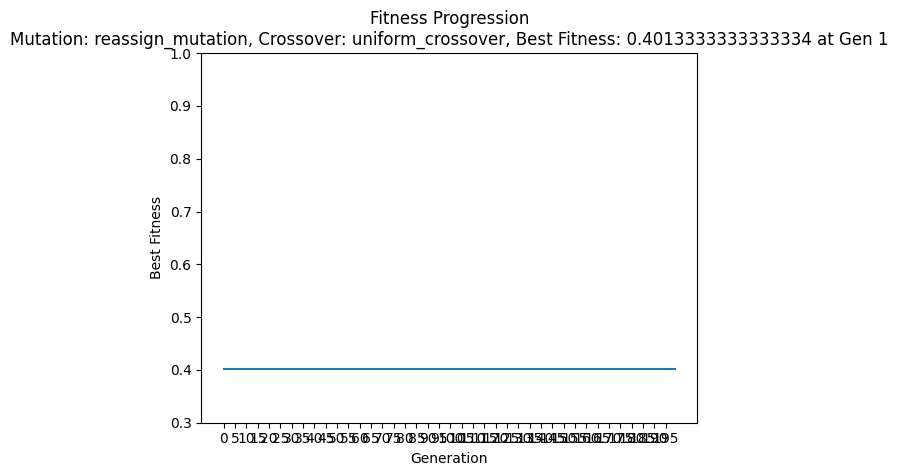

Best Fitness for this configuration: 0.4013333333333334 at Generation 1
Running GA with - Generations: 200, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.5, Elitism: True, Selection Method: roulette, Mutation: reassign_mutation, Crossover: single_point_crossover


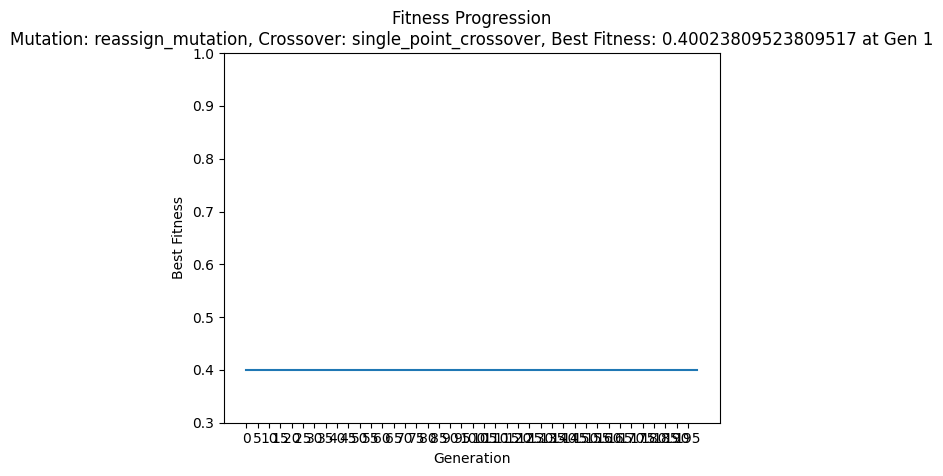

Best Fitness for this configuration: 0.40023809523809517 at Generation 1
Running GA with - Generations: 50, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.5, Elitism: False, Selection Method: tournament, Mutation: swap_mutation, Crossover: uniform_crossover


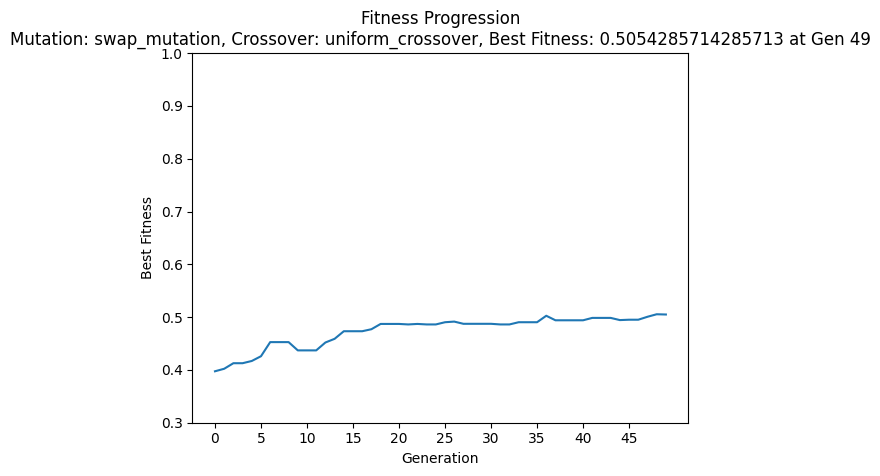

Best Fitness for this configuration: 0.5054285714285713 at Generation 49
Running GA with - Generations: 50, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.5, Elitism: False, Selection Method: tournament, Mutation: swap_mutation, Crossover: single_point_crossover


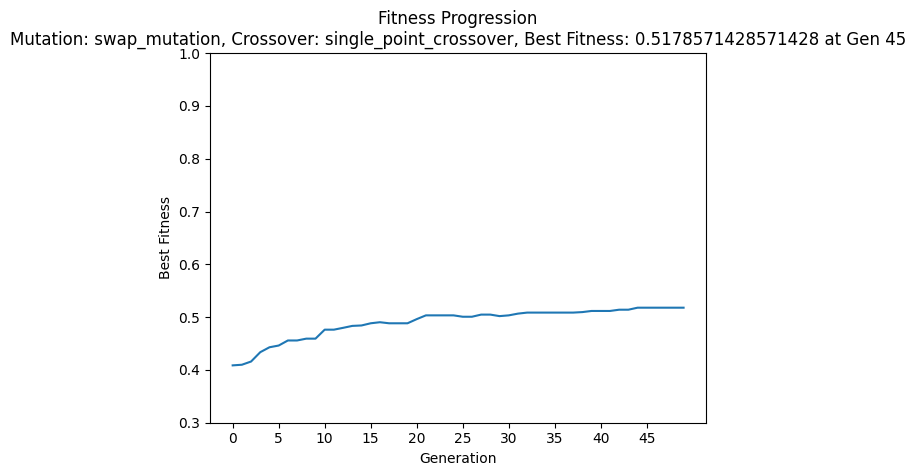

Best Fitness for this configuration: 0.5178571428571428 at Generation 45
Running GA with - Generations: 50, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.5, Elitism: False, Selection Method: tournament, Mutation: shift_mutation, Crossover: uniform_crossover


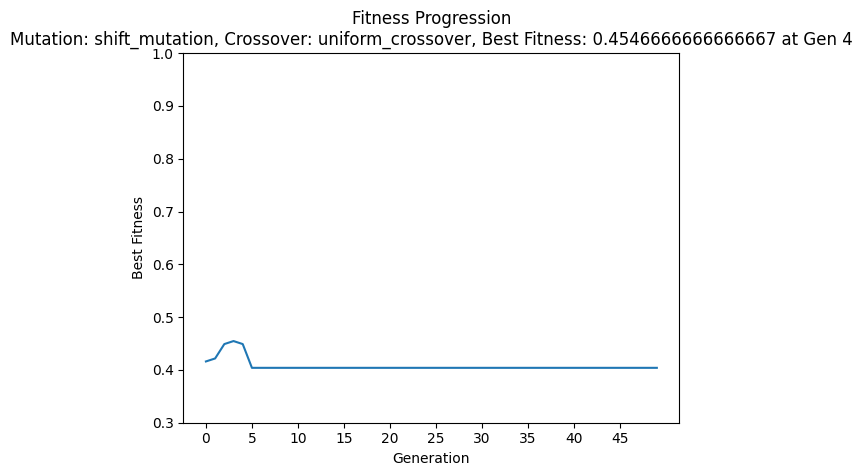

Best Fitness for this configuration: 0.4546666666666667 at Generation 4
Running GA with - Generations: 50, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.5, Elitism: False, Selection Method: tournament, Mutation: shift_mutation, Crossover: single_point_crossover


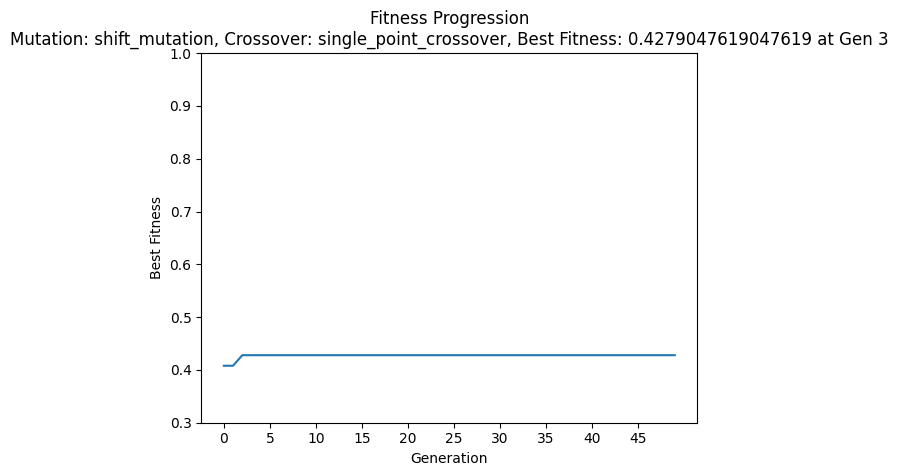

Best Fitness for this configuration: 0.4279047619047619 at Generation 3
Running GA with - Generations: 50, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.5, Elitism: False, Selection Method: tournament, Mutation: reassign_mutation, Crossover: uniform_crossover


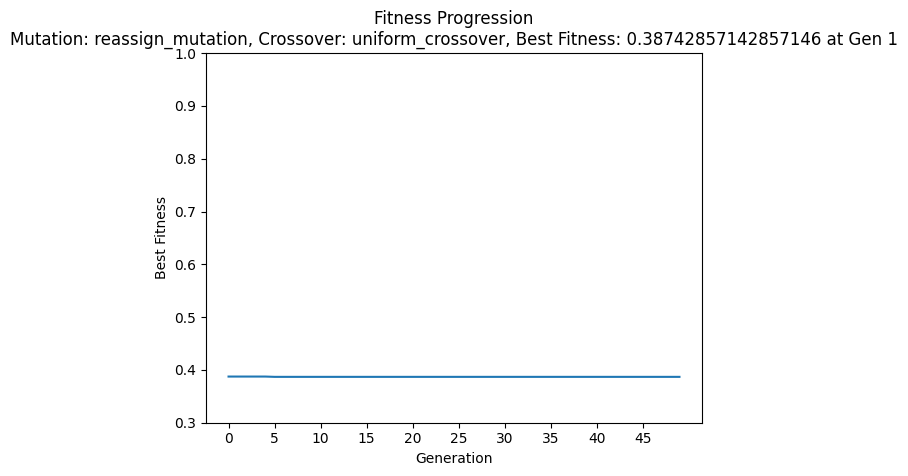

Best Fitness for this configuration: 0.38742857142857146 at Generation 1
Running GA with - Generations: 50, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.5, Elitism: False, Selection Method: tournament, Mutation: reassign_mutation, Crossover: single_point_crossover


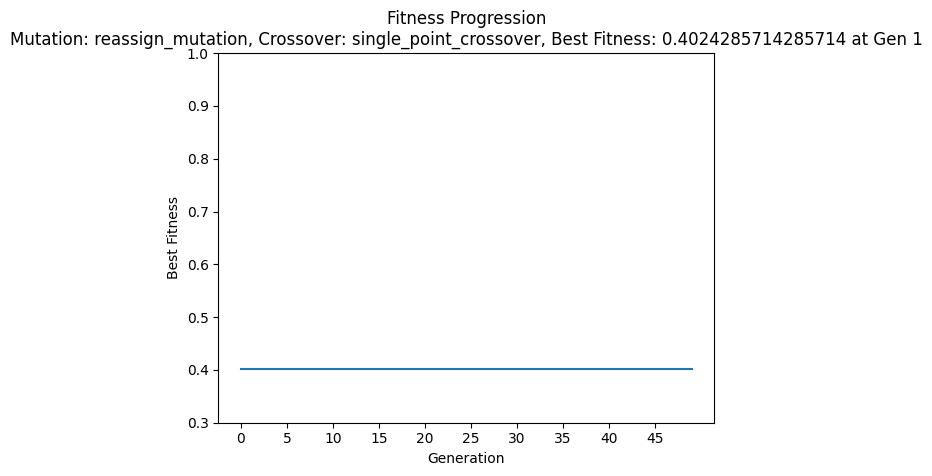

Best Fitness for this configuration: 0.4024285714285714 at Generation 1
Running GA with - Generations: 125, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.5, Elitism: False, Selection Method: tournament, Mutation: swap_mutation, Crossover: uniform_crossover


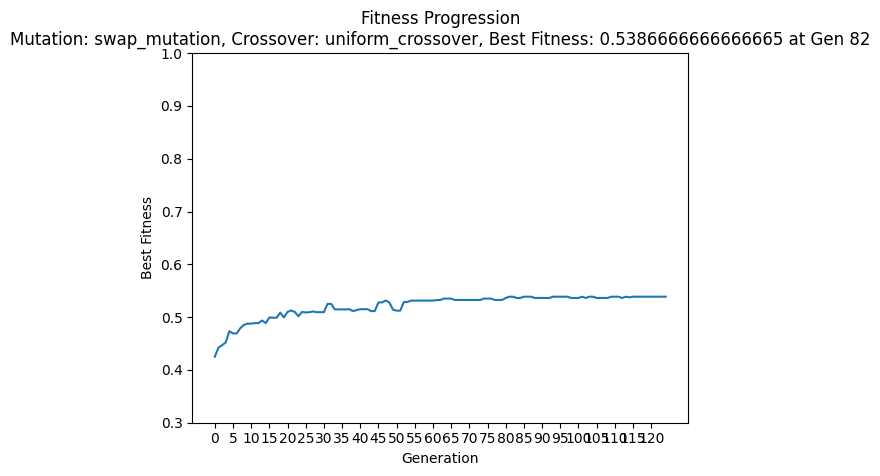

Best Fitness for this configuration: 0.5386666666666665 at Generation 82
Running GA with - Generations: 125, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.5, Elitism: False, Selection Method: tournament, Mutation: swap_mutation, Crossover: single_point_crossover


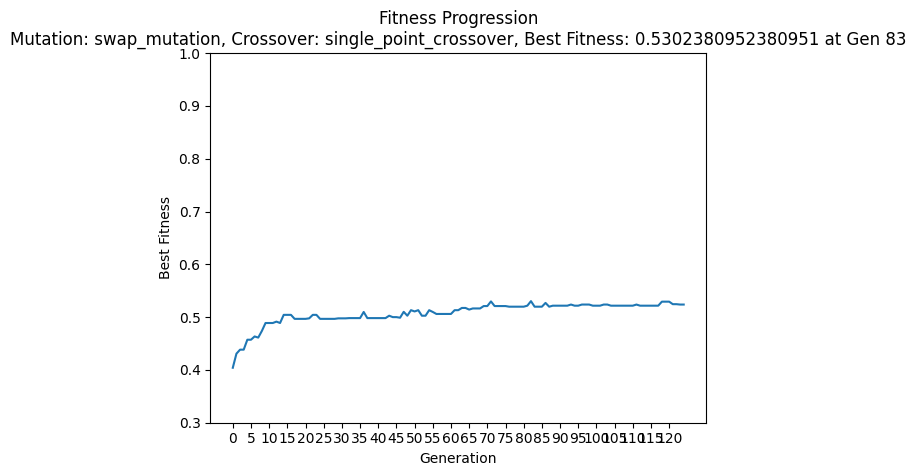

Best Fitness for this configuration: 0.5302380952380951 at Generation 83
Running GA with - Generations: 125, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.5, Elitism: False, Selection Method: tournament, Mutation: shift_mutation, Crossover: uniform_crossover


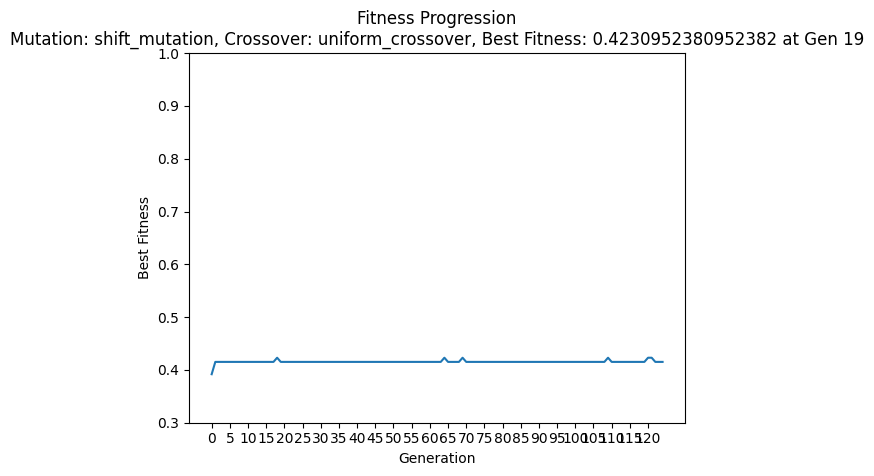

Best Fitness for this configuration: 0.4230952380952382 at Generation 19
Running GA with - Generations: 125, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.5, Elitism: False, Selection Method: tournament, Mutation: shift_mutation, Crossover: single_point_crossover


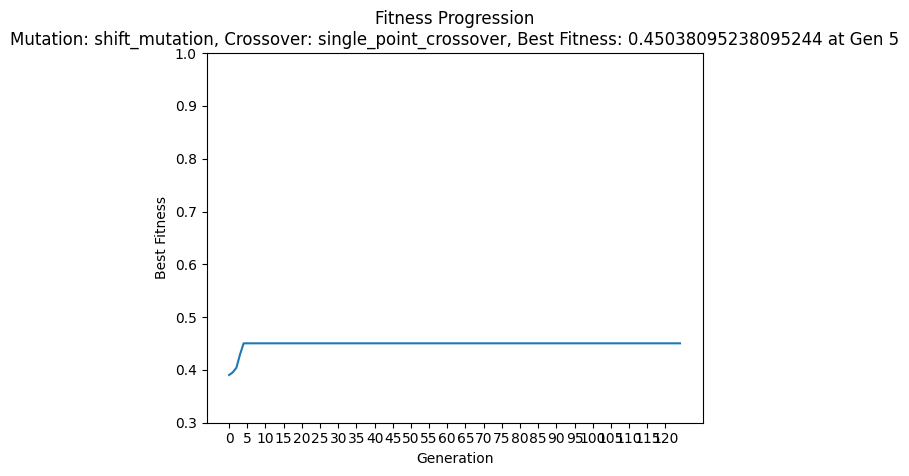

Best Fitness for this configuration: 0.45038095238095244 at Generation 5
Running GA with - Generations: 125, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.5, Elitism: False, Selection Method: tournament, Mutation: reassign_mutation, Crossover: uniform_crossover


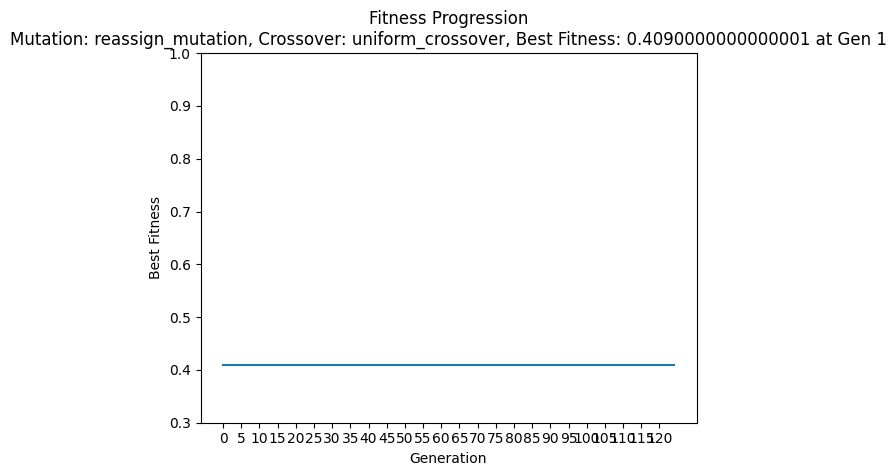

Best Fitness for this configuration: 0.4090000000000001 at Generation 1
Running GA with - Generations: 125, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.5, Elitism: False, Selection Method: tournament, Mutation: reassign_mutation, Crossover: single_point_crossover


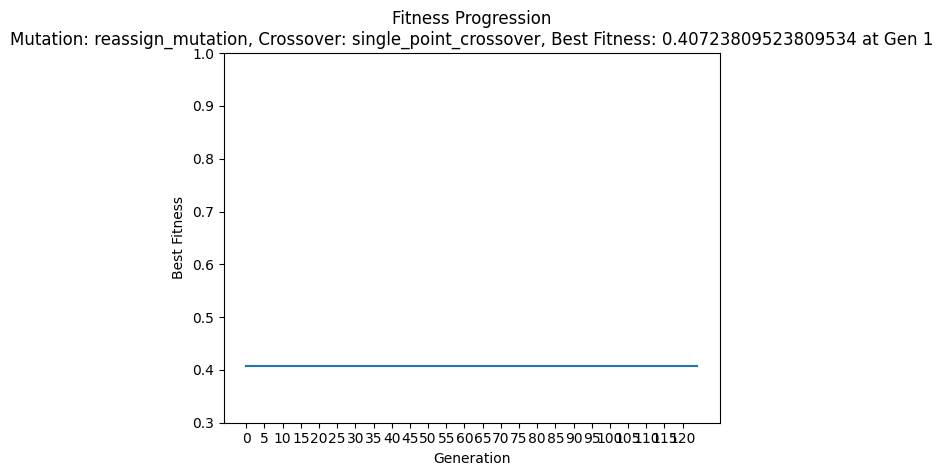

Best Fitness for this configuration: 0.40723809523809534 at Generation 1
Running GA with - Generations: 200, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.5, Elitism: False, Selection Method: tournament, Mutation: swap_mutation, Crossover: uniform_crossover


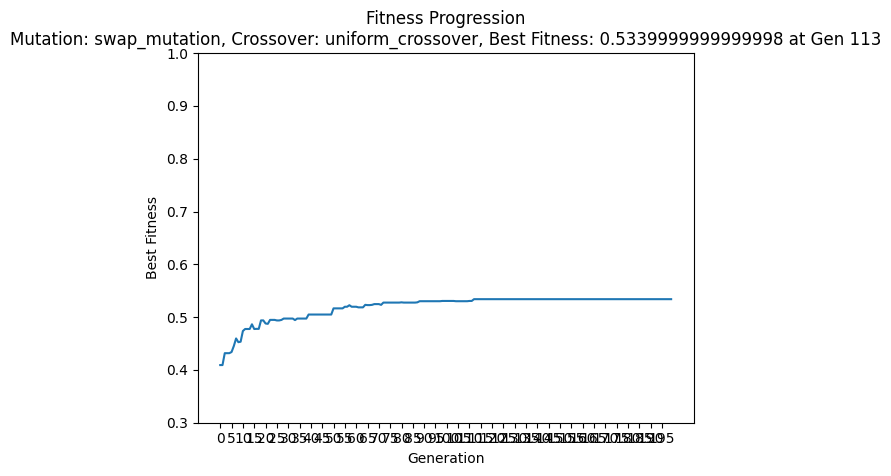

Best Fitness for this configuration: 0.5339999999999998 at Generation 113
Running GA with - Generations: 200, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.5, Elitism: False, Selection Method: tournament, Mutation: swap_mutation, Crossover: single_point_crossover


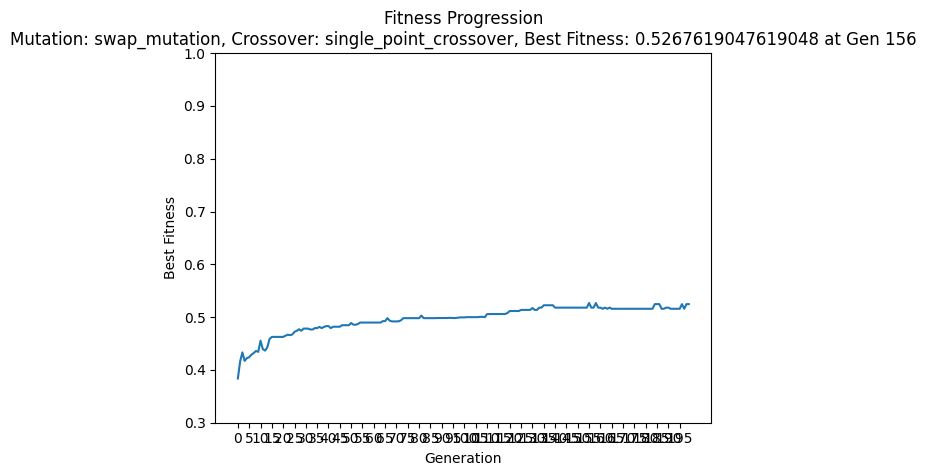

Best Fitness for this configuration: 0.5267619047619048 at Generation 156
Running GA with - Generations: 200, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.5, Elitism: False, Selection Method: tournament, Mutation: shift_mutation, Crossover: uniform_crossover


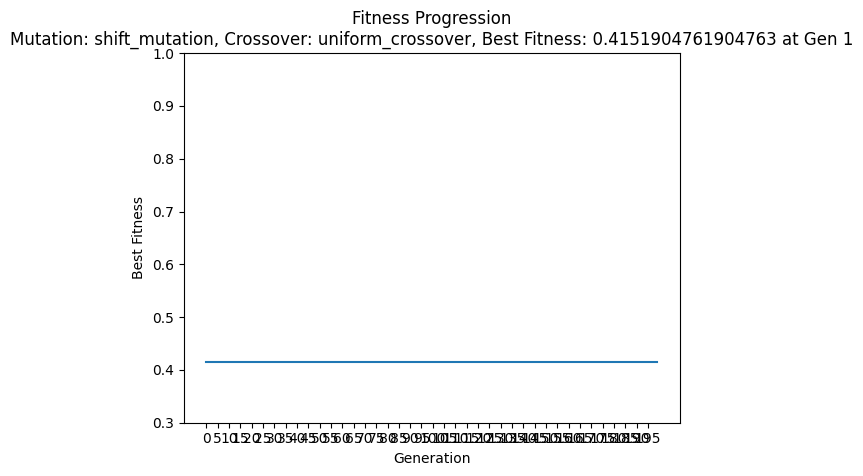

Best Fitness for this configuration: 0.4151904761904763 at Generation 1
Running GA with - Generations: 200, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.5, Elitism: False, Selection Method: tournament, Mutation: shift_mutation, Crossover: single_point_crossover


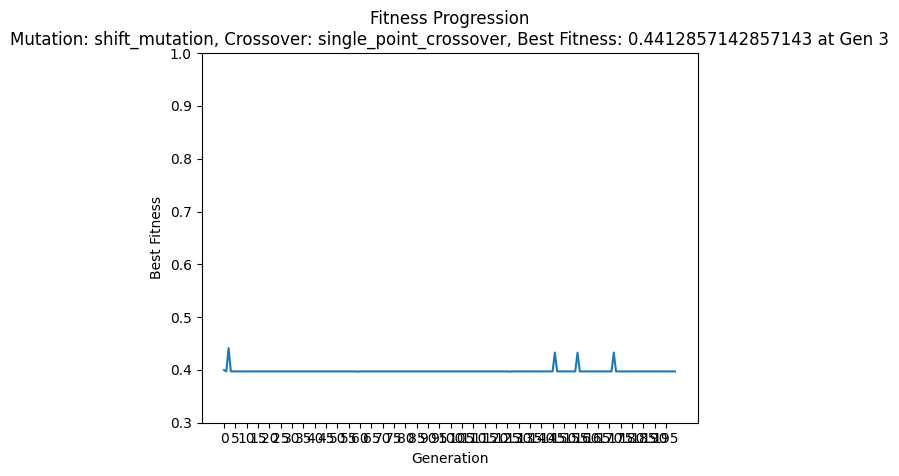

Best Fitness for this configuration: 0.4412857142857143 at Generation 3
Running GA with - Generations: 200, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.5, Elitism: False, Selection Method: tournament, Mutation: reassign_mutation, Crossover: uniform_crossover


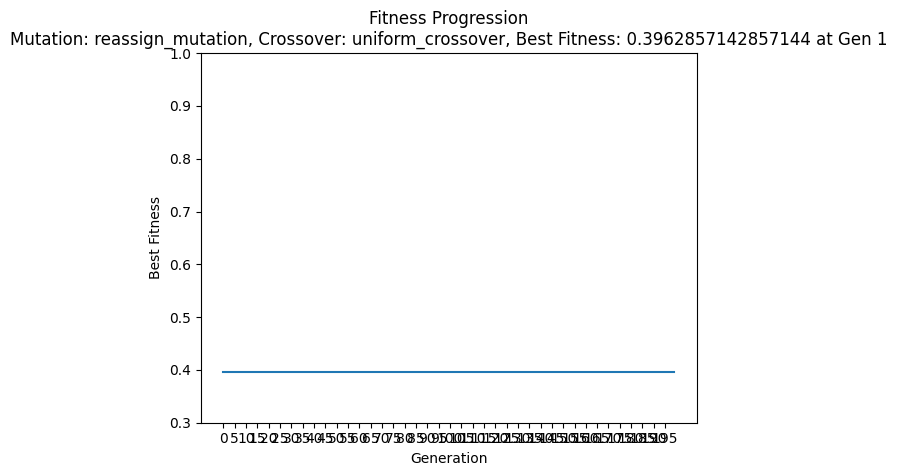

Best Fitness for this configuration: 0.3962857142857144 at Generation 1
Running GA with - Generations: 200, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.5, Elitism: False, Selection Method: tournament, Mutation: reassign_mutation, Crossover: single_point_crossover


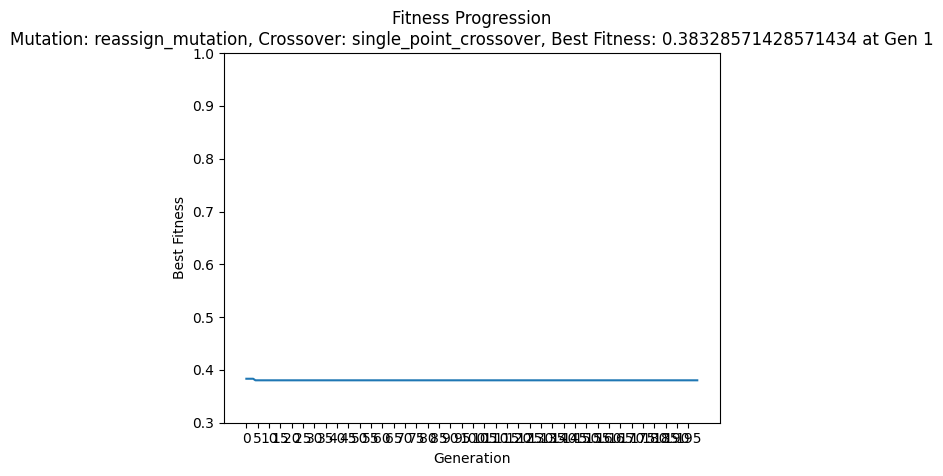

Best Fitness for this configuration: 0.38328571428571434 at Generation 1
Running GA with - Generations: 50, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.5, Elitism: False, Selection Method: roulette, Mutation: swap_mutation, Crossover: uniform_crossover


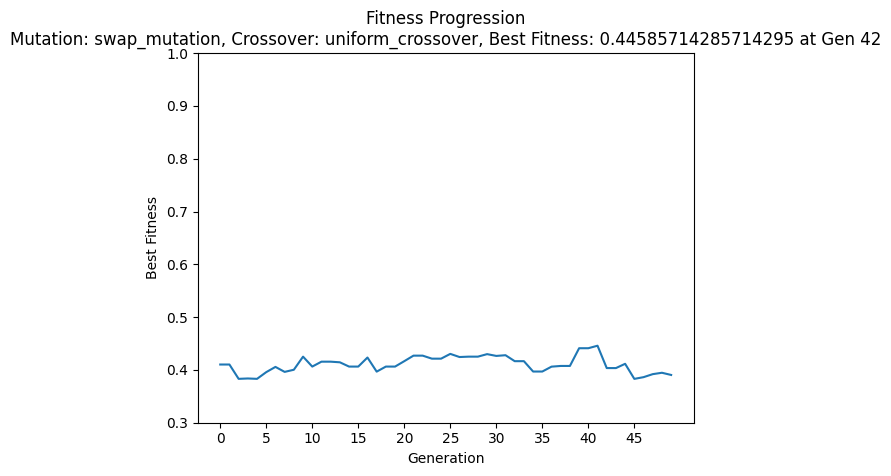

Best Fitness for this configuration: 0.44585714285714295 at Generation 42
Running GA with - Generations: 50, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.5, Elitism: False, Selection Method: roulette, Mutation: swap_mutation, Crossover: single_point_crossover


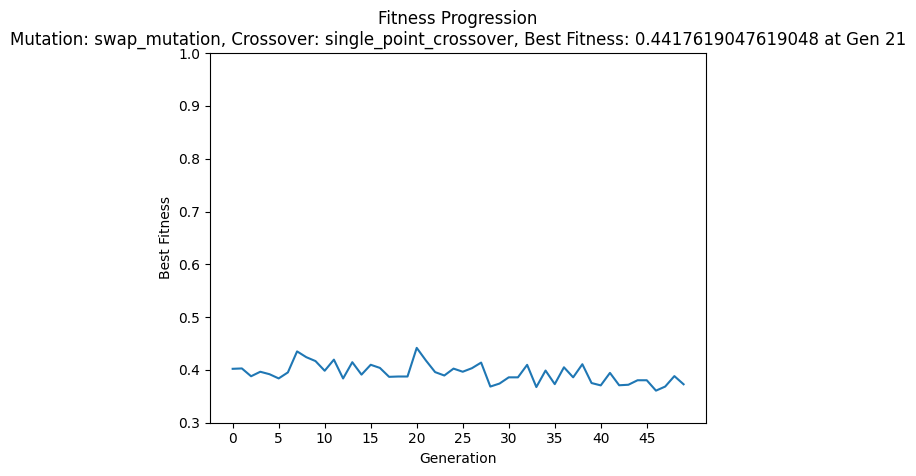

Best Fitness for this configuration: 0.4417619047619048 at Generation 21
Running GA with - Generations: 50, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.5, Elitism: False, Selection Method: roulette, Mutation: shift_mutation, Crossover: uniform_crossover


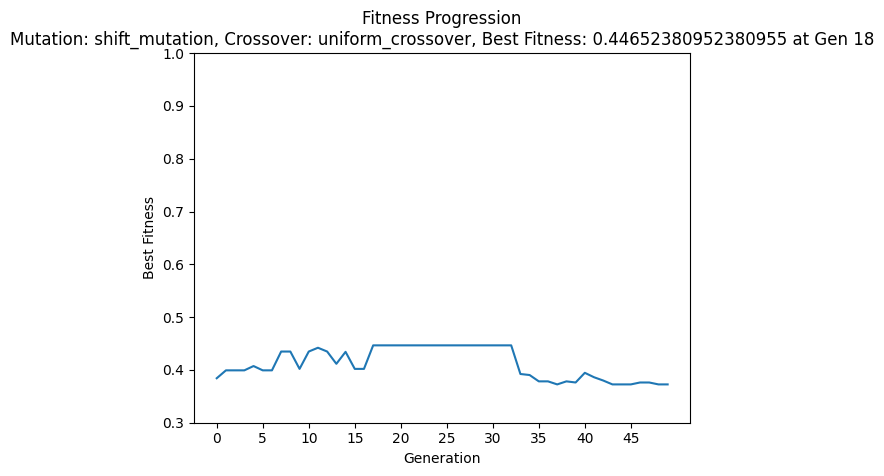

Best Fitness for this configuration: 0.44652380952380955 at Generation 18
Running GA with - Generations: 50, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.5, Elitism: False, Selection Method: roulette, Mutation: shift_mutation, Crossover: single_point_crossover


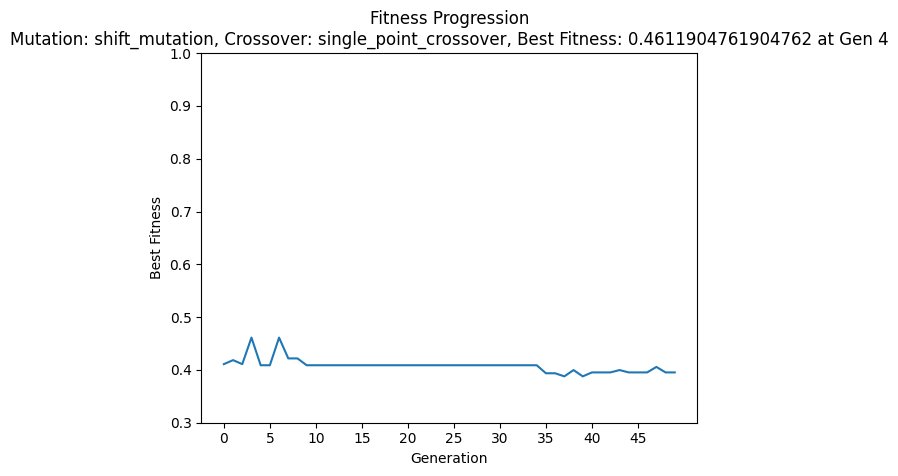

Best Fitness for this configuration: 0.4611904761904762 at Generation 4
Running GA with - Generations: 50, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.5, Elitism: False, Selection Method: roulette, Mutation: reassign_mutation, Crossover: uniform_crossover


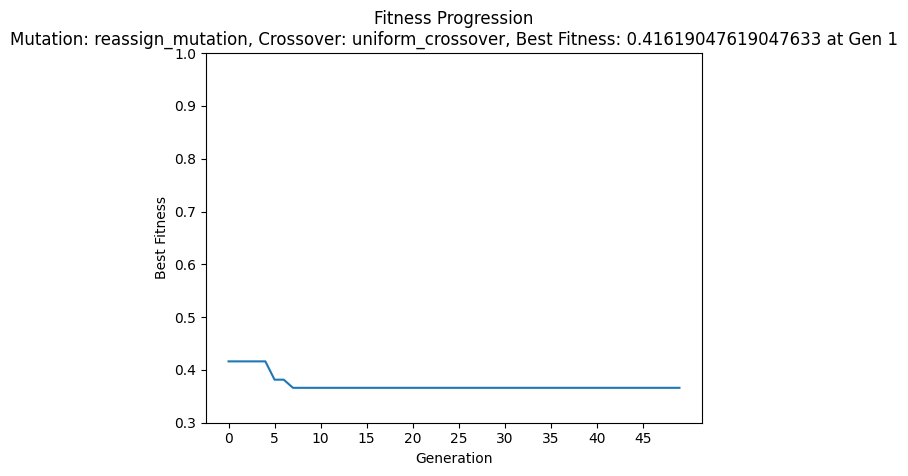

Best Fitness for this configuration: 0.41619047619047633 at Generation 1
Running GA with - Generations: 50, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.5, Elitism: False, Selection Method: roulette, Mutation: reassign_mutation, Crossover: single_point_crossover


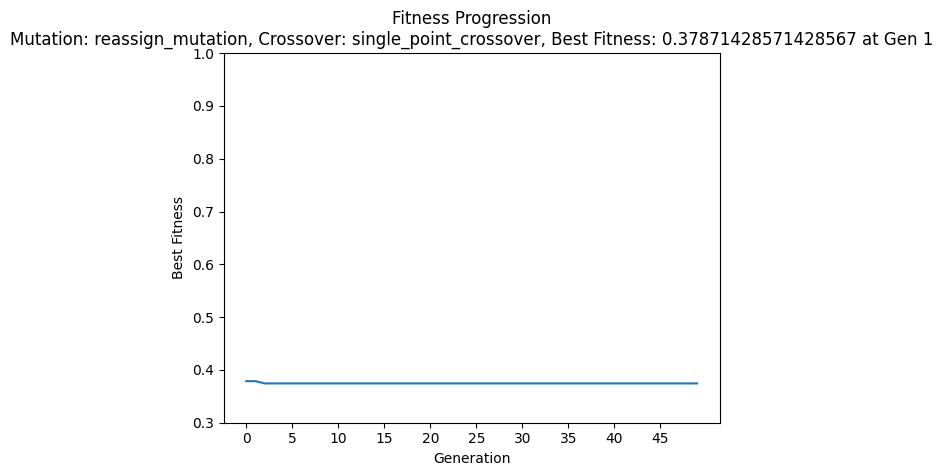

Best Fitness for this configuration: 0.37871428571428567 at Generation 1
Running GA with - Generations: 125, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.5, Elitism: False, Selection Method: roulette, Mutation: swap_mutation, Crossover: uniform_crossover


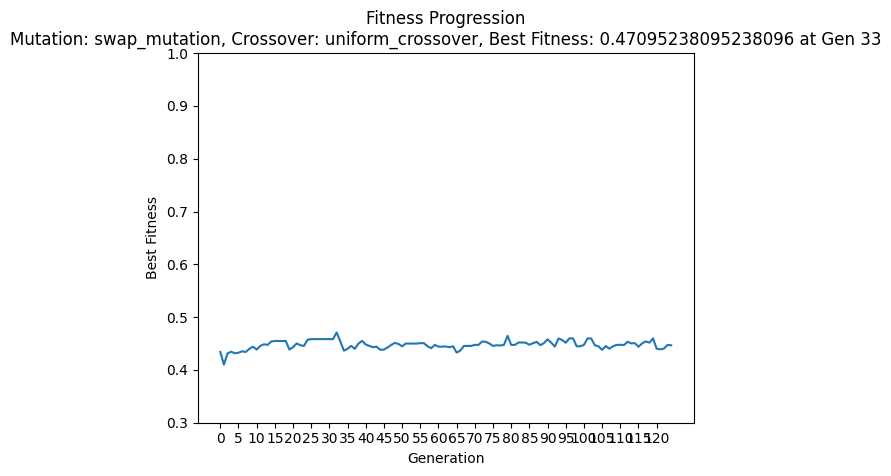

Best Fitness for this configuration: 0.47095238095238096 at Generation 33
Running GA with - Generations: 125, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.5, Elitism: False, Selection Method: roulette, Mutation: swap_mutation, Crossover: single_point_crossover


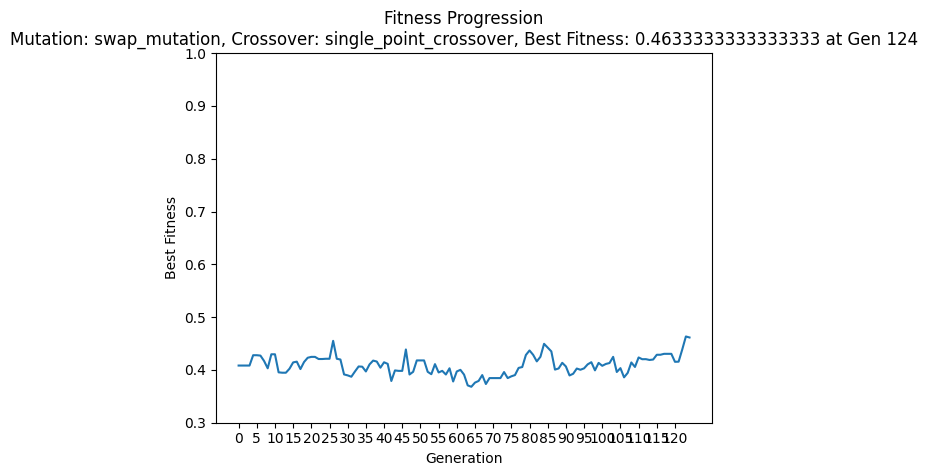

Best Fitness for this configuration: 0.4633333333333333 at Generation 124
Running GA with - Generations: 125, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.5, Elitism: False, Selection Method: roulette, Mutation: shift_mutation, Crossover: uniform_crossover


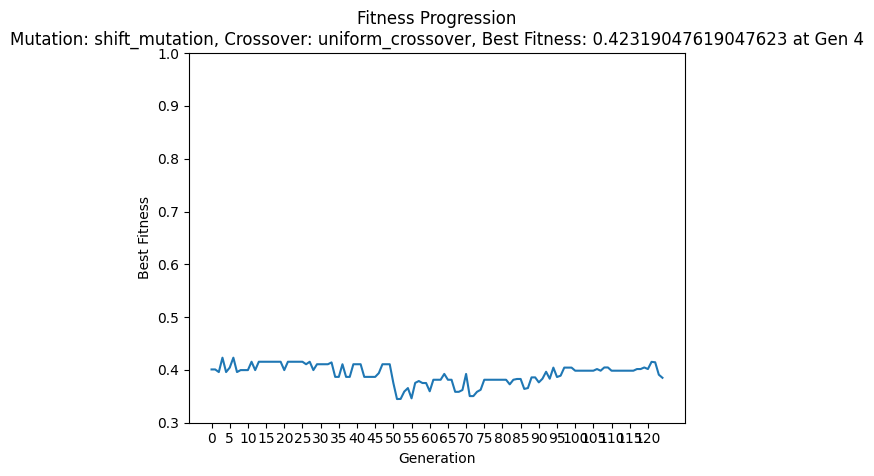

Best Fitness for this configuration: 0.42319047619047623 at Generation 4
Running GA with - Generations: 125, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.5, Elitism: False, Selection Method: roulette, Mutation: shift_mutation, Crossover: single_point_crossover


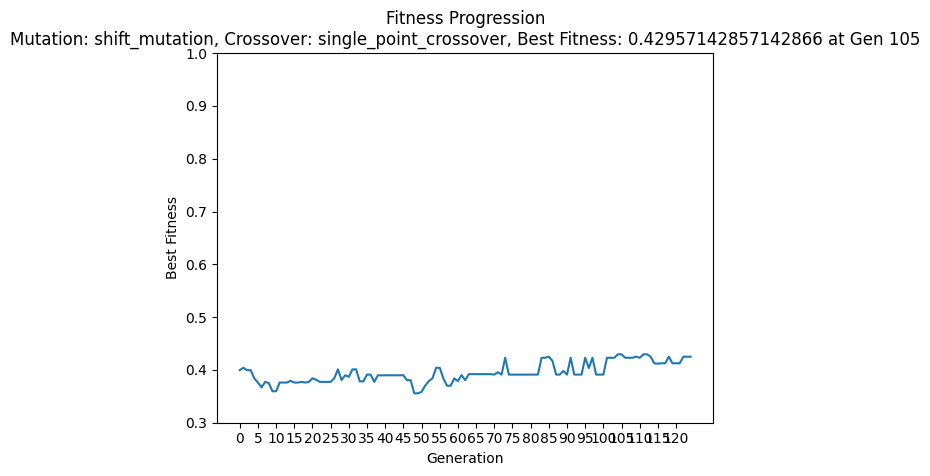

Best Fitness for this configuration: 0.42957142857142866 at Generation 105
Running GA with - Generations: 125, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.5, Elitism: False, Selection Method: roulette, Mutation: reassign_mutation, Crossover: uniform_crossover


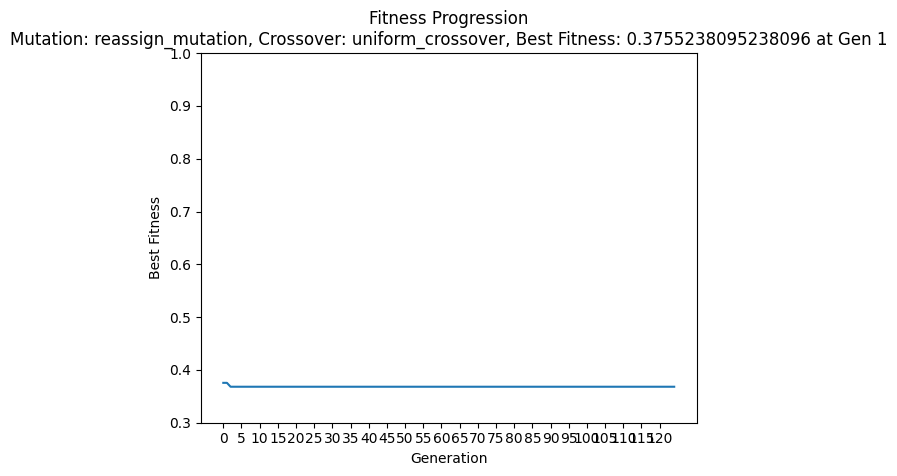

Best Fitness for this configuration: 0.3755238095238096 at Generation 1
Running GA with - Generations: 125, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.5, Elitism: False, Selection Method: roulette, Mutation: reassign_mutation, Crossover: single_point_crossover


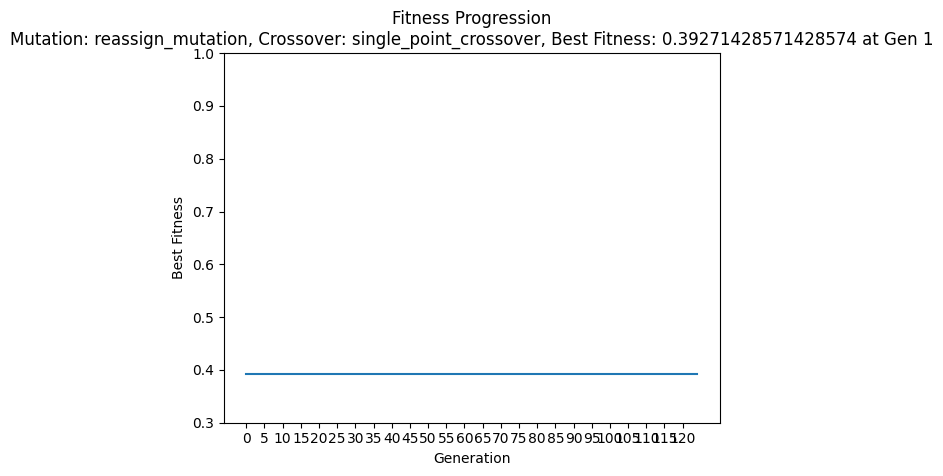

Best Fitness for this configuration: 0.39271428571428574 at Generation 1
Running GA with - Generations: 200, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.5, Elitism: False, Selection Method: roulette, Mutation: swap_mutation, Crossover: uniform_crossover


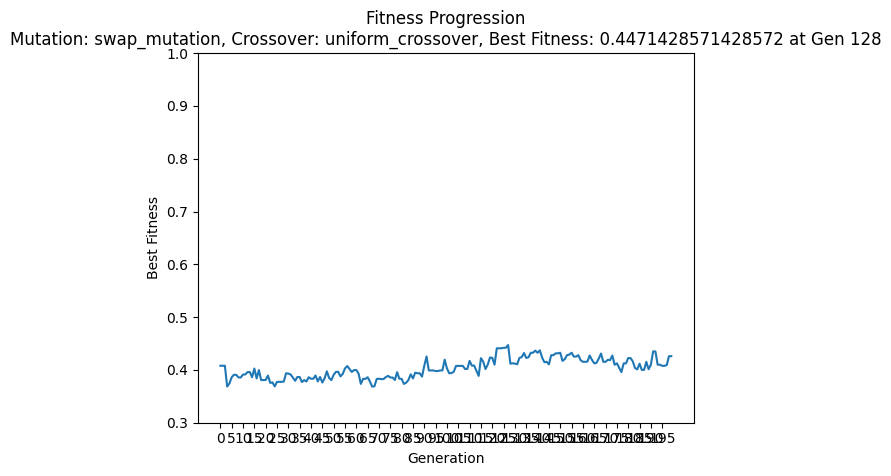

Best Fitness for this configuration: 0.4471428571428572 at Generation 128
Running GA with - Generations: 200, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.5, Elitism: False, Selection Method: roulette, Mutation: swap_mutation, Crossover: single_point_crossover


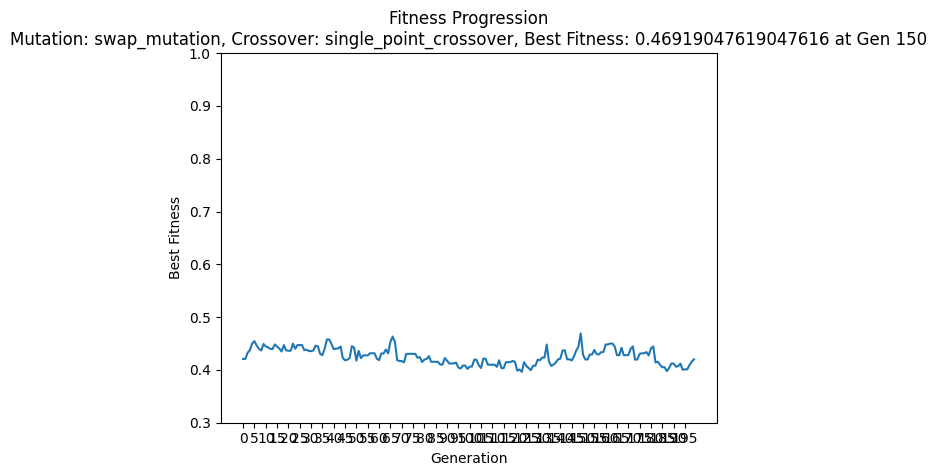

Best Fitness for this configuration: 0.46919047619047616 at Generation 150
Running GA with - Generations: 200, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.5, Elitism: False, Selection Method: roulette, Mutation: shift_mutation, Crossover: uniform_crossover


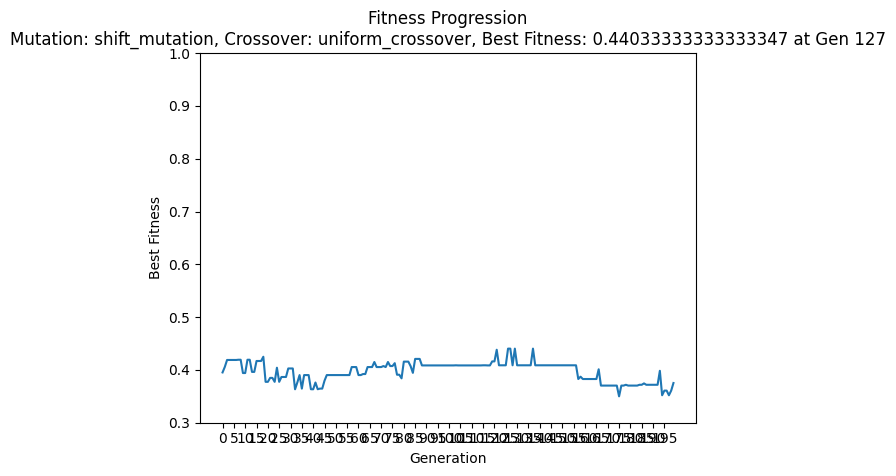

Best Fitness for this configuration: 0.44033333333333347 at Generation 127
Running GA with - Generations: 200, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.5, Elitism: False, Selection Method: roulette, Mutation: shift_mutation, Crossover: single_point_crossover


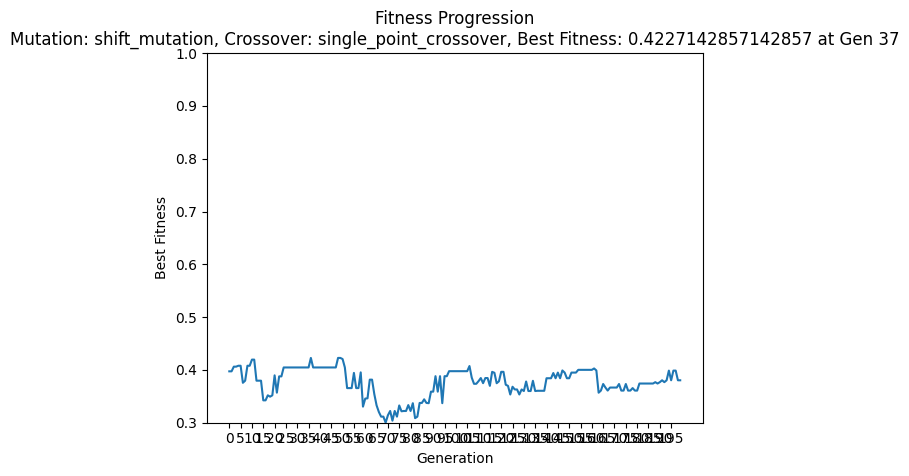

Best Fitness for this configuration: 0.4227142857142857 at Generation 37
Running GA with - Generations: 200, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.5, Elitism: False, Selection Method: roulette, Mutation: reassign_mutation, Crossover: uniform_crossover


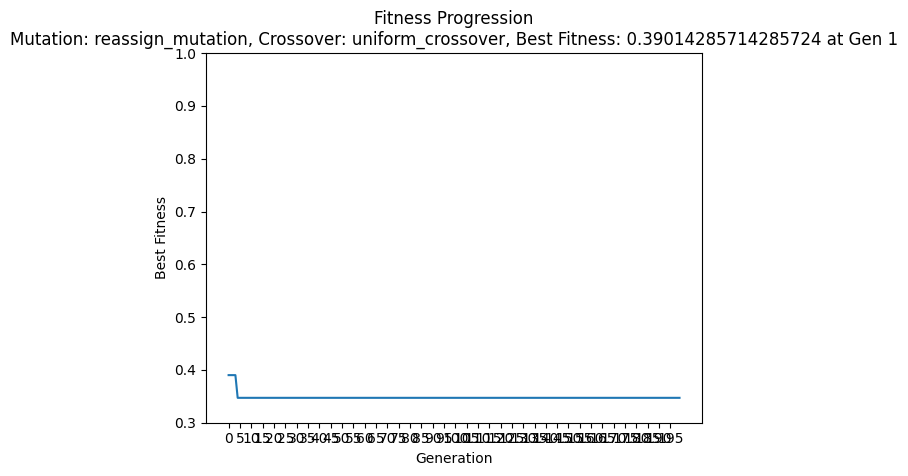

Best Fitness for this configuration: 0.39014285714285724 at Generation 1
Running GA with - Generations: 200, Prime Slot: 0.3333333333333333, Genre: 0.3333333333333333, Conflict: 0.3333333333333333, Mutation Rate: 0.5, Elitism: False, Selection Method: roulette, Mutation: reassign_mutation, Crossover: single_point_crossover


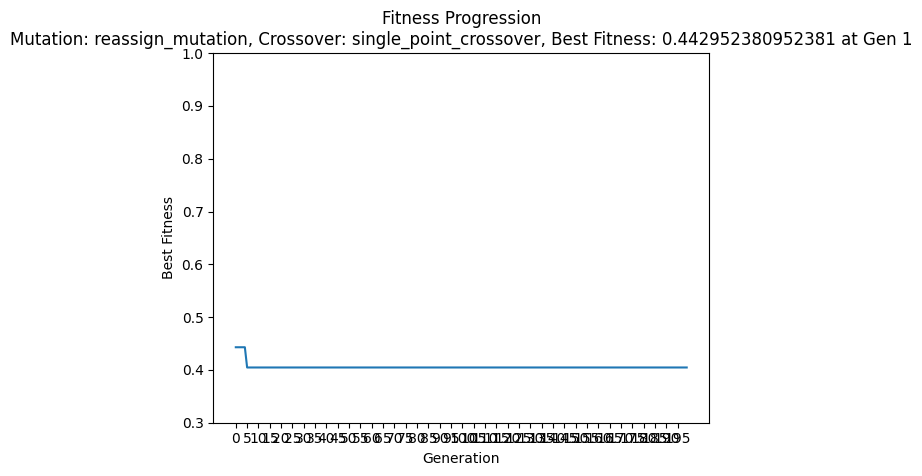

Best Fitness for this configuration: 0.442952380952381 at Generation 1

TEST RESULTS SUMMARY:
Params (Weights/MutRate/Elit/Sel)             Best Fitness    Gen Found       Mutation             Crossover           
0.33/0.33/0.33 | 0.1 | True | tournament      0.4915          46              swap_mutation        uniform_crossover   
0.33/0.33/0.33 | 0.1 | True | tournament      0.5160          50              swap_mutation        single_point_crossover
0.33/0.33/0.33 | 0.1 | True | tournament      0.4205          3               shift_mutation       uniform_crossover   
0.33/0.33/0.33 | 0.1 | True | tournament      0.4478          20              shift_mutation       single_point_crossover
0.33/0.33/0.33 | 0.1 | True | tournament      0.3822          1               reassign_mutation    uniform_crossover   
0.33/0.33/0.33 | 0.1 | True | tournament      0.4120          1               reassign_mutation    single_point_crossover
0.33/0.33/0.33 | 0.1 | True | tournament      0.5163        

In [98]:
"""
run_ga_and_visualize_all_combinations

This function runs a Genetic Algorithm (GA) to optimize music festival lineups
based on multiple combinations of hyperparameters. It evaluates each configuration
by tracking the best fitness score achieved and visualizing the progression across generations.

Key Features:
-------------
1. Iterates through combinations of:
   - Fitness weights (prime slot, genre diversity, conflict avoidance)
   - Mutation rates
   - Elitism (whether or not to preserve top solutions)
   - Selection methods (e.g., tournament or roulette wheel)

2. For each configuration:
   - Initializes a random population of candidate lineups.
   - Evolves the population over several generations using:
     * Fitness evaluation (only valid lineups are considered)
     * Selection of parents (based on method specified)
     * Crossover to generate offspring
     * Mutation to introduce diversity
     * Elitism to carry forward top solutions

3. Tracks and stores:
   - Best fitness score and the generation it was found
   - Final evolved population
   - Fitness progression (visualized via matplotlib)

4. Returns:
   - List of best fitness scores with their parameter combinations
   - Final populations for further analysis or inspection

Assumptions:
------------
- A lineup consists of stages with ordered artist slots.
- Valid lineups have no duplicate artists.
- Fitness is calculated using custom weights for multiple criteria.
- Helper functions like `initialize_population`, `compute_fitness`,
  `elitism`, `tournament_selection`, `roulette_wheel_selection`,
  `valid_crossover`, and `valid_mutate` must be defined elsewhere.

Usage:
------
Use this function to perform a grid search over GA hyperparameters
and identify which configuration yields the most optimal lineups.
"""
mutation_methods = [swap_mutation, shift_mutation, reassign_mutation]
crossover_methods = [uniform_crossover, single_point_crossover]

def valid_mutate_fixed(lineup, artists_df, mutation_func, mutation_rate=0.2):
    if random.random() < mutation_rate:
        mutated_lineup = mutation_func(lineup, artists_df)
        all_artists = [artist for stage in mutated_lineup for artist in stage]
        if len(all_artists) != len(set(all_artists)):
            return None
        return mutated_lineup
    return lineup


def run_ga_and_visualize_all_combinations(pop_size, generations, artists_df, conflicts_df,
                                        weight_combinations, mutation_rates, elitism_flags, selection_methods, mutation_methods, crossover_methods):
    best_fitness_scores = []
    population_results = []
    fitness_progressions = []
    run_times = []

    for prime_slot_weight, genre_weight, conflict_weight in weight_combinations:
        for mutation_rate in mutation_rates:
            for elitism_enabled in elitism_flags:
                for selection_method in selection_methods:
                    for generations in generations_list:
                        for mutation_func in mutation_methods:
                            for crossover_func in crossover_methods:
                                print(f"Running GA with - Generations: {generations}, Prime Slot: {prime_slot_weight}, Genre: {genre_weight}, Conflict: {conflict_weight}, Mutation Rate: {mutation_rate}, Elitism: {elitism_enabled}, Selection Method: {selection_method}, Mutation: {mutation_func.__name__}, Crossover: {crossover_func.__name__}")
                                start_time = time.time()

                                population = initialize_population(pop_size, artists_df)
                                best_fitness = -1
                                best_lineup = None
                                best_generation = 0
                                fitness_progress = []

                                for generation in range(generations):
                                    fitness_scores = []
                                    valid_lineups = []

                                    for lineup in population:
                                        all_artists = [artist for stage in lineup for artist in stage]
                                        if len(all_artists) == len(set(all_artists)):
                                            fitness = compute_fitness(lineup, artists_df, conflicts_df,
                                                                      prime_slot_weight, genre_weight, conflict_weight)
                                            fitness_scores.append(fitness)
                                            valid_lineups.append(lineup)

                                            if fitness > best_fitness:
                                                best_fitness = fitness
                                                best_lineup = [stage[:] for stage in lineup]
                                                best_generation = generation + 1
                                        else:
                                            fitness_scores.append(0)

                                    if not valid_lineups:
                                        continue

                                    next_population = []
                                    if elitism_enabled:
                                        elites = elitism(valid_lineups, fitness_scores)
                                        next_population.extend(elites)

                                    while len(next_population) < pop_size:
                                        if selection_method == "tournament":
                                            parent1 = tournament_selection(valid_lineups, artists_df, conflicts_df)
                                            parent2 = tournament_selection(valid_lineups, artists_df, conflicts_df)
                                        else:
                                            parent1 = roulette_wheel_selection(valid_lineups, fitness_scores)
                                            parent2 = roulette_wheel_selection(valid_lineups, fitness_scores)

                                        offspring = crossover_func(parent1, parent2)
                                        if offspring is not None:
                                            all_artists = [artist for stage in offspring for artist in stage]
                                            if len(all_artists) != len(set(all_artists)):
                                                continue

                                            mutated_offspring = valid_mutate_fixed(offspring, artists_df, mutation_func, mutation_rate)
                                            if mutated_offspring is not None:
                                                next_population.append(mutated_offspring)

                                    population = next_population
                                    fitness_progress.append(max(fitness_scores))

                                end_time = time.time()
                                run_time = end_time - start_time

                                best_fitness_scores.append((
                                    prime_slot_weight, genre_weight, conflict_weight,
                                    mutation_rate, elitism_enabled, selection_method,
                                    best_fitness, best_generation,
                                    mutation_func.__name__, crossover_func.__name__
                                ))

                                population_results.append(population)
                                fitness_progressions.append(fitness_progress)
                                run_times.append(run_time)

                                plt.plot(fitness_progress)
                                plt.title(f"Fitness Progression\nMutation: {mutation_func.__name__}, Crossover: {crossover_func.__name__}, Best Fitness: {best_fitness} at Gen {best_generation}")
                                plt.xlabel("Generation")
                                plt.ylabel("Best Fitness")
                                plt.ylim(0.3, 1)
                                plt.xticks(range(0, len(fitness_progress), 5))
                                plt.show()

                                print(f"Best Fitness for this configuration: {best_fitness} at Generation {best_generation}")

    return best_fitness_scores, population_results, fitness_progressions, run_times



# Define test parameters
weight_combinations = [(1/3, 1/3, 1/3)]  # Fixed weights
mutation_rates = [0.1, 0.3, 0.5]         # Test low, medium, high rates
elitism_flags = [True, False]            # Test elitism impact
selection_methods = ["tournament", "roulette"]  # Compare methods
generations_list = [50, 125, 200]       # Test different generation sizes

# Define methods explicitly for tuning
mutation_methods = [swap_mutation, shift_mutation, reassign_mutation]
crossover_methods = [uniform_crossover, single_point_crossover]

# Run GA with all combinations including mutation/crossover methods
best_fitness_scores, population_results, fitness_progressions, run_times = run_ga_and_visualize_all_combinations(
    pop_size=35,
    generations=generations_list,
    artists_df=artists_df,
    conflicts_df=conflicts_df,
    weight_combinations=weight_combinations,
    mutation_rates=mutation_rates,
    elitism_flags=elitism_flags,
    selection_methods=selection_methods,
    mutation_methods=mutation_methods,
    crossover_methods=crossover_methods
)



# Step 3: Display function
def display_reduced_results(best_fitness_scores, population_results, index_to_name, artists_df):
    print("\nTEST RESULTS SUMMARY:")
    print("{:<45} {:<15} {:<15} {:<20} {:<20}".format(
        "Params (Weights/MutRate/Elit/Sel)", "Best Fitness", "Gen Found", "Mutation", "Crossover"))

    for i, (params, pop) in enumerate(zip(best_fitness_scores, population_results)):
        p, g, c, m, e, s, fitness, gen, mut_method, cross_method = params
        param_str = f"{p:.2f}/{g:.2f}/{c:.2f} | {m} | {e} | {s}"
        print("{:<45} {:<15.4f} {:<15} {:<20} {:<20}".format(
            param_str, fitness, gen, mut_method, cross_method))

# Step 4: Display all results
display_reduced_results(best_fitness_scores, population_results, index_to_name, artists_df)

# Step 5: Show detailed best lineup
best_idx = max(range(len(best_fitness_scores)), key=lambda i: best_fitness_scores[i][6])
best_params = best_fitness_scores[best_idx]

# Find best lineup in final population
final_population = population_results[best_idx]
best_lineup = None
best_lineup_fitness = -1

for lineup in final_population:
    try:
        current_fitness = compute_fitness(lineup, artists_df, conflicts_df,
                                        best_params[0], best_params[1], best_params[2])
        if current_fitness > best_lineup_fitness:
            best_lineup_fitness = current_fitness
            best_lineup = lineup
    except:
        continue  # Skip invalid lineups


In [99]:
if best_lineup is not None:
    print("\n\nBEST OVERALL LINEUP DETAILS:")
    print(f"Parameters: Weights({best_params[0]:.2f}/{best_params[1]:.2f}/{best_params[2]:.2f})")
    print(f"Mutation: {best_params[3]}, Elitism: {best_params[4]}, Selection: {best_params[5]}")
    print(f"Fitness: {best_params[6]:.4f} (Found at generation {best_params[7]})")

    print("\nLineup by \033[95mStage\033[0m:")
    for stage_idx, stage in enumerate(best_lineup):
        print(f"\n\033[95mStage {stage_idx + 1}\033[0m:")
        for slot_idx, artist_idx in enumerate(stage):
            artist = index_to_name[artist_idx]
            genre = artists_df.iloc[artist_idx]['genre']
            pop = artists_df.iloc[artist_idx]['popularity']
            print(f"  Slot {slot_idx + 1}: {artist} ({genre}, pop: {pop})")

else:
    print("No valid lineup found in the final population!")



BEST OVERALL LINEUP DETAILS:
Parameters: Weights(0.33/0.33/0.33)
Mutation: 0.5, Elitism: False, Selection: tournament
Fitness: 0.5387 (Found at generation 82)

Lineup by Stage:

Stage 1:
  Slot 1: Shadow Cadence (Jazz, pop: 66)
  Slot 2: Nightfall Sonata (Classical, pop: 84)
  Slot 3: Velvet Pulse (Jazz, pop: 35)
  Slot 4: The Wandering Notes (Jazz, pop: 84)
  Slot 5: The Jazz Nomads (Jazz, pop: 64)
  Slot 6: The Sonic Drifters (Rock, pop: 88)
  Slot 7: Lunar Spectrum (Rock, pop: 99)

Stage 2:
  Slot 1: Hypnotic Echoes (Rock, pop: 77)
  Slot 2: The Polyrhythm Syndicate (Jazz, pop: 66)
  Slot 3: Solar Flare (Electronic, pop: 78)
  Slot 4: Parallel Dimension (Electronic, pop: 58)
  Slot 5: Velvet Underground (Rock, pop: 72)
  Slot 6: Cosmic Frequency (Rock, pop: 53)
  Slot 7: Harmonic Dissonance (Classical, pop: 96)

Stage 3:
  Slot 1: Golden Ember (Rock, pop: 61)
  Slot 2: Turbo Vortex (Rock, pop: 53)
  Slot 3: Aurora Skies (Pop, pop: 75)
  Slot 4: Static Mirage (Rock, pop: 94)
  Slot

In [268]:
columns = [
    "prime_slot_weight", "genre_weight", "conflict_weight",
    "mutation_rate", "elitism_enabled", "selection_method",
    "best_fitness", "best_generation",
    "mutation_method", "crossover_method"
]

fitness_df = pd.DataFrame(best_fitness_scores, columns=columns)

# Add run ID
fitness_df["GA_id"] = [f"GA_{i+1}" for i in range(len(fitness_df))]

#Reordering
fitness_df = fitness_df[["GA_id"] + columns]

#Runtime
fitness_df["run_time_sec"] = run_times
fitness_df["run_time_min"] = fitness_df["run_time_sec"] / 60

#Convergence Rate in percentgae
fitness_df["convergence_rate_percent"] = (1 / fitness_df["best_generation"]) * 100

#Average Improvement Rate (based on fitness progression)
avg_improvement_rates = []
for progress in fitness_progressions:
    if len(progress) > 1:
        improvement = (progress[-1] - progress[0]) / len(progress)
    else:
        improvement = 0
    avg_improvement_rates.append(improvement)

fitness_df["avg_improvement_rate"] = avg_improvement_rates



In [269]:
fitness_df_original=fitness_df.copy()

In [270]:
fitness_df

,GA_id,prime_slot_weight,genre_weight,conflict_weight,mutation_rate,elitism_enabled,selection_method,best_fitness,best_generation,mutation_method,crossover_method,run_time_sec,run_time_min,convergence_rate_percent,avg_improvement_rate
0,GA_1,0.333333,0.333333,0.333333,0.1,True,tournament,0.491476,46,swap_mutation,uniform_crossover,42.292729,0.704879,2.173913,0.001971
1,GA_2,0.333333,0.333333,0.333333,0.1,True,tournament,0.516048,50,swap_mutation,single_point_crossover,41.209251,0.686821,2.000000,0.002388
2,GA_3,0.333333,0.333333,0.333333,0.1,True,tournament,0.420524,3,shift_mutation,uniform_crossover,36.987067,0.616451,33.333333,0.000492
3,GA_4,0.333333,0.333333,0.333333,0.1,True,tournament,0.447810,20,shift_mutation,single_point_crossover,41.861295,0.697688,5.000000,0.000965
4,GA_5,0.333333,0.333333,0.333333,0.1,True,tournament,0.382190,1,reassign_mutation,uniform_crossover,39.259305,0.654322,100.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
211,GA_212,0.333333,0.333333,0.333333,0.5,False,roulette,0.469190,150,swap_mutation,single_point_crossover,16.699936,0.278332,0.666667,-0.000004
212,GA_213,0.333333,0.333333,0.333333,0.5,False,roulette,0.440333,127,shift_mutation,uniform_crossover,18.342486,0.305708,0.787402,-0.000100
213,GA_214,0.333333,0.333333,0.333333,0.5,False,roulette,0.422714,37,shift_mutation,single_point_crossover,17.842516,0.297375,2.702703,-0.000085
214,GA_215,0.333333,0.333333,0.333333,0.5,False,roulette,0.390143,1,reassign_mutation,uniform_crossover,16.348808,0.272480,100.000000,-0.000215


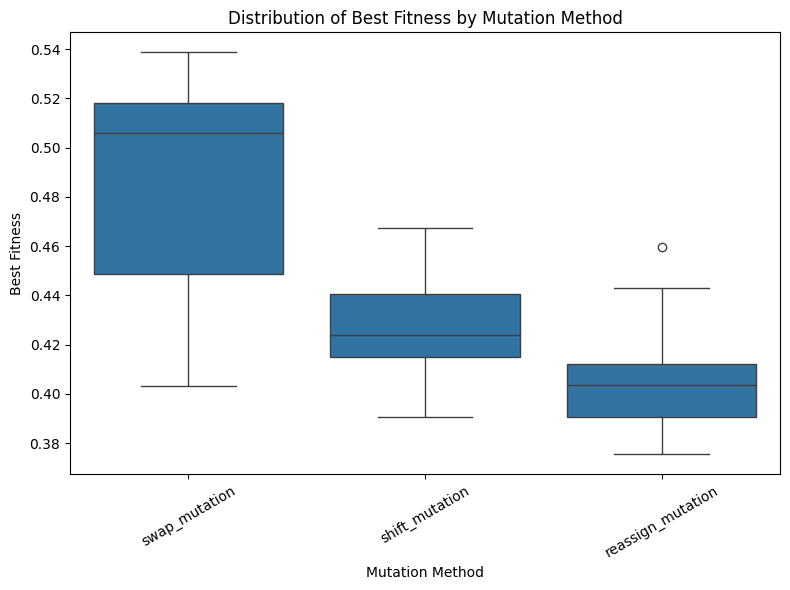

In [271]:
#Getting the distribution of best fitness by mutation method
plt.figure(figsize=(8, 6))
sns.boxplot(data=fitness_df, x="mutation_method", y="best_fitness")
plt.title("Distribution of Best Fitness by Mutation Method")
plt.xlabel("Mutation Method")
plt.ylabel("Best Fitness")
plt.xticks(rotation=30)
plt.tight_layout()
plt.show()


In [272]:
fitness_df.groupby("mutation_method")["best_fitness"].mean().sort_values(ascending=False)


,best_fitness
mutation_method,
swap_mutation,0.487962
shift_mutation,0.427887
reassign_mutation,0.402867


In [273]:
fitness_df.groupby("mutation_method")["avg_improvement_rate"].mean().sort_values(ascending=False)


,avg_improvement_rate
mutation_method,
swap_mutation,0.000751
shift_mutation,0.000140
reassign_mutation,-0.000084


In [274]:
fitness_df.groupby("mutation_method")["convergence_rate_percent"].mean().sort_values(ascending=False)


,convergence_rate_percent
mutation_method,
reassign_mutation,100.000000
shift_mutation,39.529520
swap_mutation,5.537851


- This shows that the mutation method "reassign_mutation" presents premature convergence, as the genetic algorithm gets stuck at a local optimum too early.
- reassign_mutation presemts the lowest average best fitness
- reassign_mutation also presents the worst average improvement rate.
-Based on this, we conclude that reassign_mutation is ineffective for this problem. Hence, in order to decrease the number of GA, we are going to remove all the 72 GA configuration with reassign_mutation

In [275]:
fitness_df = fitness_df[fitness_df["mutation_method"] != "reassign_mutation"]


In [276]:
fitness_df.shape

(144, 15)

Now to filter out more configurations in order to have at least 30 configurations, we are going to remove the configurations with best_fitness lower than 0.50

In [277]:
low_scores_df=fitness_df[fitness_df["best_fitness"] <= 0.51]

In [278]:
low_scores_df.groupby("mutation_method")["avg_improvement_rate"].mean().sort_values(ascending=False)


,avg_improvement_rate
mutation_method,
swap_mutation,0.000464
shift_mutation,0.000140


In [279]:
low_scores_df.groupby("mutation_method")["convergence_rate_percent"].mean().sort_values(ascending=False)


,convergence_rate_percent
mutation_method,
shift_mutation,39.529520
swap_mutation,8.606895


In [280]:
fitness_df= fitness_df[fitness_df["best_fitness"] >= 0.51]

In [281]:
fitness_df['mutation_method'].unique()

array(['swap_mutation'], dtype=object)

In [283]:
#Plotting the fitness progression for each configuration
def plot_fitness_progression(fitness_df, fitness_progressions):
    import matplotlib.pyplot as plt

    num_plots = len(fitness_df)
    cols = 4
    rows = (num_plots + cols - 1) // cols

    fig, axes = plt.subplots(rows, cols, figsize=(4 * cols, 3 * rows))
    axes = axes.flatten()

    for i, (idx, row) in enumerate(fitness_df.iterrows()):
        progress = fitness_progressions[idx]
        ax = axes[i]

        ax.plot(progress, color="#7b374f")
        best_fit = row["best_fitness"]
        best_gen = row["best_generation"]
        mutation = row["mutation_method"]
        crossover = row["crossover_method"]

        ax.set_title(f"GA {i+1}\nBest: {best_fit:.2f} at Gen {best_gen}\n{mutation} | {crossover}", fontsize=8)
        ax.set_xlabel("Gen", fontsize=7)
        ax.set_ylabel("Fitness", fontsize=7)
        ax.tick_params(axis='both', which='major', labelsize=6)
        ax.set_ylim(0.3, 1)

    # Remove unused subplots
    for i in range(len(fitness_df), len(axes)):
        fig.delaxes(axes[i])

    plt.tight_layout()
    plt.show()


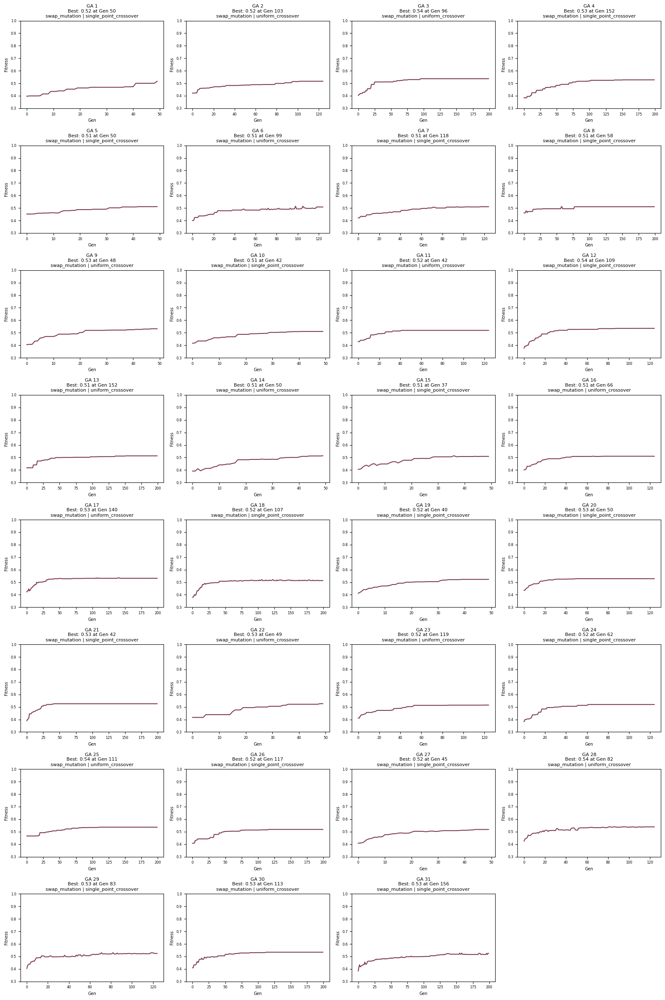

In [299]:
plot_fitness_progression(fitness_df, fitness_progressions)


We can still observe some convergence and difference in best fitness in the configuration left. Hence, we will check also the runtimes to filter out configurations

In [300]:
low_scores_df.groupby("crossover_method")["convergence_rate_percent"].mean().sort_values(ascending=False)


,convergence_rate_percent
crossover_method,
single_point_crossover,30.697397
uniform_crossover,26.045711


In [301]:
fitness_df[fitness_df['convergence_rate_percent']>=2]

,GA_id,prime_slot_weight,genre_weight,conflict_weight,mutation_rate,elitism_enabled,selection_method,best_fitness,best_generation,mutation_method,crossover_method,run_time_sec,run_time_min,convergence_rate_percent,avg_improvement_rate
1,GA_2,0.333333,0.333333,0.333333,0.1,True,tournament,0.516048,50,swap_mutation,single_point_crossover,41.209251,0.686821,2.000000,0.002388
37,GA_38,0.333333,0.333333,0.333333,0.1,False,tournament,0.511190,50,swap_mutation,single_point_crossover,44.837810,0.747297,2.000000,0.001186
72,GA_73,0.333333,0.333333,0.333333,0.3,True,tournament,0.532143,48,swap_mutation,uniform_crossover,48.456981,0.807616,2.083333,0.002540
73,GA_74,0.333333,0.333333,0.333333,0.3,True,tournament,0.510429,42,swap_mutation,single_point_crossover,46.528027,0.775467,2.380952,0.001890
78,GA_79,0.333333,0.333333,0.333333,0.3,True,tournament,0.519048,42,swap_mutation,uniform_crossover,86.836668,1.447278,2.380952,0.000725
108,GA_109,0.333333,0.333333,0.333333,0.3,False,tournament,0.513714,50,swap_mutation,uniform_crossover,58.374793,0.972913,2.000000,0.002440
109,GA_110,0.333333,0.333333,0.333333,0.3,False,tournament,0.513857,37,swap_mutation,single_point_crossover,50.288316,0.838139,2.702703,0.002076
145,GA_146,0.333333,0.333333,0.333333,0.5,True,tournament,0.522762,40,swap_mutation,single_point_crossover,54.467488,0.907791,2.500000,0.002211
151,GA_152,0.333333,0.333333,0.333333,0.5,True,tournament,0.528190,50,swap_mutation,single_point_crossover,93.030102,1.550502,2.000000,0.000734
157,GA_158,0.333333,0.333333,0.333333,0.5,True,tournament,0.525619,42,swap_mutation,single_point_crossover,138.191040,2.303184,2.380952,0.000679


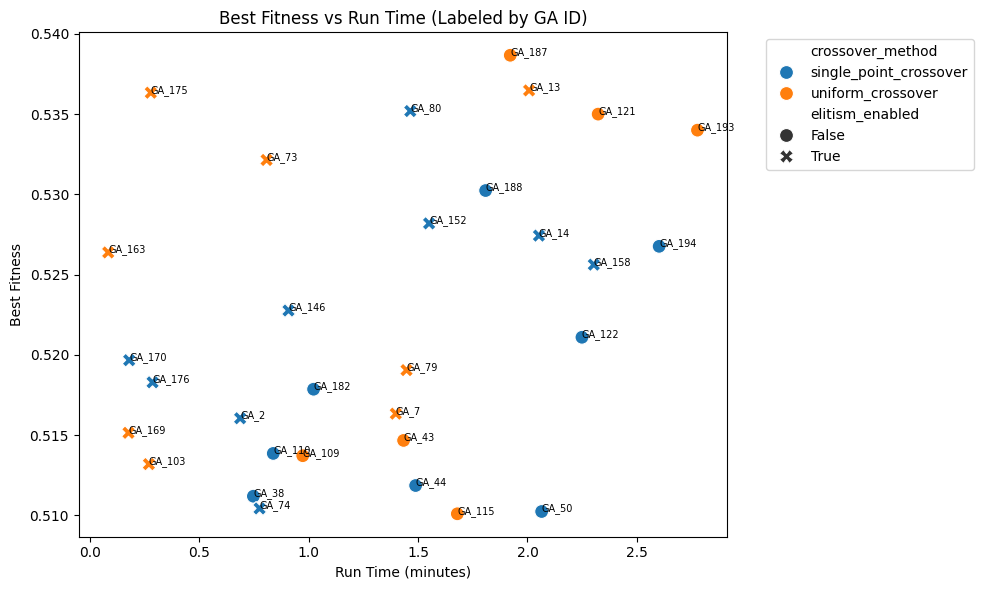

In [302]:
plt.figure(figsize=(10, 6))
ax = sns.scatterplot(
    data=fitness_df,
    x="run_time_min",
    y="best_fitness",
    hue="crossover_method",
    style="elitism_enabled",
    s=100
)

for _, row in fitness_df.iterrows():
    ax.text(row["run_time_min"], row["best_fitness"], row["GA_id"], fontsize=7)

plt.title("Best Fitness vs Run Time (Labeled by GA ID)")
plt.xlabel("Run Time (minutes)")
plt.ylabel("Best Fitness")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


Uniform_crossover seems to present the best fitness against single_point_crossover

In [303]:
low_perf_df = fitness_df[fitness_df["best_fitness"] < 0.525]

elitism_counts = low_perf_df["elitism_enabled"].value_counts()
print(elitism_counts)


elitism_enabled
True     9
False    9
Name: count, dtype: int64


filtering the dataset to have only the bst_fitness higher than 0.525

In [304]:
fitness_df = fitness_df[fitness_df["best_fitness"] >= 0.525]
fitness_df.shape
fitness_df

,GA_id,prime_slot_weight,genre_weight,conflict_weight,mutation_rate,elitism_enabled,selection_method,best_fitness,best_generation,mutation_method,crossover_method,run_time_sec,run_time_min,convergence_rate_percent,avg_improvement_rate
12,GA_13,0.333333,0.333333,0.333333,0.1,True,tournament,0.536476,96,swap_mutation,uniform_crossover,120.454943,2.007582,1.041667,0.000665
13,GA_14,0.333333,0.333333,0.333333,0.1,True,tournament,0.527429,152,swap_mutation,single_point_crossover,123.151236,2.052521,0.657895,0.000718
72,GA_73,0.333333,0.333333,0.333333,0.3,True,tournament,0.532143,48,swap_mutation,uniform_crossover,48.456981,0.807616,2.083333,0.002540
79,GA_80,0.333333,0.333333,0.333333,0.3,True,tournament,0.535190,109,swap_mutation,single_point_crossover,87.865244,1.464421,0.917431,0.001267
120,GA_121,0.333333,0.333333,0.333333,0.3,False,tournament,0.535000,140,swap_mutation,uniform_crossover,139.383923,2.323065,0.714286,0.000545
151,GA_152,0.333333,0.333333,0.333333,0.5,True,tournament,0.528190,50,swap_mutation,single_point_crossover,93.030102,1.550502,2.000000,0.000734
157,GA_158,0.333333,0.333333,0.333333,0.5,True,tournament,0.525619,42,swap_mutation,single_point_crossover,138.191040,2.303184,2.380952,0.000679
162,GA_163,0.333333,0.333333,0.333333,0.5,True,roulette,0.526381,49,swap_mutation,uniform_crossover,5.031147,0.083852,2.040816,0.002196
174,GA_175,0.333333,0.333333,0.333333,0.5,True,roulette,0.536333,111,swap_mutation,uniform_crossover,16.704975,0.278416,0.900901,0.000352
186,GA_187,0.333333,0.333333,0.333333,0.5,False,tournament,0.538667,82,swap_mutation,uniform_crossover,115.283891,1.921398,1.219512,0.000909


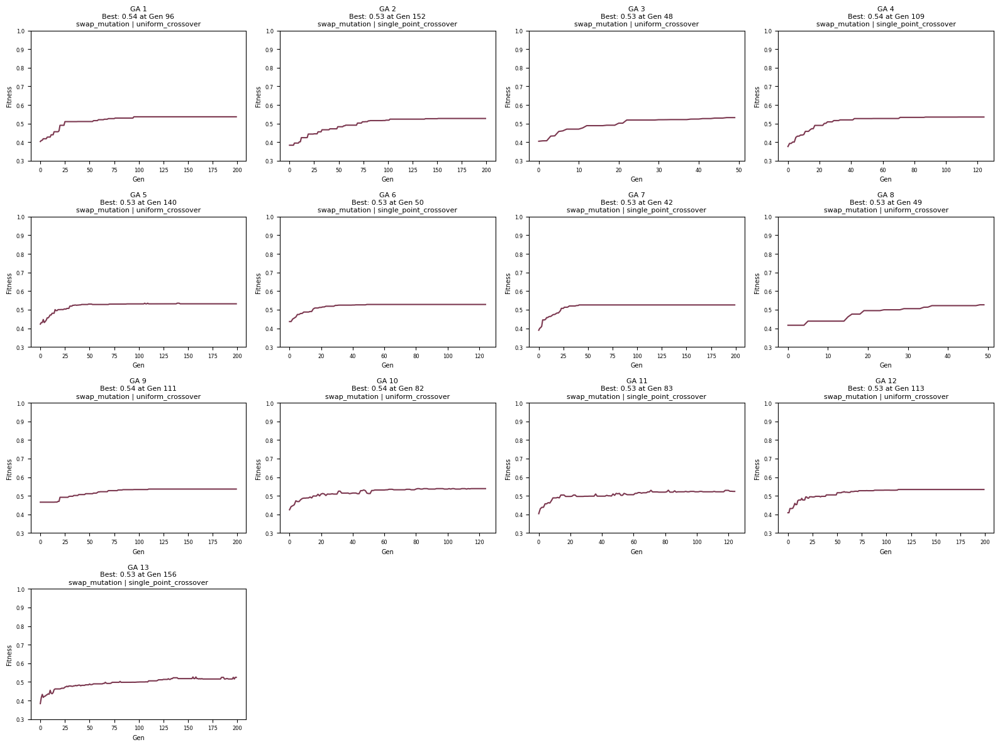

In [305]:
#Getting the progressions of the current configurations
plot_fitness_progression(fitness_df, fitness_progressions)

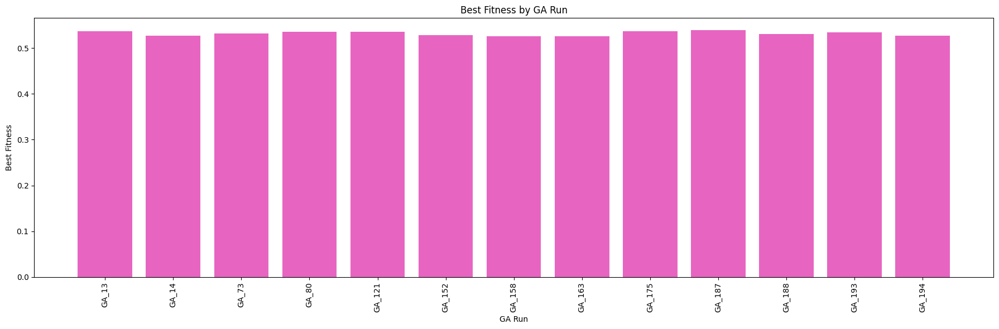

In [306]:
#Plotting the best fitness of each configuration
plt.figure(figsize=(18, 6))
plt.bar(fitness_df["GA_id"], fitness_df["best_fitness"], color='#E765C1')
plt.xticks(rotation=90)
plt.xlabel("GA Run")
plt.ylabel("Best Fitness")
plt.title("Best Fitness by GA Run")
plt.tight_layout()
plt.show()


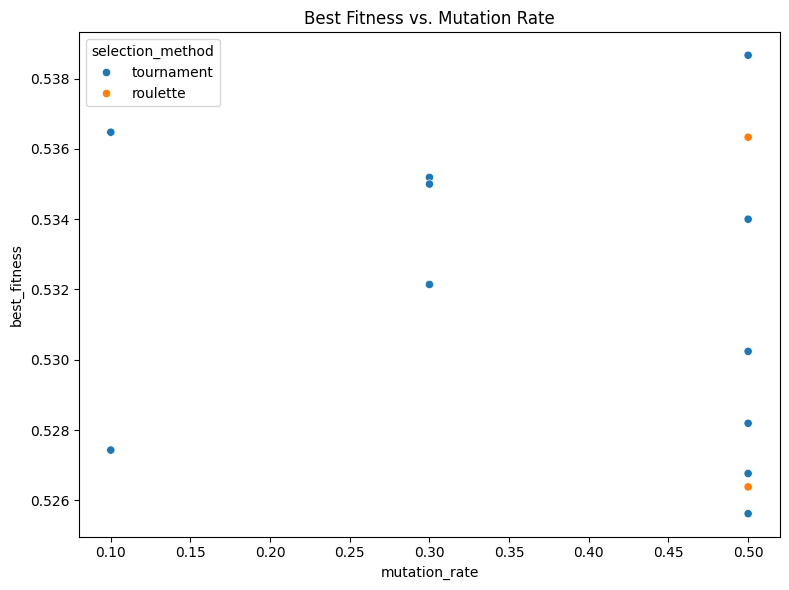

In [307]:
plt.figure(figsize=(8, 6))
sns.scatterplot(data=fitness_df, x="mutation_rate", y="best_fitness", hue="selection_method")
plt.title("Best Fitness vs. Mutation Rate")
plt.tight_layout()
plt.show()


The 0.5 mutation rate with tournment selection method reached the highest best fitness

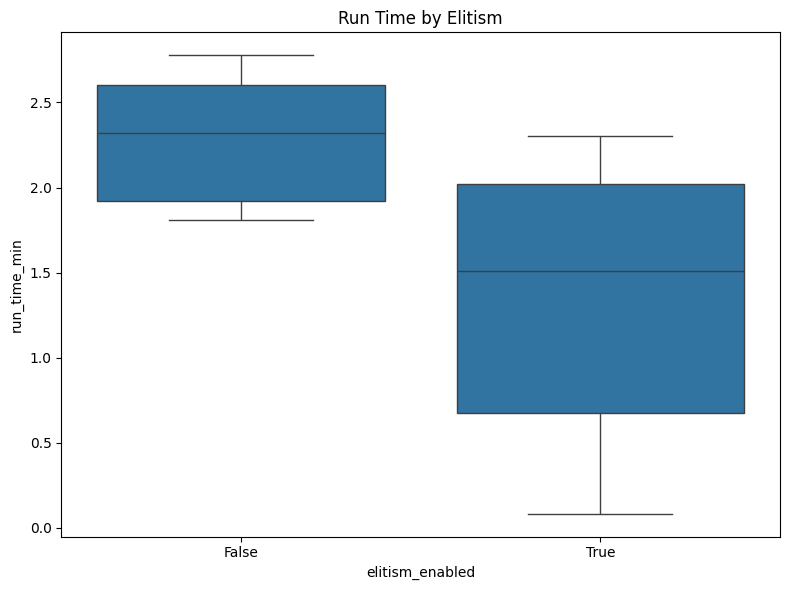

In [308]:
plt.figure(figsize=(8, 6))
sns.boxplot(data=fitness_df, x="elitism_enabled", y="run_time_min")
plt.title("Run Time by Elitism")
plt.tight_layout()
plt.show()


Runtime when elitism is false, is slightly higher

In [309]:
def plot_labeled_fitness_by_param(fitness_df, param_column, title):
    import matplotlib.pyplot as plt

    plt.figure(figsize=(12, 6))

    x = fitness_df[param_column]
    y = fitness_df["best_fitness"]
    labels = fitness_df["GA_id"]

    plt.scatter(x, y, c="dodgerblue", s=70, alpha=0.7, edgecolors="k")

    for i, label in enumerate(labels):
        plt.text(x.iloc[i], y.iloc[i] + 0.00005, label, fontsize=8, ha='center', rotation=30)

    plt.title(title)
    plt.xlabel(param_column.replace("_", " ").title())
    plt.ylabel("Best Fitness")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

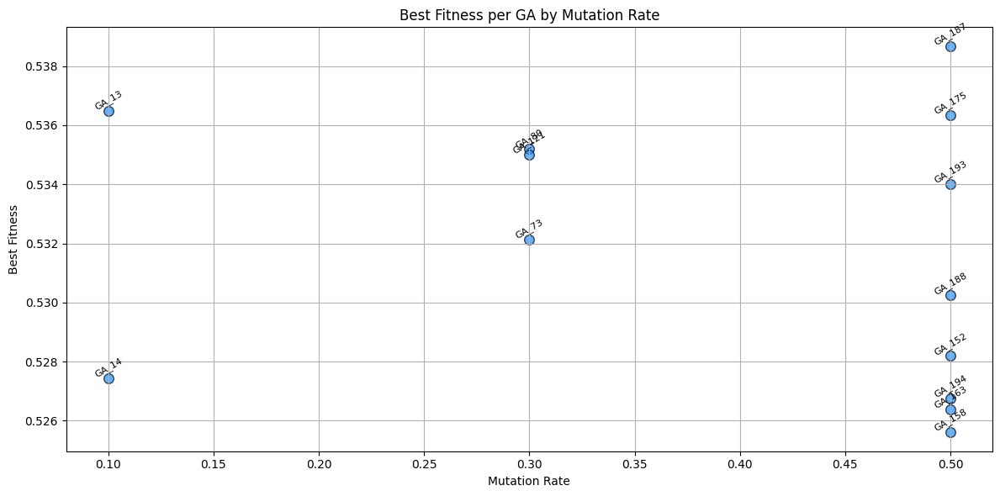

In [310]:
plot_labeled_fitness_by_param(fitness_df, "mutation_rate", "Best Fitness per GA by Mutation Rate")


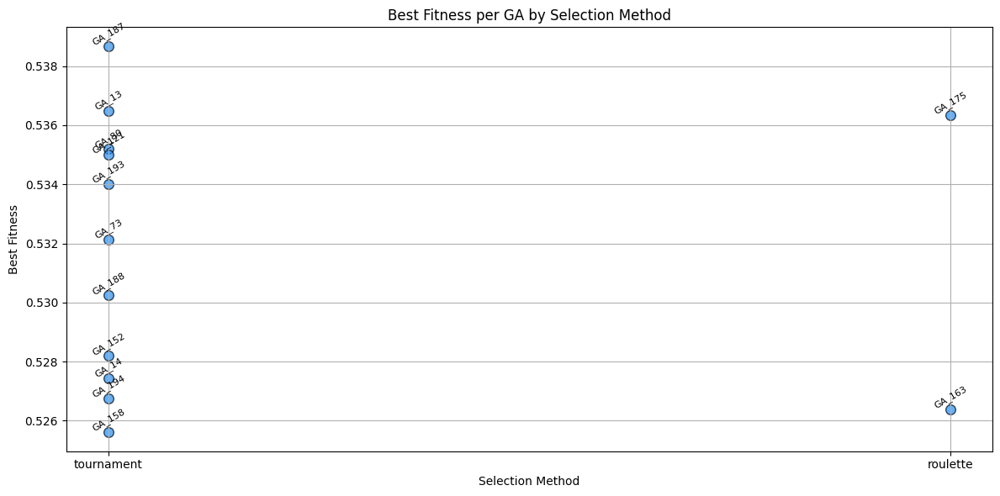

In [311]:
plot_labeled_fitness_by_param(fitness_df, "selection_method", "Best Fitness per GA by Selection Method")

Since the original dataset was filtered out to get only the highest best_fitness, we see that most of the selection method used for these top configurations is the tournment

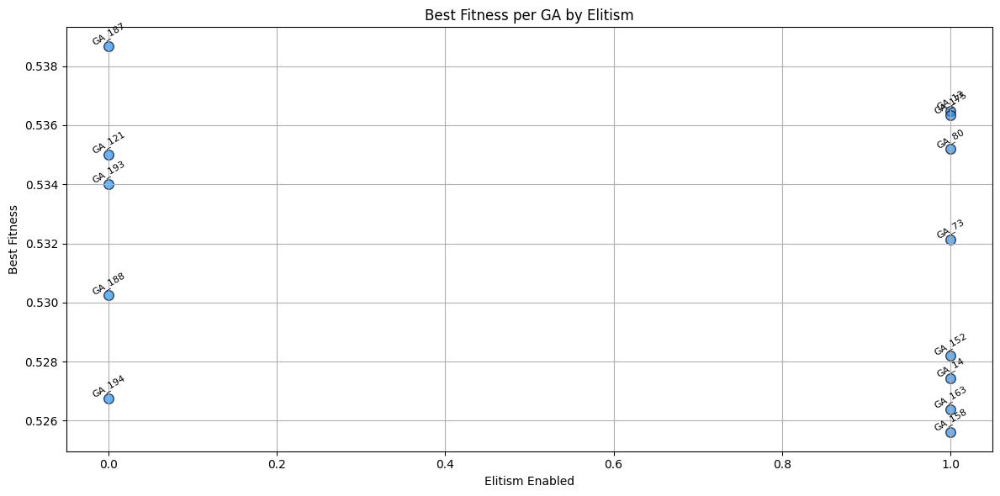

In [312]:
plot_labeled_fitness_by_param(fitness_df, "elitism_enabled", "Best Fitness per GA by Elitism")

- Most of the GAs with lower best-fitness had elitism enabled

Now, to finally decided on whihc is the best configuration, we will compare the each of them by best-fitness and by runtime

In [313]:
def plot_fitness_and_time_comparison(fitness_df):
    sorted_df = fitness_df.sort_values(by="best_fitness", ascending=False).reset_index(drop=True)

    ga_ids = sorted_df["GA_id"]
    fitness = sorted_df["best_fitness"]
    time_min = sorted_df["run_time_min"]

    y = np.arange(len(ga_ids))
    height = 0.4

    fig, ax1 = plt.subplots(figsize=(12, max(6, len(ga_ids) * 0.3)))  # dynamic height

    bars1 = ax1.barh(y - height/2, fitness, height, label='Best Fitness', color="#e765c1")
    ax1.set_xlabel('Best Fitness')
    ax1.set_xlim(0, 1)
    ax1.tick_params(axis='x')

    ax2 = ax1.twiny()
    bars2 = ax2.barh(y + height/2, time_min, height, label='Runtime (min)', color="#7b374f")
    ax2.set_xlabel('Runtime (minutes)')
    ax2.tick_params(axis='x')

    ax1.set_yticks(y)
    ax1.set_yticklabels(ga_ids)
    ax1.invert_yaxis()

    for i in range(len(ga_ids)):
        ax1.text(fitness[i] + 0.01, y[i] - height/2, f"{fitness[i]:.2f}", va='center', fontsize=8, color='black')
        ax2.text(time_min[i] + 0.1, y[i] + height/2, f"{time_min[i]:.1f}", va='center', fontsize=8, color='black')

    plt.title("GA Configurations: Best Fitness vs Runtime", pad=20)
    plt.tight_layout()
    plt.show()



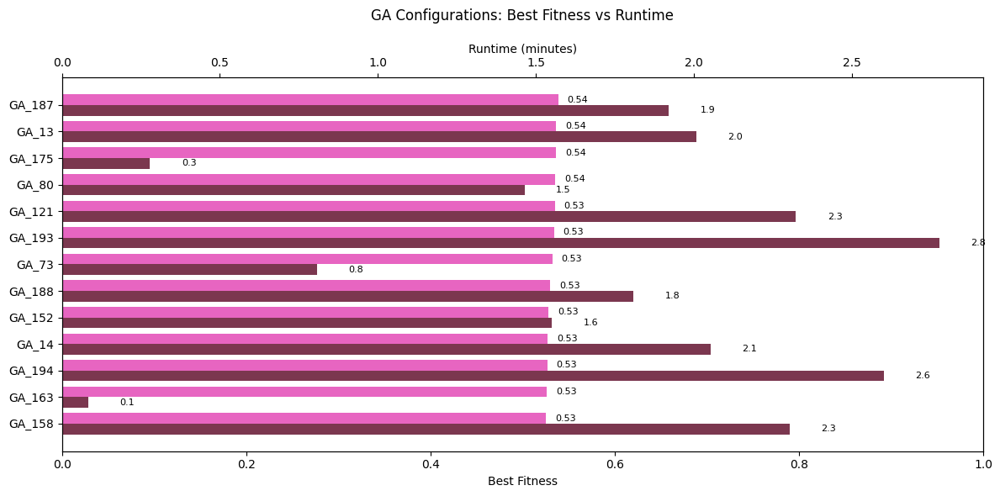

In [314]:
plot_fitness_and_time_comparison(fitness_df)


GA_187 presents slightly higher best fitness out of all the GA configurations, with a run time of more or less 1min, even though we have GA_175 with also a high fitness but only 3sencods of runtime---> I wonder what the convergence rate is

1.   Item de lista
2.   Item de lista



In [324]:
top_gas = fitness_df.sort_values(by="best_fitness", ascending=False)
top_gas[["GA_id", "best_fitness", "run_time_min","convergence_rate_percent"]]


,GA_id,best_fitness,run_time_min,convergence_rate_percent
186,GA_187,0.538667,1.921398,1.219512
12,GA_13,0.536476,2.007582,1.041667
174,GA_175,0.536333,0.278416,0.900901
79,GA_80,0.535190,1.464421,0.917431
120,GA_121,0.535000,2.323065,0.714286
192,GA_193,0.534000,2.777113,0.884956
72,GA_73,0.532143,0.807616,2.083333
187,GA_188,0.530238,1.808833,1.204819
151,GA_152,0.528190,1.550502,2.000000
13,GA_14,0.527429,2.052521,0.657895


In [330]:
#Saving the final configurations to a csv file
fitness_df.to_csv("fitness_df.csv", index=False)

In [331]:
fitness_df

,GA_id,prime_slot_weight,genre_weight,conflict_weight,mutation_rate,elitism_enabled,selection_method,best_fitness,best_generation,mutation_method,crossover_method,run_time_sec,run_time_min,convergence_rate_percent,avg_improvement_rate
12,GA_13,0.333333,0.333333,0.333333,0.1,True,tournament,0.536476,96,swap_mutation,uniform_crossover,120.454943,2.007582,1.041667,0.000665
13,GA_14,0.333333,0.333333,0.333333,0.1,True,tournament,0.527429,152,swap_mutation,single_point_crossover,123.151236,2.052521,0.657895,0.000718
72,GA_73,0.333333,0.333333,0.333333,0.3,True,tournament,0.532143,48,swap_mutation,uniform_crossover,48.456981,0.807616,2.083333,0.002540
79,GA_80,0.333333,0.333333,0.333333,0.3,True,tournament,0.535190,109,swap_mutation,single_point_crossover,87.865244,1.464421,0.917431,0.001267
120,GA_121,0.333333,0.333333,0.333333,0.3,False,tournament,0.535000,140,swap_mutation,uniform_crossover,139.383923,2.323065,0.714286,0.000545
151,GA_152,0.333333,0.333333,0.333333,0.5,True,tournament,0.528190,50,swap_mutation,single_point_crossover,93.030102,1.550502,2.000000,0.000734
157,GA_158,0.333333,0.333333,0.333333,0.5,True,tournament,0.525619,42,swap_mutation,single_point_crossover,138.191040,2.303184,2.380952,0.000679
162,GA_163,0.333333,0.333333,0.333333,0.5,True,roulette,0.526381,49,swap_mutation,uniform_crossover,5.031147,0.083852,2.040816,0.002196
174,GA_175,0.333333,0.333333,0.333333,0.5,True,roulette,0.536333,111,swap_mutation,uniform_crossover,16.704975,0.278416,0.900901,0.000352
186,GA_187,0.333333,0.333333,0.333333,0.5,False,tournament,0.538667,82,swap_mutation,uniform_crossover,115.283891,1.921398,1.219512,0.000909


In [316]:
fitness_df[fitness_df["best_fitness"] == fitness_df["best_fitness"].max()]

,GA_id,prime_slot_weight,genre_weight,conflict_weight,mutation_rate,elitism_enabled,selection_method,best_fitness,best_generation,mutation_method,crossover_method,run_time_sec,run_time_min,convergence_rate_percent,avg_improvement_rate
186,GA_187,0.333333,0.333333,0.333333,0.5,False,tournament,0.538667,82,swap_mutation,uniform_crossover,115.283891,1.921398,1.219512,0.000909


In [317]:
fitness_df_original["final_population"] = population_results

#Saving for future checkup and also in the df
for i, pop in enumerate(population_results):
    pd.to_pickle(pop, f"GA_{i+1}_population.pkl")


Checking the lineup with the best fitness

In [318]:
population = pd.read_pickle("GA_187_population.pkl")


In [319]:
#parameter weights for the fitness function
prime_slot_weight = 1/3
genre_weight = 1/3
conflict_weight = 1/3

best_fitness = -1
best_lineup = None

for lineup in population:
    try:
        fitness = compute_fitness(lineup, artists_df, conflicts_df,
                                  prime_slot_weight, genre_weight, conflict_weight)
        if fitness > best_fitness:
            best_fitness = fitness
            best_lineup = lineup
    except:
        continue


In [320]:
print(f"Best fitness: \033[95m{best_fitness:.4f}\033[0m ")
for stage_idx, stage in enumerate(best_lineup):
    print(f"\n \033[95mStage{stage_idx + 1}\033[0m :")
    for slot_idx, artist_idx in enumerate(stage):
        artist = index_to_name[artist_idx]
        genre = artists_df.iloc[artist_idx]['genre']
        pop = artists_df.iloc[artist_idx]['popularity']
        print(f"  Slot {slot_idx + 1}: {artist} ({genre}, pop: {pop})")

Best fitness: 0.5387 

 Stage1 :
  Slot 1: Shadow Cadence (Jazz, pop: 66)
  Slot 2: Nightfall Sonata (Classical, pop: 84)
  Slot 3: Velvet Pulse (Jazz, pop: 35)
  Slot 4: The Wandering Notes (Jazz, pop: 84)
  Slot 5: The Jazz Nomads (Jazz, pop: 64)
  Slot 6: The Sonic Drifters (Rock, pop: 88)
  Slot 7: Lunar Spectrum (Rock, pop: 99)

 Stage2 :
  Slot 1: Hypnotic Echoes (Rock, pop: 77)
  Slot 2: The Polyrhythm Syndicate (Jazz, pop: 66)
  Slot 3: Solar Flare (Electronic, pop: 78)
  Slot 4: Parallel Dimension (Electronic, pop: 58)
  Slot 5: Velvet Underground (Rock, pop: 72)
  Slot 6: Cosmic Frequency (Rock, pop: 53)
  Slot 7: Harmonic Dissonance (Classical, pop: 96)

 Stage3 :
  Slot 1: Golden Ember (Rock, pop: 61)
  Slot 2: Turbo Vortex (Rock, pop: 53)
  Slot 3: Aurora Skies (Pop, pop: 75)
  Slot 4: Static Mirage (Rock, pop: 94)
  Slot 5: Blue Horizon (Pop, pop: 51)
  Slot 6: Neon Reverie (Electronic, pop: 100)
  Slot 7: Echo Chamber (Electronic, pop: 98)

 Stage4 :
  Slot 1: Mystic Rhy

In [336]:
#Showing the best lineup in a more visually appealing form
console = Console()
console.print(f"\n [bold magenta]Best Fitness:[/bold magenta] {best_fitness:.4f}\n")

for stage_idx, stage in enumerate(best_lineup):
    table = Table(title=f" Stage {stage_idx + 1}", title_style="bold magenta")

    table.add_column("Slot", style="dim")
    table.add_column("Artist", style="cyan")
    table.add_column("Genre")
    table.add_column("Popularity", justify="right")

    for slot_idx, artist_idx in enumerate(stage):
        artist = index_to_name[artist_idx]
        genre = artists_df.iloc[artist_idx]['genre']
        pop = artists_df.iloc[artist_idx]['popularity']
        table.add_row(f"{slot_idx + 1}", artist, genre, str(pop))

    console.print(table)


Best Fitness: 0.5387

                        Stage 1                        
┏━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━┳━━━━━━━━━━━━┓
┃ Slot ┃ Artist              ┃ Genre     ┃ Popularity ┃
┡━━━━━━╇━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━╇━━━━━━━━━━━━┩
│ 1    │ Shadow Cadence      │ Jazz      │         66 │
│ 2    │ Nightfall Sonata    │ Classical │         84 │
│ 3    │ Velvet Pulse        │ Jazz      │         35 │
│ 4    │ The Wandering Notes │ Jazz      │         84 │
│ 5    │ The Jazz Nomads     │ Jazz      │         64 │
│ 6    │ The Sonic Drifters  │ Rock      │         88 │
│ 7    │ Lunar Spectrum      │ Rock      │         99 │
└──────┴─────────────────────┴───────────┴────────────┘

                           Stage 2                           
┏━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━┓
┃ Slot ┃ Artist                   ┃ Genre      ┃ Popularity ┃
┡━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━┩
│ 1    │ Hypnotic Echoes          │ Rock       │         77 │
│ 2    │ The Polyrhythm Syndicate │ Jazz       │         66 │
│ 3    │ Solar Flare              │ Electronic │         78 │
│ 4    │ Parallel Dimension       │ Electronic │         58 │
│ 5    │ Velvet Underground       │ Rock       │         72 │
│ 6    │ Cosmic Frequency         │ Rock       │         53 │
│ 7    │ Harmonic Dissonance      │ Classical  │         96 │
└──────┴──────────────────────────┴────────────┴────────────┘

                      Stage 3                     
┏━━━━━━┳━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━┓
┃ Slot ┃ Artist        ┃ Genre      ┃ Popularity ┃
┡━━━━━━╇━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━┩
│ 1    │ Golden Ember  │ Rock       │         61 │
│ 2    │ Turbo Vortex  │ Rock       │         53 │
│ 3    │ Aurora Skies  │ Pop        │         75 │
│ 4    │ Static Mirage │ Rock       │         94 │
│ 5    │ Blue Horizon  │ Pop        │         51 │
│ 6    │ Neon Reverie  │ Electronic │        100 │
│ 7    │ Echo Chamber  │ Electronic │         98 │
└──────┴───────────────┴────────────┴────────────┘

                           Stage 4                          
┏━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━┓
┃ Slot ┃ Artist                  ┃ Genre      ┃ Popularity ┃
┡━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━┩
│ 1    │ Mystic Rhythms          │ Classical  │         78 │
│ 2    │ Celestial Voyage        │ Electronic │         95 │
│ 3    │ Synthwave Saints        │ Rock       │         94 │
│ 4    │ Phantom Groove          │ Hip-Hop    │         47 │
│ 5    │ The Bassline Architects │ Hip-Hop    │         61 │
│ 6    │ Deep Resonance          │ Jazz       │         90 │
│ 7    │ Quantum Beat            │ Hip-Hop    │         96 │
└──────┴─────────────────────────┴────────────┴────────────┘

                          Stage 5                         
┏━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━┓
┃ Slot ┃ Artist                ┃ Genre      ┃ Popularity ┃
┡━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━┩
│ 1    │ Astral Tide           │ Electronic │         69 │
│ 2    │ Cloud Nine Collective │ Pop        │         97 │
│ 3    │ Midnight Echo         │ Rock       │         75 │
│ 4    │ The Silver Owls       │ Classical  │         85 │
│ 5    │ Electric Serpents     │ Electronic │         99 │
│ 6    │ Crimson Harmony       │ Classical  │         20 │
│ 7    │ Rhythm Alchemy        │ Jazz       │         94 │
└──────┴───────────────────────┴────────────┴────────────┘